In [2]:
import pandas as pd
import numpy as np
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import express as px

#Suprimir advertencias
supress_warnings = True
import warnings
warnings.filterwarnings("ignore")
import logging
logging.captureWarnings(True)

#Inicializar geocoder para trabajar con coordenadas geográficas
from geopy.geocoders import Photon
geocoder = Photon()

#Archivo para datos geográficos

<p>Cuando sea necesario (y adecuado), se utilizará la información del archivo comunas.geojson para trabajar con los datos geográficos disponibles.

In [81]:
with open('comunas.geojson', 'r') as f:
    comunas = json.load(f)

In [82]:
#Ejemplo mostrando la comuna del primer registro
comunas["features"][0]["properties"]["COMUNAS"]

2.0

In [83]:
#Ejemplo mostrando el largo de los pares de coordenadas contenidos en la primera figura
len(comunas["features"][0]["geometry"]["coordinates"][0][0])

1197

<p>Crear dataframe con la comuna asociada a cada par latitud, longitud.

In [84]:
comunas_df = pd.DataFrame(columns=["comuna", "lat", "lon"])
for comuna in comunas["features"]:
    comuna_name = comuna["properties"]["COMUNAS"]
    for lat, lon in comuna["geometry"]["coordinates"][0][0]:
        comunas_df = comunas_df._append({"comuna": comuna_name, "lat": lat, "lon": lon}, ignore_index=True)
comunas_df.head()

,comuna,lat,lon
0,2.0,-58.380004,-34.570024
1,2.0,-58.380025,-34.570367
2,2.0,-58.379834,-34.570352
3,2.0,-58.379527,-34.570328
4,2.0,-58.379525,-34.570328


In [85]:
comunas_df.comuna.unique()

array([ 2.,  6., 10., 11., 12., 14., 15., 13.,  4.,  5.,  7.,  3.,  9.,
        8.,  1.])

In [86]:
(comunas_df.lat.min(), comunas_df.lat.max())

(-58.531518740591004, -58.335150321796654)

In [87]:
(comunas_df.lon.min(), comunas_df.lon.max())

(-34.70529313515961, -34.526489451612655)

# Homicidios

<p>Datos de homicidios por accidente vial, proporcionados para el ejercicio.

In [38]:
homicidios = pd.read_excel('homicidios.xlsx', sheet_name="HECHOS")
homicidios.head()

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Altura,Cruce,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO
0,2016-0001,1,2016-01-01,2016,1,1,04:00:00,4,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,...,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,Point (98896.78238426 93532.43437792),-58.47533969,-34.68757022,MOTO-AUTO,MOTO,AUTO
1,2016-0002,1,2016-01-02,2016,1,2,01:15:00,1,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,...,NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,Point (95832.05571093 95505.41641999),-58.50877521,-34.66977709,AUTO-PASAJEROS,AUTO,PASAJEROS
2,2016-0003,1,2016-01-03,2016,1,3,07:00:00,7,AV ENTRE RIOS 2034,AVENIDA,...,2034.0,NaN,ENTRE RIOS AV. 2034,1,Point (106684.29090040 99706.57687843),-58.39040293,-34.63189362,MOTO-AUTO,MOTO,AUTO
3,2016-0004,1,2016-01-10,2016,1,10,00:00:00,0,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,...,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,Point (99840.65224780 94269.16534422),-58.46503904,-34.68092974,MOTO-SD,MOTO,SD
4,2016-0005,1,2016-01-21,2016,1,21,05:20:00,5,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,...,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,Point (106980.32827929 100752.16915795),-58.38718297,-34.62246630,MOTO-PASAJEROS,MOTO,PASAJEROS


<p>Se empezará renombrando y seleccionando las columnas con información relevante que no sea repetitiva.

In [39]:
homicidios.rename(columns={
    "ID":"hecho_id",
    "N_VICTIMAS":"n_victimas",
    "FECHA":"fecha",
    "HORA":"hora",
    "TIPO_DE_CALLE":"tipo_calle",
    "Calle":"calle",
    "Altura":"altura",
    "Cruce":"cruce",
    "Dirección Normalizada":"direccion",
    "COMUNA": "comuna",
    "pos x":"lon",
    "pos y":"lat",
    "PARTICIPANTES":"participantes",
    "VICTIMA": "victima",
    "ACUSADO": "acusado"
}, inplace=True)
homicidios = homicidios [["hecho_id", "n_victimas", "fecha", "hora", "tipo_calle", "calle", "altura", "cruce", "direccion", "comuna", "lat", "lon", "participantes", "victima", "acusado"]]
homicidios.head()

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado
0,2016-0001,1,2016-01-01,04:00:00,AVENIDA,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,-34.68757022,-58.47533969,MOTO-AUTO,MOTO,AUTO
1,2016-0002,1,2016-01-02,01:15:00,GRAL PAZ,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,-34.66977709,-58.50877521,AUTO-PASAJEROS,AUTO,PASAJEROS
2,2016-0003,1,2016-01-03,07:00:00,AVENIDA,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,1,-34.63189362,-58.39040293,MOTO-AUTO,MOTO,AUTO
3,2016-0004,1,2016-01-10,00:00:00,AVENIDA,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,-34.68092974,-58.46503904,MOTO-SD,MOTO,SD
4,2016-0005,1,2016-01-21,05:20:00,AVENIDA,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,-34.62246630,-58.38718297,MOTO-PASAJEROS,MOTO,PASAJEROS


In [42]:
#Ejemplo de un registro del dataframe
homicidios.iloc[398]

hecho_id                                                2018-0124
n_victimas                                                      1
fecha                                         2018-11-15 00:00:00
hora                                                     19:40:00
tipo_calle                                              AUTOPISTA
calle                                     AUTOPISTA PERITO MORENO
altura                                                        NaN
cruce                                                         NaN
direccion        AUTOPISTA PERITO MORENO y RESERVISTAS ARGENTINOS
comuna                                                          9
lat                                                  -34.63682499
lon                                                  -58.52144411
participantes                                       CARGAS-CARGAS
victima                                                    CARGAS
acusado                                                    CARGAS
Name: 398,

## Nulos y duplicados

In [40]:
homicidios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   hecho_id       696 non-null    object        
 1   n_victimas     696 non-null    int64         
 2   fecha          696 non-null    datetime64[ns]
 3   hora           696 non-null    object        
 4   tipo_calle     696 non-null    object        
 5   calle          695 non-null    object        
 6   altura         129 non-null    float64       
 7   cruce          525 non-null    object        
 8   direccion      688 non-null    object        
 9   comuna         696 non-null    int64         
 10  lat            696 non-null    object        
 11  lon            696 non-null    object        
 12  participantes  696 non-null    object        
 13  victima        696 non-null    object        
 14  acusado        696 non-null    object        
dtypes: datetime64[ns](1), f

<p>Como puede verse en la salida de la celda anterior, de las celdas seleccionadas, las que aparecen con información faltante son calle (1 faltante), dirección (8 faltantes), cruce (171 faltantes) y altura (567 faltantes); todas columnas relacionadas con la columna dirección, que contiene la dirección completa. Por esto, se propone solamente imputar nulos en la columna dirección, y (al menos por el momento) no tratar los nulos en las demás. Además, antes de imputar los nulos, se revisarán los duplicados.

###Duplicados

In [41]:
homicidios.duplicated().sum()

0

<p>La salida de la celda anterior indica que no hay duplicados en el dataframe. Por tanto, para confirmar, se revisarán los duplicados según la columna hecho_id.

In [42]:
homicidios.duplicated(subset="hecho_id").sum()

0

<p>Dado que por esta columna tampoco aparecen duplicados, se continuará con el proceso.

### Revisión e imputación de faltantes

<p>Se empezará tratando los nulos en la columna direccion, para ver si es posible imputarlos con los valores de otras columnas.

In [43]:
homicidios[homicidios.direccion.isnull()]

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado
38,2016-0052,1,2016-04-20,20:00:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,13,.,.,MOTO-SD,MOTO,SD
106,2016-0136,1,2016-10-25,00:00:00,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,NaN,NaN,NaN,4,.,.,MOTO-CARGAS,MOTO,CARGAS
119,2016-0151,1,2016-11-18,20:35:00,CALLE,NaN,NaN,NaN,NaN,0,.,.,PEATON-SD,PEATON,SD
180,2017-0050,2,2017-04-28,11:08:08,AUTOPISTA,AUTOPISTA PERITO MORENO,NaN,NaN,NaN,9,.,.,MOTO-CARGAS,MOTO,CARGAS
181,2017-0051,1,2017-05-01,03:47:47,AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,NaN,NaN,NaN,7,.,.,AUTO-AUTO,AUTO,AUTO
313,2018-0039,1,2018-04-21,22:15:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,14,.,.,PEATON-AUTO,PEATON,AUTO
546,2020-0026,1,2020-05-17,06:40:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,14,.,.,MOTO-OBJETO FIJO,MOTO,OBJETO FIJO
621,2021-0023,1,2021-03-01,09:20:00,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,NaN,NaN,NaN,4,.,.,MOTO-CARGAS,MOTO,CARGAS


<p>Para este caso, la solución más conveniente sería imputar los nulos en la columna dirección con la columna calle. Debe resaltarse que quedará un valor no imputado adecuadamente, en el que la columna calle es nulo, pero dado que contiene información útil en columnas relacionadas al momento temporal y a los participantes, no se eliminará.

In [44]:
for tuple in homicidios[homicidios.direccion.isnull()].itertuples():
    homicidios.loc[tuple.Index, "direccion"] = str(tuple.calle).replace("nan","SD")
    print(homicidios.loc[tuple.Index])

homicidios[homicidios.direccion.isnull()]

hecho_id                     2016-0052
n_victimas                           1
fecha              2016-04-20 00:00:00
hora                          20:00:00
tipo_calle                   AUTOPISTA
calle            LUGONES, LEOPOLDO AV.
altura                             NaN
cruce                              NaN
direccion        LUGONES, LEOPOLDO AV.
comuna                              13
lat                                  .
lon                                  .
participantes                  MOTO-SD
victima                           MOTO
acusado                             SD
Name: 38, dtype: object
hecho_id                                 2016-0136
n_victimas                                       1
fecha                          2016-10-25 00:00:00
hora                                      00:00:00
tipo_calle                               AUTOPISTA
calle            AUTOPISTA BUENOS AIRES - LA PLATA
altura                                         NaN
cruce                             

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado


### Nulos en columnas latitud (lat) y longitud (lon)

<p>Aunque en estas columnas no aparecen valores nulos, hay valores representados como ".", de modo que no contienen información. A continuación, se reemplazarán estos valores por Nan y se intentará realizar una imputación con la librería geocoder, realizando una búsqueda en internet (específicamente Google Maps) sobre la información relacionada con una dirección, en este caso la latitud y longitud. Los valores imputados tomarán un valor central en la calle en cuestión.<p>

In [45]:
mask = (homicidios.lat == ".") | (homicidios.lon == ".")
homicidios[mask]

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado
38,2016-0052,1,2016-04-20,20:00:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,"LUGONES, LEOPOLDO AV.",13,.,.,MOTO-SD,MOTO,SD
106,2016-0136,1,2016-10-25,00:00:00,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,NaN,NaN,AUTOPISTA BUENOS AIRES - LA PLATA,4,.,.,MOTO-CARGAS,MOTO,CARGAS
119,2016-0151,1,2016-11-18,20:35:00,CALLE,NaN,NaN,NaN,SD,0,.,.,PEATON-SD,PEATON,SD
139,2016-0174,1,2016-12-27,00:00:00,AUTOPISTA,AUTOPISTA 25 DE MAYO,NaN,NaN,AUTOPISTA 25 DE MAYO,0,.,.,SD-SD,SD,SD
176,2017-0042,1,2017-04-10,09:00:00,GRAL PAZ,"LUGONES, LEOPOLDO AV.",NaN,NaN,"LUGONES, LEOPOLDO AV.",14,.,.,MOTO-CARGAS,MOTO,CARGAS
180,2017-0050,2,2017-04-28,11:08:08,AUTOPISTA,AUTOPISTA PERITO MORENO,NaN,NaN,AUTOPISTA PERITO MORENO,9,.,.,MOTO-CARGAS,MOTO,CARGAS
181,2017-0051,1,2017-05-01,03:47:47,AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,NaN,NaN,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,7,.,.,AUTO-AUTO,AUTO,AUTO
256,2017-0140,1,2017-11-19,23:22:17,AUTOPISTA,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,NaN,NaN,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,4,.,.,MOTO-PASAJEROS,MOTO,PASAJEROS
313,2018-0039,1,2018-04-21,22:15:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,"LUGONES, LEOPOLDO AV.",14,.,.,PEATON-AUTO,PEATON,AUTO
546,2020-0026,1,2020-05-17,06:40:00,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,"LUGONES, LEOPOLDO AV.",14,.,.,MOTO-OBJETO FIJO,MOTO,OBJETO FIJO


In [46]:
for tuple in homicidios[mask].itertuples():
    homicidios.loc[tuple.Index, "lat"] = np.nan
    homicidios.loc[tuple.Index, "lon"] = np.nan

    latlon = geocoder.geocode(tuple.direccion+" comuna "+str(tuple.comuna)).raw["geometry"]["coordinates"]
    if latlon is not None:
        lat = latlon[1]
        lon = latlon[0]
        homicidios.loc[tuple.Index, "lat"] = lat
        homicidios.loc[tuple.Index, "lon"] = lon

homicidios[homicidios.lat.isna()]

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado


<p>La anterior celda muestra que la información disponible no es suficiente para realizar una imputación de los nulos en las columnas latitud y longitud para la Autopista Lugones Leopoldo. Por tanto, se hará una búsqueda manual.

In [47]:
latlon = geocoder.geocode("Autopista Lugones, Avenida Leopoldo, Comuna 13, Buenos Aires, Argentina").raw
latlon

{'geometry': {'coordinates': [-58.4541853, -34.5405169], 'type': 'Point'},
 'type': 'Feature',
 'properties': {'osm_id': 1257942375,
  'extent': [-58.4560456, -34.5397002, -58.4519988, -34.5411723],
  'country': 'Argentina',
  'countrycode': 'AR',
  'postcode': 'C1424BCL',
  'county': 'Comuna 13',
  'type': 'street',
  'osm_type': 'W',
  'osm_key': 'highway',
  'district': 'Núñez',
  'osm_value': 'motorway',
  'name': 'Avenida Leopoldo Lugones',
  'state': 'Ciudad Autónoma de Buenos Aires'}}

In [48]:
lat, lon = latlon["geometry"]["coordinates"]
homicidios.loc[38, "lat"] = lat
homicidios.loc[38, "lon"] = lon
homicidios[homicidios.lat.isna()]

,hecho_id,n_victimas,fecha,hora,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado


## Conversión de tipos

<p>A continuación se cambiará el tipo de las columnas latitud y longitud a float, y hora a datetime.

In [49]:
homicidios.lat = homicidios.lat.astype(float)
homicidios.lon = homicidios.lon.astype(float)
homicidios.hora = pd.to_datetime(homicidios.hora, format='%H:%M:%S', errors="coerce")
homicidios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   hecho_id       696 non-null    object        
 1   n_victimas     696 non-null    int64         
 2   fecha          696 non-null    datetime64[ns]
 3   hora           695 non-null    datetime64[ns]
 4   tipo_calle     696 non-null    object        
 5   calle          695 non-null    object        
 6   altura         129 non-null    float64       
 7   cruce          525 non-null    object        
 8   direccion      696 non-null    object        
 9   comuna         696 non-null    int64         
 10  lat            696 non-null    float64       
 11  lon            696 non-null    float64       
 12  participantes  696 non-null    object        
 13  victima        696 non-null    object        
 14  acusado        696 non-null    object        
dtypes: datetime64[ns](2), f

<p>Al realizar la conversión a DateTime, apareció un valor nulo, pues anteriormente no estaba en formato de fecha. Por eso, se imputará ese valor con la hora con mayor frecuencia.

In [50]:
homicidios.hora.fillna(value=pd.to_datetime("08:00:00", format='%H:%M:%S', errors="coerce"), inplace=True)
homicidios["fecha"] = pd.to_datetime(homicidios.fecha.astype(str) + " " + homicidios.hora.astype(str), format="mixed", errors="coerce")
homicidios.drop(columns="hora", inplace=True)
homicidios.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   hecho_id       696 non-null    object 
 1   n_victimas     696 non-null    int64  
 2   fecha          696 non-null    object 
 3   tipo_calle     696 non-null    object 
 4   calle          695 non-null    object 
 5   altura         129 non-null    float64
 6   cruce          525 non-null    object 
 7   direccion      696 non-null    object 
 8   comuna         696 non-null    int64  
 9   lat            696 non-null    float64
 10  lon            696 non-null    float64
 11  participantes  696 non-null    object 
 12  victima        696 non-null    object 
 13  acusado        696 non-null    object 
dtypes: float64(3), int64(2), object(9)
memory usage: 76.2+ KB


##Carga de datos

In [71]:
homicidios.to_csv("homicidios.csv", index=False)

## Análisis univariable

### Número de víctimas

<Axes: xlabel='n_victimas'>

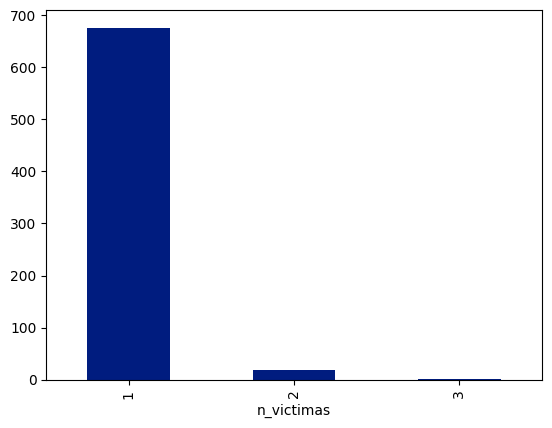

In [64]:
sns.set_palette("dark")
homicidios.n_victimas.value_counts().plot(kind="bar")

<p>Como puede verse, la mayoría de casos registrados solo tuvieron una víctima. Hay 19 que tuvieron dos víctimas, y uno que tuvo tres.

### Fecha y hora

<p>A continuación, se revisarán los patrones generales por año, mes, día del año, día de la semana y hora.

In [74]:
#Contar valores por fecha
homicidios_year = homicidios.fecha.dt.year.value_counts().sort_index().reset_index()
homicidios_year.columns = ["año", "n_victimas"]
homicidios_year = homicidios_year.astype(int)

#Contar valores por hora
homicidios_month = homicidios.fecha.dt.month.value_counts().sort_index().reset_index()
homicidios_month.columns = ["mes", "n_victimas"]
homicidios_month.mes = ["Enero", "Febrero", "Marzo", "Abril", "Mayo", "Junio", "Julio", "Agosto", "Septiembre", "Octubre", "Noviembre", "Diciembre"]

#Contar valores por día del año
homicidios_day = homicidios.fecha.dt.day_of_year.value_counts().sort_index().reset_index()
homicidios_day.columns = ["día_año", "n_victimas"]
homicidios_day = homicidios_day.astype(int)

#Contar valores por día de la semana
homicidios_day_of_week = homicidios.fecha.dt.day_of_week.value_counts().sort_index().reset_index()
homicidios_day_of_week.columns = ["dia_semana", "n_victimas"]
homicidios_day_of_week.dia_semana = ["Lunes", "Martes", "Miércoles", "Jueves", "Viernes", "Sábado", "Domingo"]

#Contar valores por hora
homicidios_hour = homicidios.fecha.dt.hour.value_counts().sort_index().reset_index()
homicidios_hour.columns = ["hora", "n_victimas"]
homicidios_hour = homicidios_hour.astype(int)

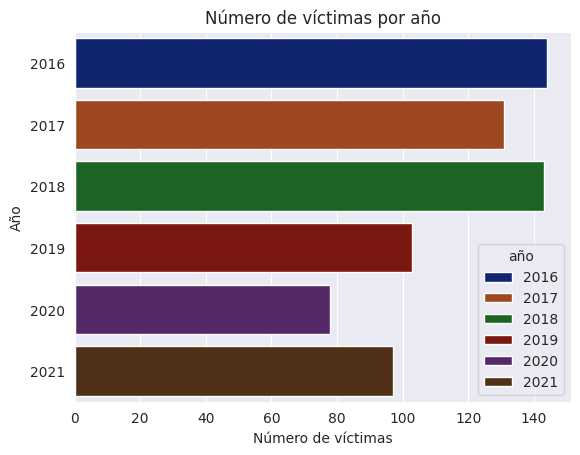

In [79]:
sns.set_style("darkgrid")
fig = sns.barplot(x="n_victimas", y="año", hue="año", data=homicidios_year, orient="h", palette="dark").set(title="Número de víctimas por año", xlabel="Número de víctimas", ylabel="Año")

<p>Los años con más registros son 2016 y 2018, y en total hay más víctimas de sucesos fatales los primeros tres años.

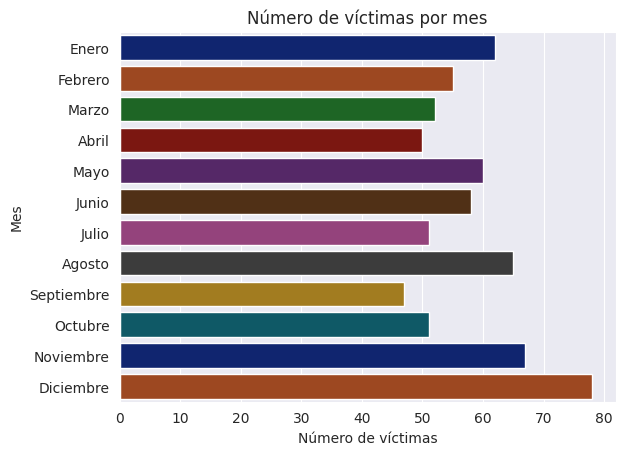

In [80]:
fig = sns.barplot(x="n_victimas", y="mes", hue="mes", data=homicidios_month, orient="h", palette="dark").set(title="Número de víctimas por mes", xlabel="Número de víctimas", ylabel="Mes")

<p>Diciembre es claramente el mes con más víctimas fatales, probablemente debido a que suele ser un mes con eventos festivos y en el que la gente acostumbra a salir de paseo.

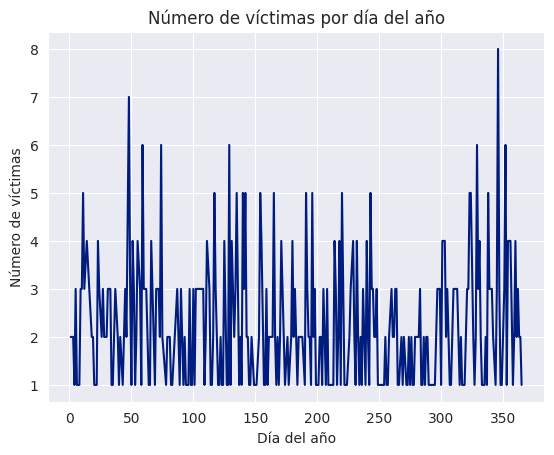

In [85]:
fig = sns.lineplot(x="día_año", y="n_victimas", data=homicidios_day).set(title="Número de víctimas por día del año", xlabel="Día del año", ylabel="Número de víctimas")

<p>De nuevo, el mayor pico en el total de accidentes está en un día de Diciembre, poco antes del #350 (que correspondería a Navidad). Además, hay otro pico cerca del día 50, es decir, en la segunda mitad de febrero. Por otra parte, los días con menos víctimas están entre los días de septiembre y octubre, y marzo y abril.

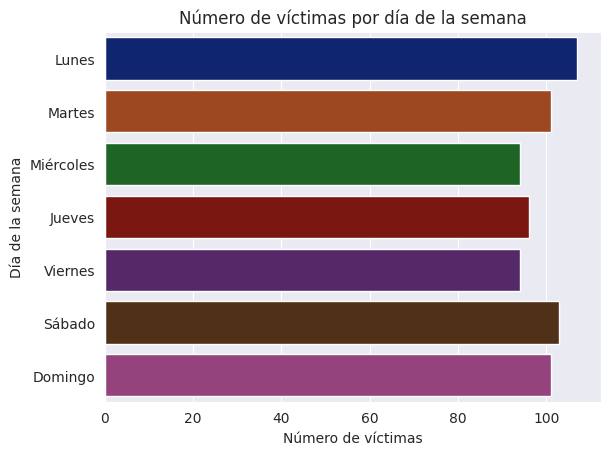

In [87]:
fig = sns.barplot(x="n_victimas", y="dia_semana", hue="dia_semana", data=homicidios_day_of_week, orient="h", palette="dark").set(title="Número de víctimas por día de la semana", xlabel="Número de víctimas", ylabel="Día de la semana")

<p>Aunque no se nota variaciones destacables entre los días, puede verse que el día con mayores víctimas de accidentes es el lunes.

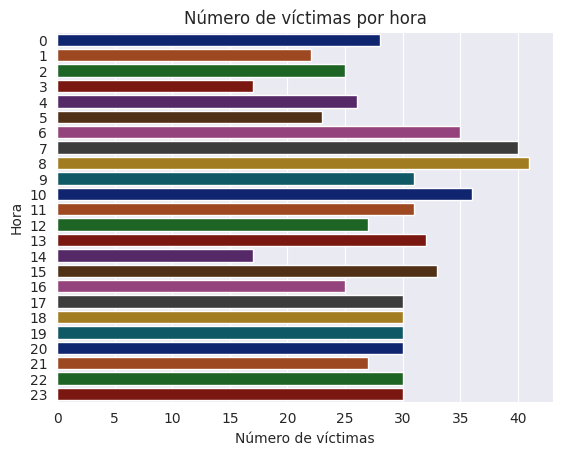

In [90]:
fig = sns.barplot(x="n_victimas", y="hora", hue="hora", data=homicidios_hour, orient="h", palette="dark", legend=False).set(title="Número de víctimas por hora", xlabel="Número de víctimas", ylabel="Hora")

<p>Según este gráfico, las horas en que es fueron más comunes los accidentes con víctimas fatales son las 8 y las 7 de la mañana, el inicio de la jornada laboral para gran parte de la población. Por otra parte, las horas con menos accidentes son las 2 de la tarde y las 3 de la madrugada, horas en que es poco común que las personas deban conducir.

### Geolocalización

<p>A continuación, se explorarán los datos basándose en la ubicación geográfica.

In [106]:
mask = (homicidios.lat != np.nan) & (homicidios.lon != np.nan)
homicidios_geomap = homicidios[mask]
homicidios_geomap.lat = homicidios_geomap.lat.astype(float)
homicidios_geomap.lon = homicidios_geomap.lon.astype(float)

fig = px.scatter_mapbox(homicidios_geomap, lat="lat", lon="lon", zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

<p>El mapa muestra que los casos parecen concentrarse un poco más en la zona Centro de la ciudad, a continuación se explorará esta hipótesis con un mapa de coropletas.

In [107]:
homicidios_comuna = homicidios.comuna.value_counts().sort_values().reset_index()
homicidios_comuna.columns = ["comuna", "n_victimas"]
fig = px.choropleth(homicidios_comuna, geojson=comunas, featureidkey="properties.COMUNAS", locations="comuna", color="n_victimas",  fitbounds="locations")
fig.update_layout(mapbox_style="carto-positron")
fig.show()

<p>El mapa de coropletas muestra que las comunas con mayor conteo de casos son la 1 y la 4, ubicadas en el centro dee la ciudad.

In [110]:
fig = px.scatter_mapbox(homicidios_geomap, lat="lat", lon="lon", color="victima", zoom=10)
fig.update_layout(mapbox_style="carto-positron")
fig.show()

<p>Siguiendo con el análisis en la zona centro, parece ser que en el centro de la ciudad es más común que la víctima del suceso sea el peatón. Por otra parte, un vistazo general a toda la ciudad muestra que la víctima más común son los mototaxistas.

In [111]:
fig = px.scatter_mapbox(homicidios_geomap, lat="lat", lon="lon", color="acusado", zoom=10)
fig.update_layout(mapbox_style="carto-positron")
fig.show()

<p>Siguiendo con el contraste anterior, en la zona centro es más común que el acusado sea el pasajero, pero en toda la ciudad predomina que el acusado sea el auto.

### Tipos de víctimas y de acusados, y combinaciones de víctimas y acusados

<p>A continuación se muestra el conteo general de víctimas y de acusados.

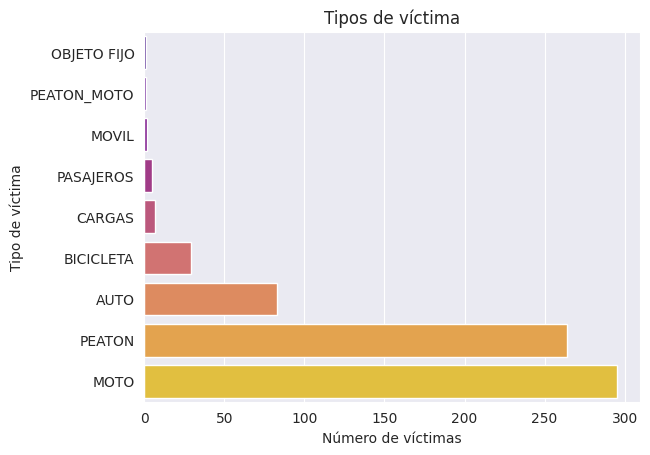

In [112]:
homicidios_victimas = homicidios.victima.value_counts().drop("SD").sort_values().reset_index()
ax = sns.barplot(x="count", y="victima", data=homicidios_victimas, hue="victima", palette="plasma", label="count").set(title="Tipos de víctima", xlabel="Número de víctimas", ylabel="Tipo de víctima")

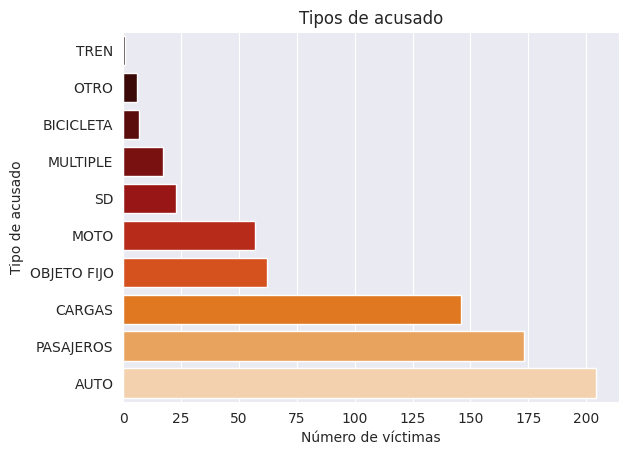

In [113]:
homicidios_acusados = homicidios.acusado.value_counts().sort_values().reset_index()
ax = sns.barplot(x="count", y="acusado", data=homicidios_acusados, hue="acusado", palette="gist_heat", label="count").set(title="Tipos de acusado", xlabel="Número de víctimas", ylabel="Tipo de acusado")

In [103]:
homicidios_victimas_acusados = homicidios.groupby(["victima", "acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
homicidios_victimas_acusados

,victima,acusado,n_victimas
0,PEATON,PASAJEROS,105
1,MOTO,AUTO,84
2,MOTO,CARGAS,80
3,PEATON,AUTO,79
4,MOTO,PASAJEROS,50
5,MOTO,OBJETO FIJO,40
6,PEATON,CARGAS,38
7,AUTO,AUTO,33
8,PEATON,MOTO,30
9,AUTO,OBJETO FIJO,26


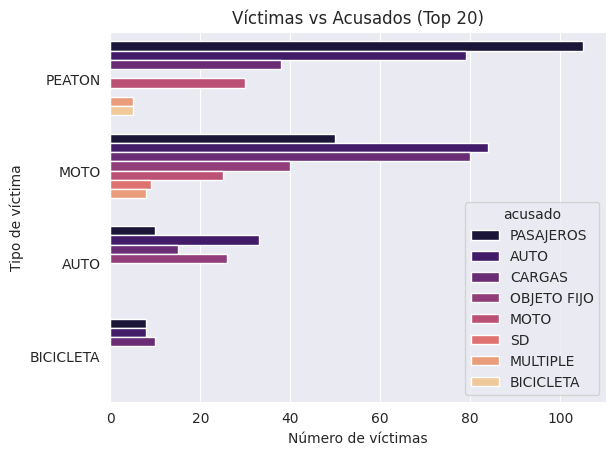

In [116]:
fig = sns.barplot(x="n_victimas", y="victima", hue="acusado", data=homicidios_victimas_acusados.head(20), palette="magma").set(title="Víctimas vs Acusados (Top 20)", xlabel="Número de víctimas", ylabel="Tipo de víctima")

<p>Teniendo en cuenta que el tipo de acusado "pasajero" es (mayormente) el pasajero del auto, parece ser que lo más común es que la víctima sea el peatón y el acusado sea el conductor o el pasajero de un auto. Además, estas categorías y la de camiones de carga son los acusados más comunes en casos donde la víctima es un mototaxista, que resulta ser la clase de víctima más común.

###Homicidios por tipo de calle

<Axes: xlabel='count', ylabel='tipo_calle'>

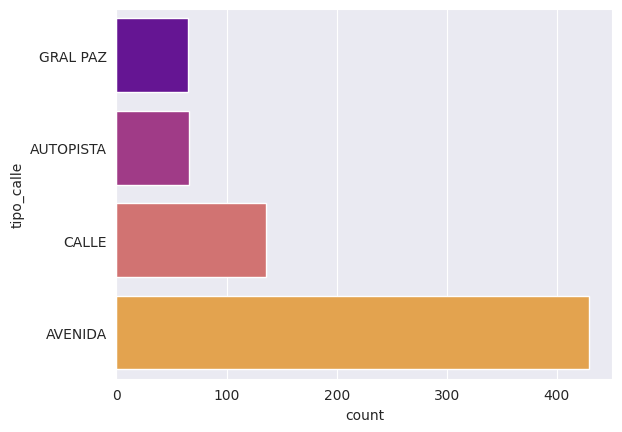

In [105]:
homicidios_tipo_calle = homicidios.tipo_calle.value_counts().sort_values().reset_index()
sns.barplot(x="count", y="tipo_calle", data=homicidios_tipo_calle, hue="tipo_calle", palette="plasma", label="count")

<p>Por un gran margen, la mayoría de estos casos suceden en avenidas. Además, solo en la avenida General Paz sucedieron casi la misma cantidad de hechos que en las autopistas.

##Análisis multivariable

In [91]:
homicidios.head()

,hecho_id,n_victimas,fecha,tipo_calle,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima,acusado
0,2016-0001,1,2016-01-01 05:00:00+00:00,AVENIDA,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,-34.687570,-58.475340,MOTO-AUTO,MOTO,AUTO
1,2016-0002,1,2016-01-02 02:15:00+00:00,GRAL PAZ,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,-34.669777,-58.508775,AUTO-PASAJEROS,AUTO,PASAJEROS
2,2016-0003,1,2016-01-03 08:00:00+00:00,AVENIDA,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,1,-34.631894,-58.390403,MOTO-AUTO,MOTO,AUTO
3,2016-0004,1,2016-01-10 01:00:00+00:00,AVENIDA,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,-34.680930,-58.465039,MOTO-SD,MOTO,SD
4,2016-0005,1,2016-01-21 06:20:00+00:00,AVENIDA,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,-34.622466,-58.387183,MOTO-PASAJEROS,MOTO,PASAJEROS


**Víctimas y acusados por número de víctima**

Número de víctimas: 1
      victima      acusado  n_victimas
0      PEATON    PASAJEROS         105
1        MOTO         AUTO          82
2        MOTO       CARGAS          76
3      PEATON         AUTO          75
4        MOTO    PASAJEROS          42
5        MOTO  OBJETO FIJO          40
6      PEATON       CARGAS          38
7      PEATON         MOTO          30
8        AUTO         AUTO          29
9        MOTO         MOTO          25
10       AUTO  OBJETO FIJO          17
11       AUTO       CARGAS          13
12  BICICLETA       CARGAS          10
13       MOTO           SD           9
14       AUTO    PASAJEROS           8
15  BICICLETA    PASAJEROS           8
16  BICICLETA         AUTO           8
17       MOTO     MULTIPLE           8
18     PEATON     MULTIPLE           5
19     PEATON    BICICLETA           5
20         SD           SD           5
21     CARGAS       CARGAS           4
22       MOTO         OTRO           4
23       AUTO           SD           4
24 

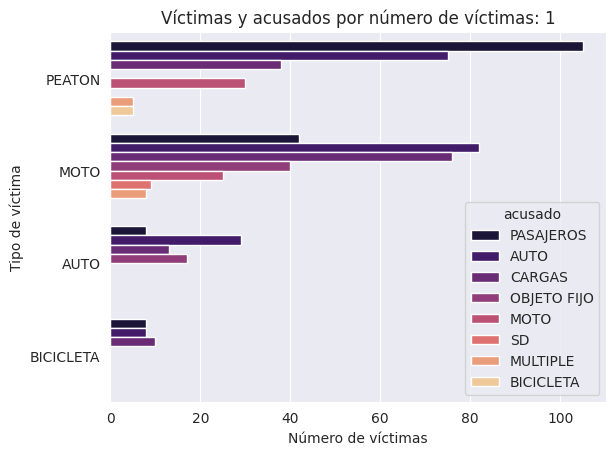

Número de víctimas: 2
        victima      acusado  n_victimas
0          MOTO    PASAJEROS           8
1          AUTO  OBJETO FIJO           6
2          AUTO         AUTO           4
3          MOTO       CARGAS           4
4        PEATON         AUTO           4
5          AUTO       CARGAS           2
6          AUTO    PASAJEROS           2
7          MOTO         AUTO           2
8         MOVIL       CARGAS           2
9   OBJETO FIJO         AUTO           2
10  PEATON_MOTO         MOTO           2


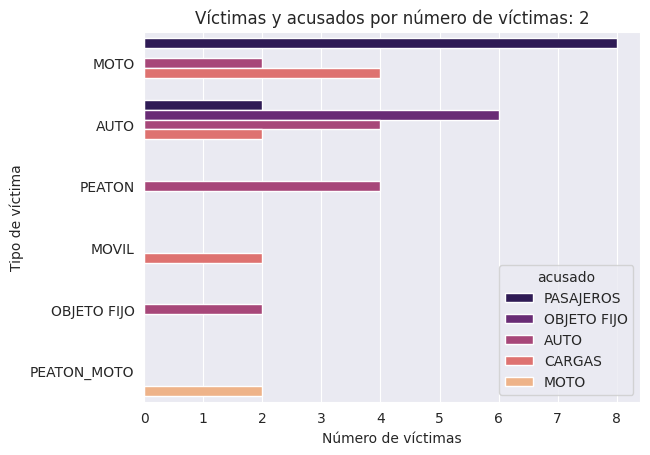

Número de víctimas: 3
  victima      acusado  n_victimas
0    AUTO  OBJETO FIJO           3


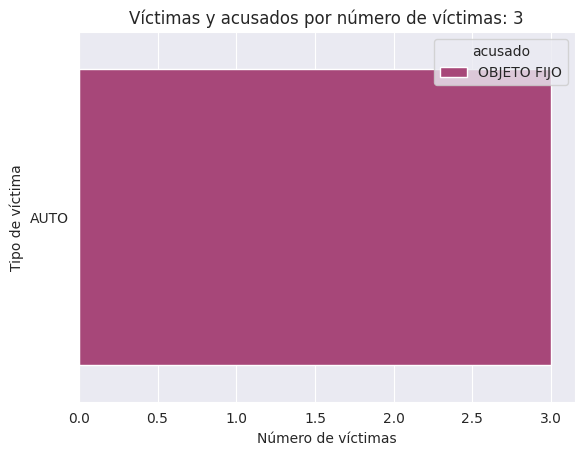

In [117]:
for num in homicidios.n_victimas.unique():
  print(f"Número de víctimas: {num}")
  homicidios_grp = homicidios[homicidios.n_victimas == num].groupby(["victima", "acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="acusado", data=homicidios_grp.head(20), palette="magma").set(title=f"Víctimas y acusados por número de víctimas: {num}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

<p>En los casos con más de una víctima, la combinación más común es la de víctima moto y acusado pasajero (que, en el caso de las motos, bien podría ser el pasajero de la misma). Además, en el único caso con 3 víctimas lo ocurrido fue un choque con un objeto fijo.

**Tipos de acusado por número de víctimas**

Número de víctimas: 1
       acusado  n_victimas
0         AUTO         198
1    PASAJEROS         168
2       CARGAS         142
3  OBJETO FIJO          58
4         MOTO          56
5           SD          23
6     MULTIPLE          17
7    BICICLETA           7
8         OTRO           6
9         TREN           1


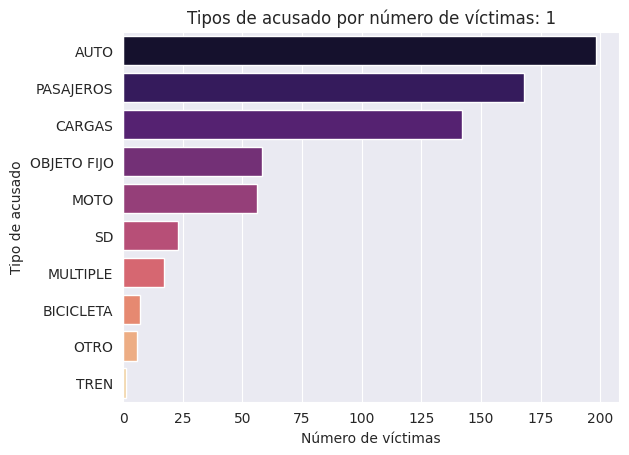

Número de víctimas: 2
       acusado  n_victimas
0         AUTO          12
1    PASAJEROS          10
2       CARGAS           8
3  OBJETO FIJO           6
4         MOTO           2


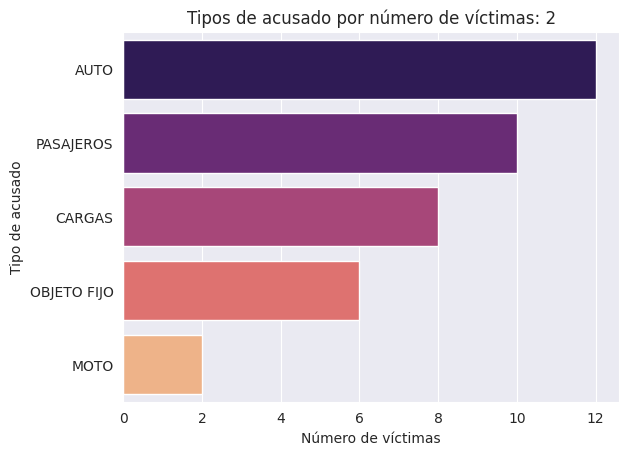

Número de víctimas: 3
       acusado  n_victimas
0  OBJETO FIJO           3


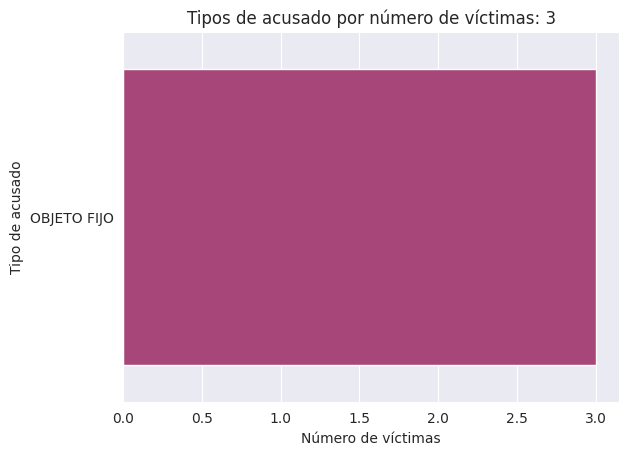

In [118]:
for num in homicidios.n_victimas.unique():
  print(f"Número de víctimas: {num}")
  homicidios_grp = homicidios[homicidios.n_victimas == num].groupby(["acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="acusado", hue="acusado", data=homicidios_grp.head(20), palette="magma").set(title=f"Tipos de acusado por número de víctimas: {num}", xlabel="Número de víctimas", ylabel="Tipo de acusado")
  plt.show()

Número de víctimas: 1
     victima  n_victimas
0       MOTO         288
1     PEATON         262
2       AUTO          75
3  BICICLETA          29
4         SD           9
5     CARGAS           7
6  PASAJEROS           5
7      MOVIL           1


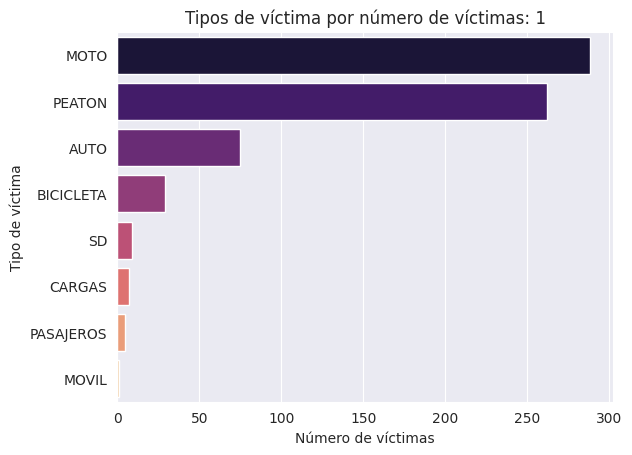

Número de víctimas: 2
       victima  n_victimas
0         AUTO          14
1         MOTO          14
2       PEATON           4
3        MOVIL           2
4  OBJETO FIJO           2
5  PEATON_MOTO           2


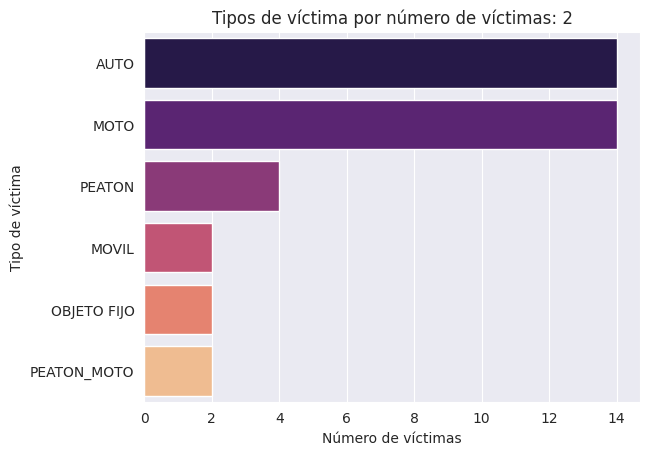

Número de víctimas: 3
  victima  n_victimas
0    AUTO           3


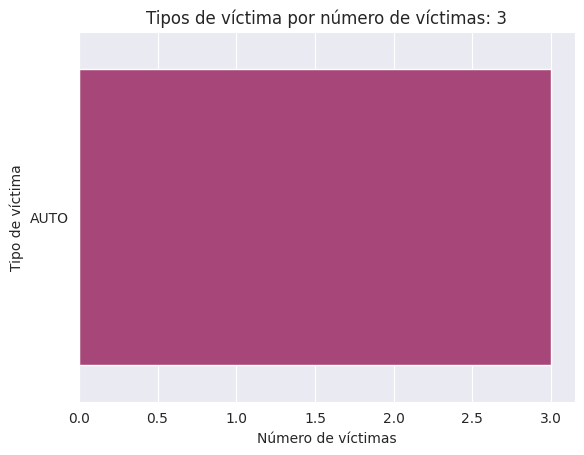

In [119]:
for num in homicidios.n_victimas.unique():
  print(f"Número de víctimas: {num}")
  homicidios_grp = homicidios[homicidios.n_victimas == num].groupby(["victima"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="victima", data=homicidios_grp.head(20), palette="magma").set(title=f"Tipos de víctima por número de víctimas: {num}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

<p>Para el caso de accidentes con dos víctimas, los conductores de auto y los de moto tienen la mayor cantidad de ocurrencias, aunque los conductores de autos son mucho menos frecuentes en casos con una sola víctima.

**Número de víctimas por tipo de víctima/acusado en cada comuna**

Comuna: 0
Total de victimas en la comuna 0: 2
  victima  n_victimas
0  PEATON           1
1      SD           1


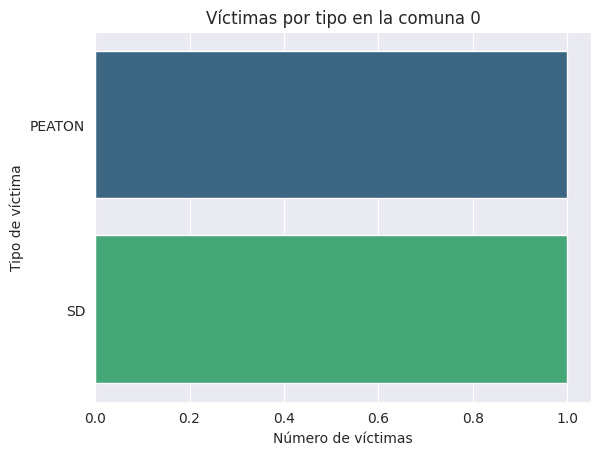

Comuna: 1
Total de victimas en la comuna 1: 93
     victima  n_victimas
0     PEATON          45
1       MOTO          36
2       AUTO           6
3  BICICLETA           4
4     CARGAS           1
5      MOVIL           1


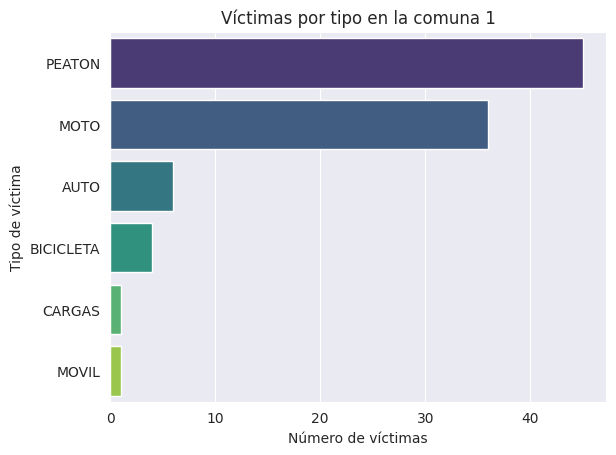

Comuna: 2
Total de victimas en la comuna 2: 25
     victima  n_victimas
0     PEATON          14
1       MOTO           5
2       AUTO           3
3  BICICLETA           3


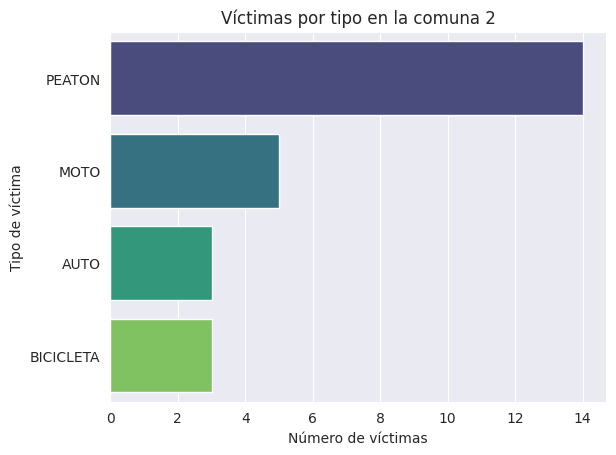

Comuna: 3
Total de victimas en la comuna 3: 46
     victima  n_victimas
0       MOTO          20
1     PEATON          17
2       AUTO           6
3  BICICLETA           3


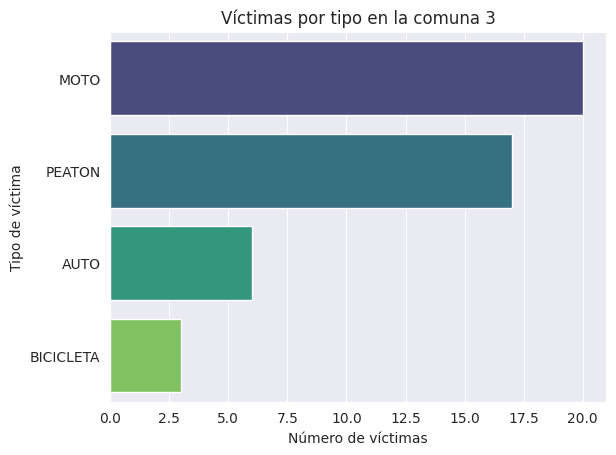

Comuna: 4
Total de victimas en la comuna 4: 79
     victima  n_victimas
0       MOTO          32
1     PEATON          30
2       AUTO           6
3  BICICLETA           5
4     CARGAS           2
5      MOVIL           2
6  PASAJEROS           1
7         SD           1


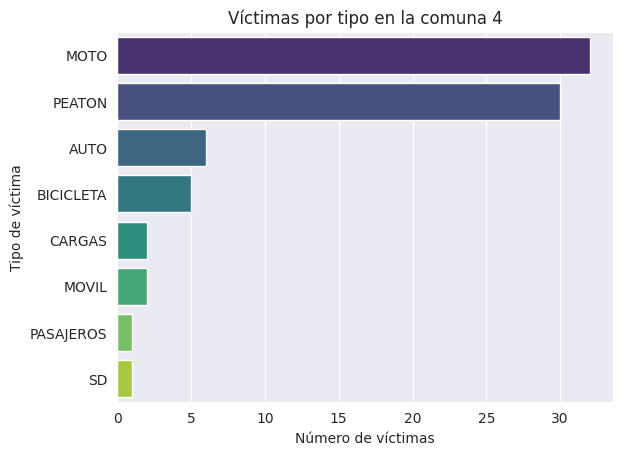

Comuna: 5
Total de victimas en la comuna 5: 22
  victima  n_victimas
0  PEATON          12
1    MOTO           9
2    AUTO           1


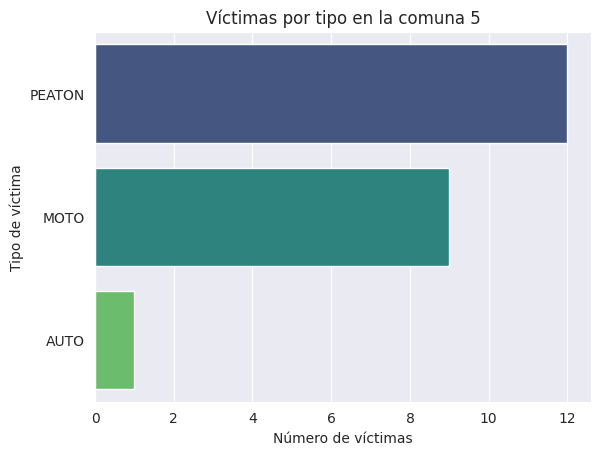

Comuna: 6
Total de victimas en la comuna 6: 22
     victima  n_victimas
0       MOTO          11
1     PEATON           8
2       AUTO           2
3  BICICLETA           1


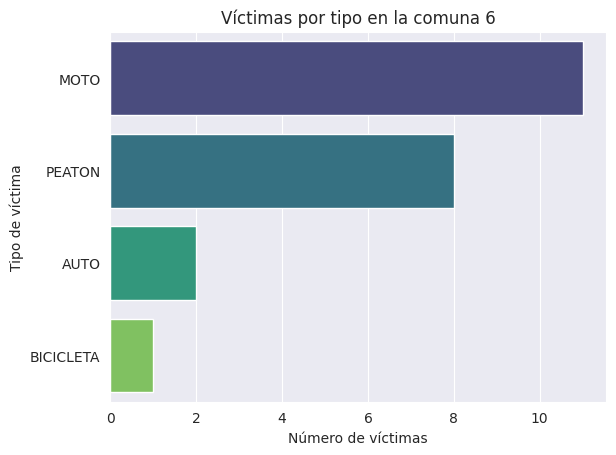

Comuna: 7
Total de victimas en la comuna 7: 62
     victima  n_victimas
0       MOTO          26
1     PEATON          22
2       AUTO          11
3  BICICLETA           2
4         SD           1


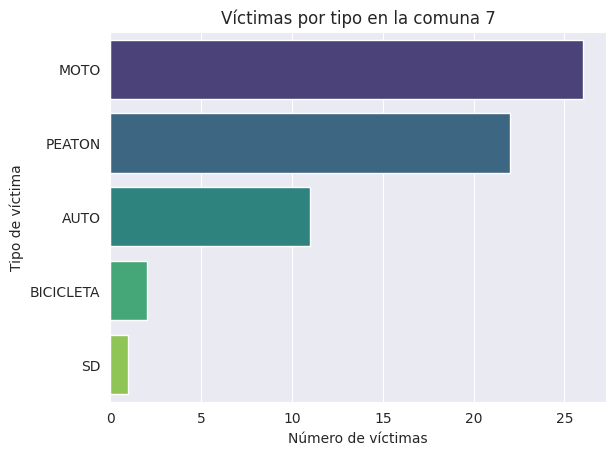

Comuna: 8
Total de victimas en la comuna 8: 67
     victima  n_victimas
0       MOTO          32
1     PEATON          18
2       AUTO          16
3  BICICLETA           1


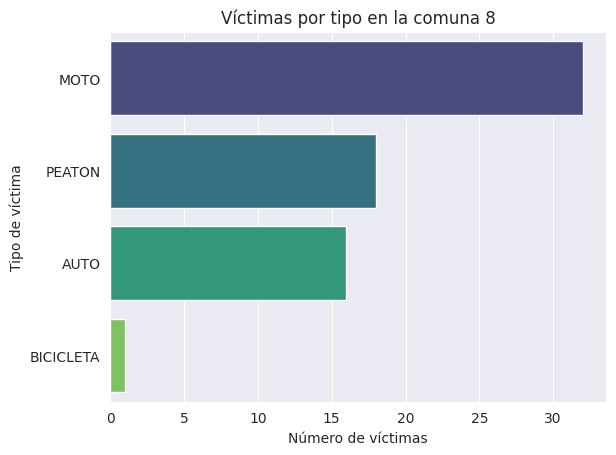

Comuna: 9
Total de victimas en la comuna 9: 75
     victima  n_victimas
0     PEATON          25
1       MOTO          21
2       AUTO          20
3         SD           4
4  BICICLETA           3
5     CARGAS           2


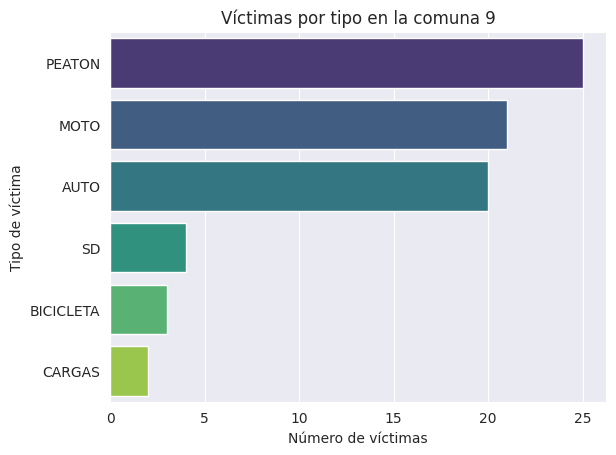

Comuna: 10
Total de victimas en la comuna 10: 30
     victima  n_victimas
0       MOTO          16
1     PEATON           7
2       AUTO           4
3  BICICLETA           2
4  PASAJEROS           1


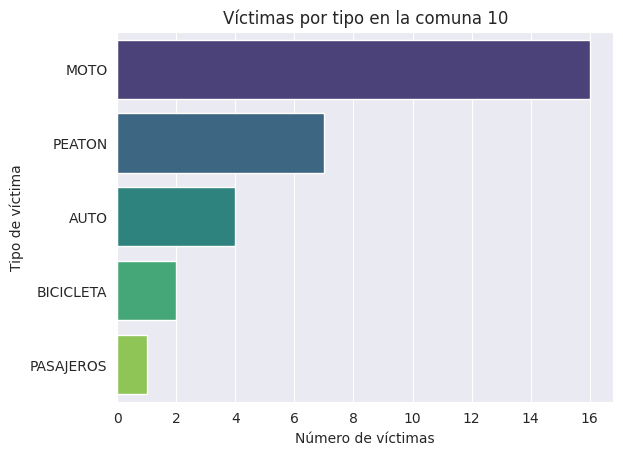

Comuna: 11
Total de victimas en la comuna 11: 33
       victima  n_victimas
0         MOTO          19
1       PEATON           7
2         AUTO           3
3  PEATON_MOTO           2
4    BICICLETA           1
5       CARGAS           1


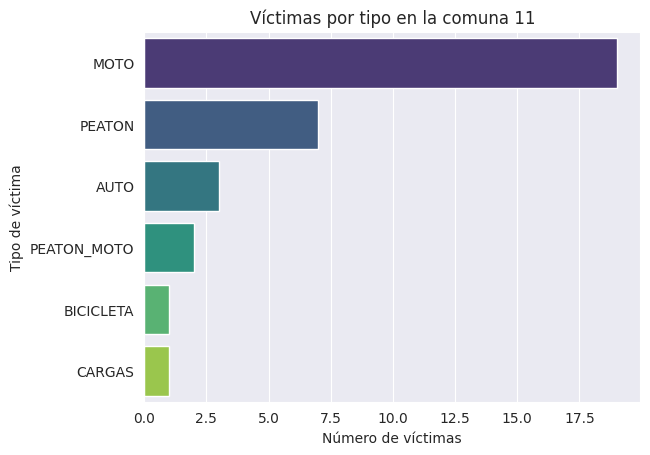

Comuna: 12
Total de victimas en la comuna 12: 39
       victima  n_victimas
0         MOTO          22
1       PEATON           7
2         AUTO           4
3  OBJETO FIJO           2
4           SD           2
5    BICICLETA           1
6       CARGAS           1


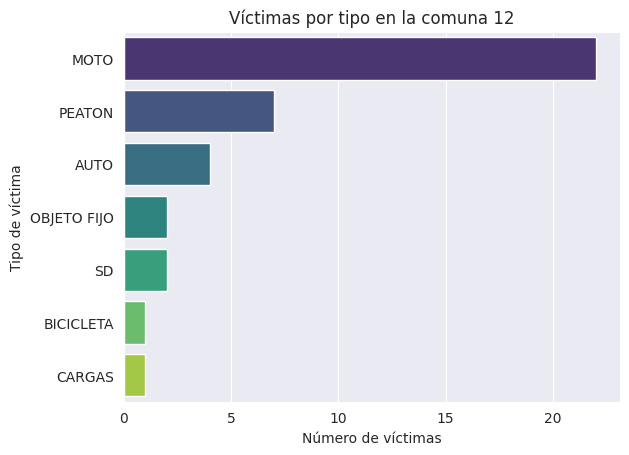

Comuna: 13
Total de victimas en la comuna 13: 40
     victima  n_victimas
0     PEATON          17
1       MOTO          16
2       AUTO           4
3  PASAJEROS           2
4  BICICLETA           1


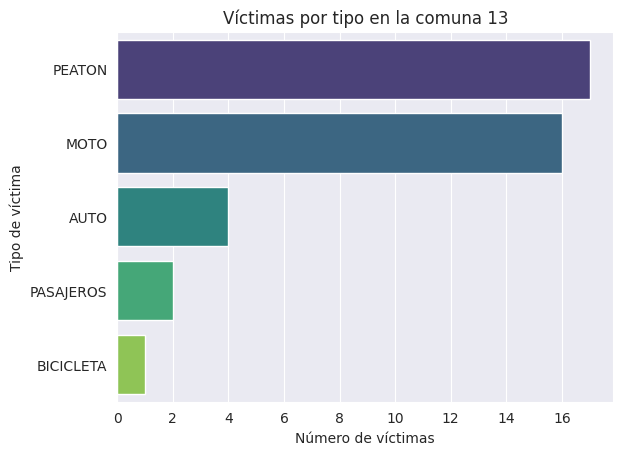

Comuna: 14
Total de victimas en la comuna 14: 37
     victima  n_victimas
0       MOTO          16
1     PEATON          16
2       AUTO           3
3  BICICLETA           2


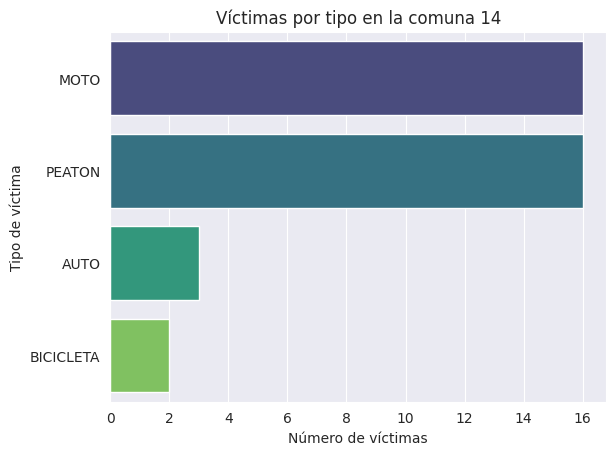

Comuna: 15
Total de victimas en la comuna 15: 45
     victima  n_victimas
0       MOTO          21
1     PEATON          20
2       AUTO           3
3  PASAJEROS           1


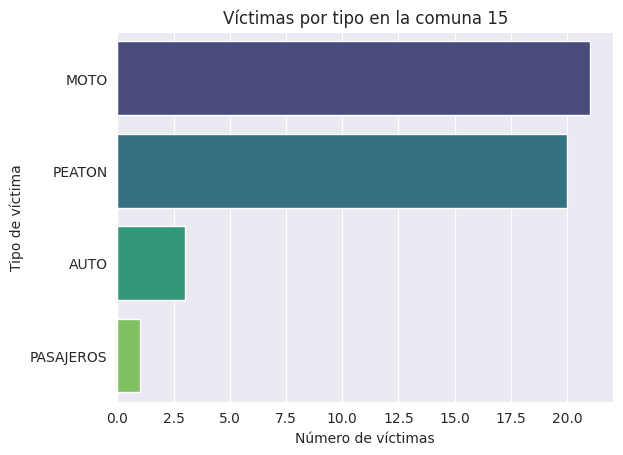

In [120]:
for com in homicidios.comuna.sort_values().unique():
  print(f"Comuna: {com}")
  homicidios_grp = homicidios[homicidios.comuna == com].groupby(["victima"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de victimas en la comuna {com}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="victima", data=homicidios_grp.head(20), palette="viridis").set(title=f"Víctimas por tipo en la comuna {com}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

Comuna: 0
Total de acusados en la comuna 0: 2
  acusado  n_victimas
0      SD           2


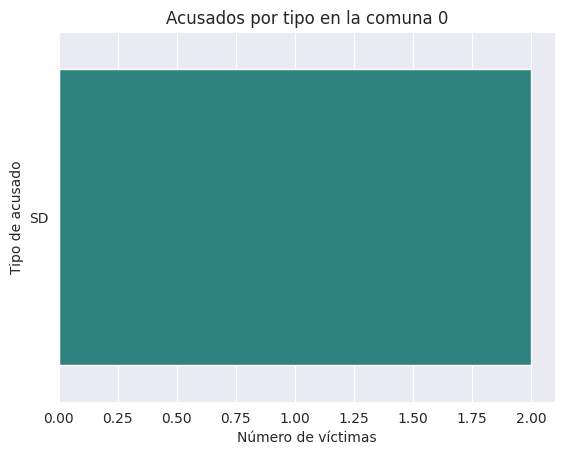

Comuna: 1
Total de acusados en la comuna 1: 93
       acusado  n_victimas
0    PASAJEROS          37
1         AUTO          21
2       CARGAS          18
3  OBJETO FIJO           7
4         MOTO           5
5    BICICLETA           2
6           SD           2
7     MULTIPLE           1


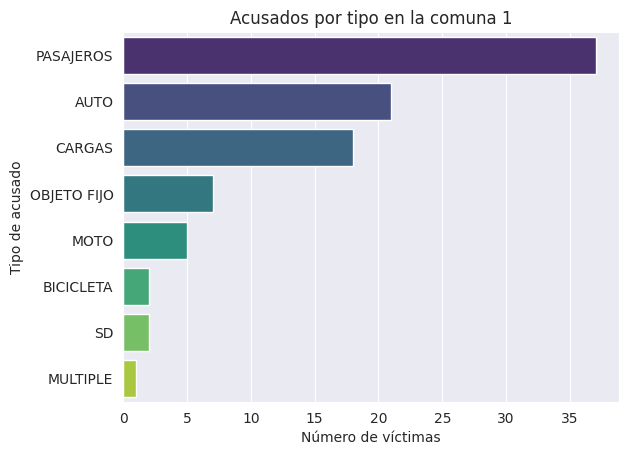

Comuna: 2
Total de acusados en la comuna 2: 25
       acusado  n_victimas
0         AUTO           7
1    PASAJEROS           7
2       CARGAS           5
3  OBJETO FIJO           3
4         MOTO           2
5     MULTIPLE           1


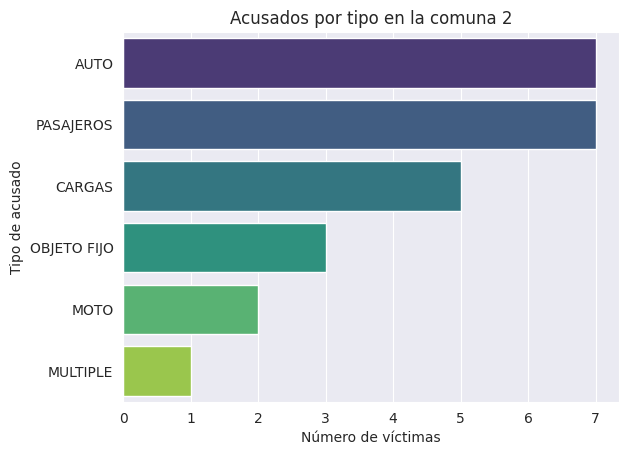

Comuna: 3
Total de acusados en la comuna 3: 46
       acusado  n_victimas
0         AUTO          15
1    PASAJEROS          13
2         MOTO           7
3       CARGAS           6
4  OBJETO FIJO           4
5     MULTIPLE           1


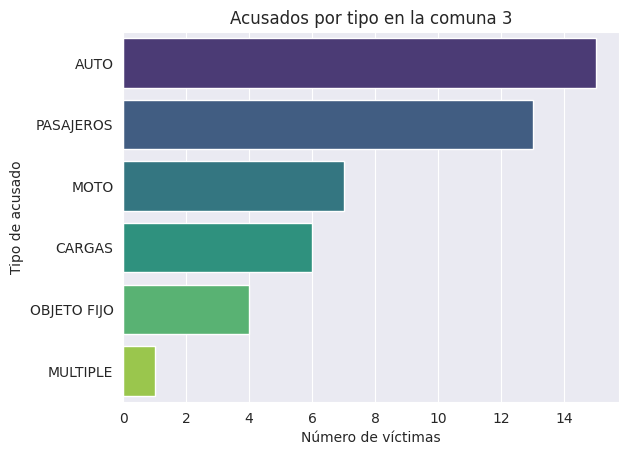

Comuna: 4
Total de acusados en la comuna 4: 79
       acusado  n_victimas
0       CARGAS          28
1    PASAJEROS          25
2         AUTO          17
3         MOTO           3
4  OBJETO FIJO           3
5     MULTIPLE           1
6         OTRO           1
7           SD           1


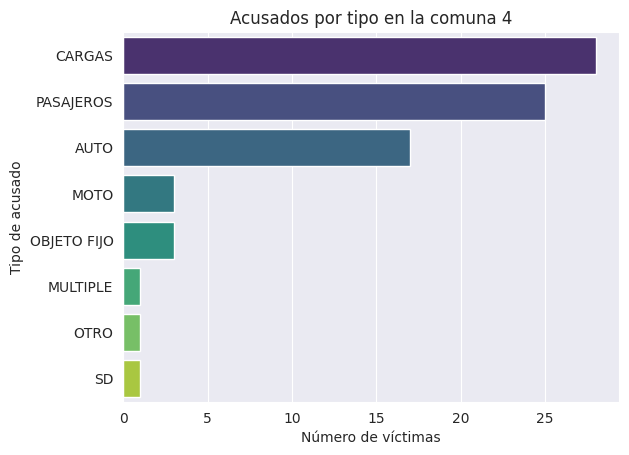

Comuna: 5
Total de acusados en la comuna 5: 22
       acusado  n_victimas
0         AUTO           6
1       CARGAS           5
2    PASAJEROS           5
3         MOTO           3
4    BICICLETA           1
5  OBJETO FIJO           1
6         OTRO           1


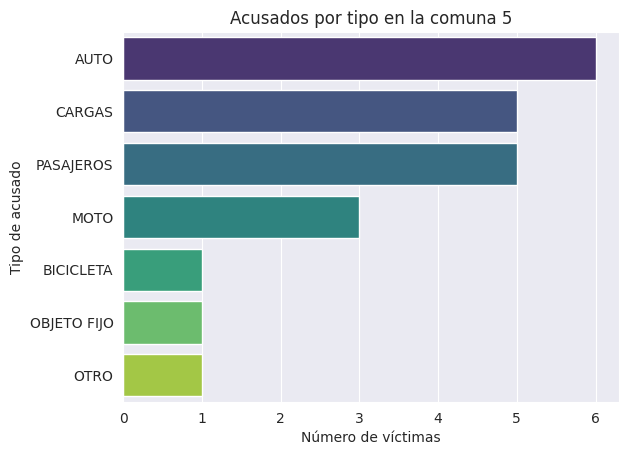

Comuna: 6
Total de acusados en la comuna 6: 22
       acusado  n_victimas
0    PASAJEROS           8
1         AUTO           7
2       CARGAS           4
3         MOTO           1
4     MULTIPLE           1
5  OBJETO FIJO           1


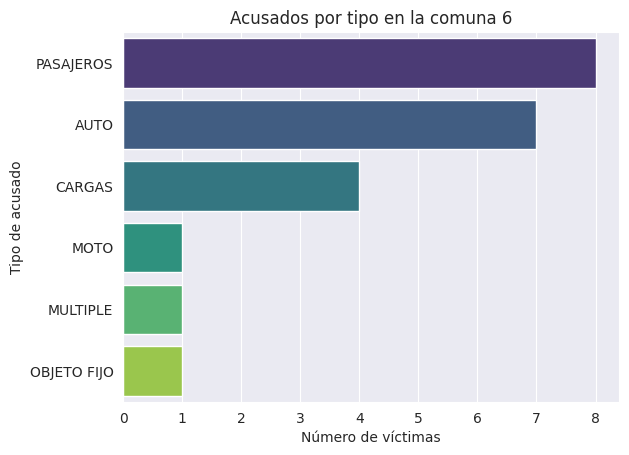

Comuna: 7
Total de acusados en la comuna 7: 62
       acusado  n_victimas
0         AUTO          23
1    PASAJEROS          11
2       CARGAS           9
3         MOTO           7
4  OBJETO FIJO           7
5     MULTIPLE           2
6           SD           2
7    BICICLETA           1


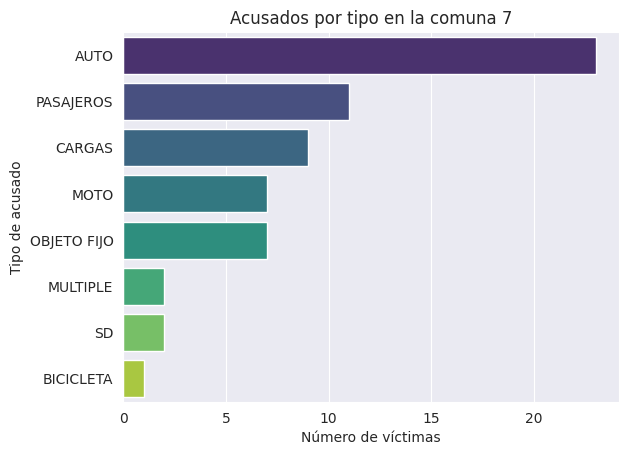

Comuna: 8
Total de acusados en la comuna 8: 67
       acusado  n_victimas
0         AUTO          18
1       CARGAS          14
2  OBJETO FIJO          13
3    PASAJEROS          11
4         MOTO           4
5           SD           4
6         OTRO           2
7     MULTIPLE           1


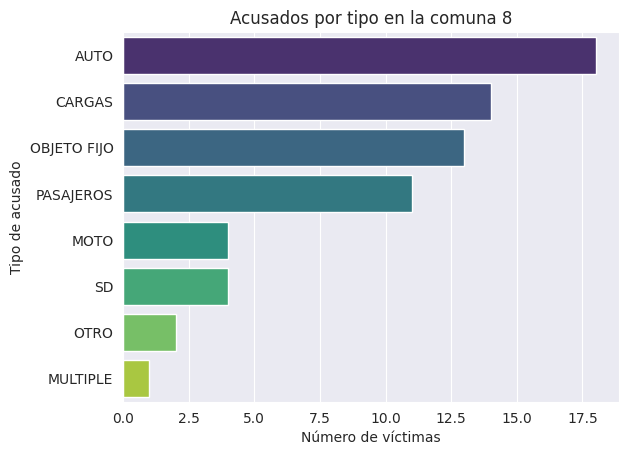

Comuna: 9
Total de acusados en la comuna 9: 75
       acusado  n_victimas
0         AUTO          21
1       CARGAS          21
2    PASAJEROS          16
3           SD           6
4  OBJETO FIJO           5
5         MOTO           4
6     MULTIPLE           2


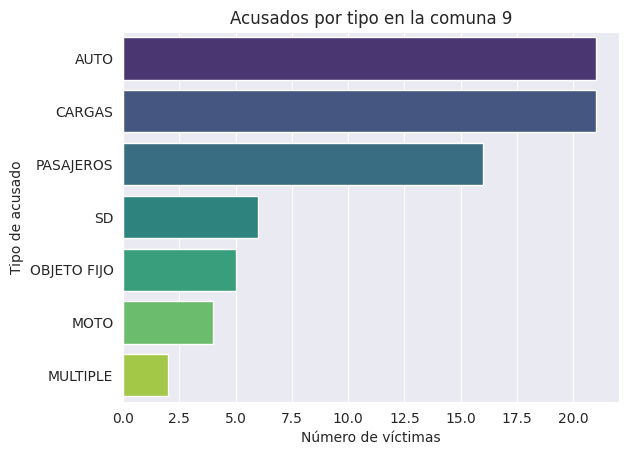

Comuna: 10
Total de acusados en la comuna 10: 30
       acusado  n_victimas
0         AUTO           9
1       CARGAS           9
2    PASAJEROS           7
3  OBJETO FIJO           3
4         MOTO           1
5         TREN           1


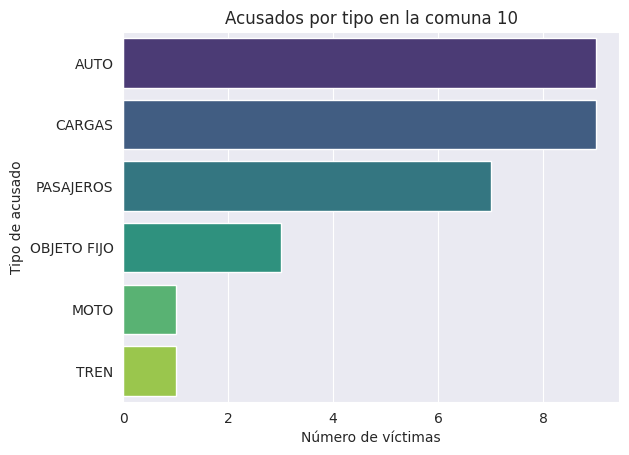

Comuna: 11
Total de acusados en la comuna 11: 33
       acusado  n_victimas
0         AUTO          12
1       CARGAS           6
2         MOTO           6
3  OBJETO FIJO           4
4    PASAJEROS           4
5         OTRO           1


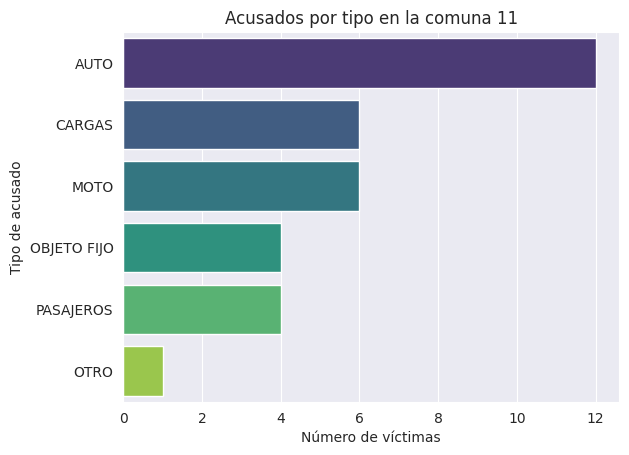

Comuna: 12
Total de acusados en la comuna 12: 39
       acusado  n_victimas
0         AUTO          14
1  OBJETO FIJO           7
2    PASAJEROS           6
3       CARGAS           4
4     MULTIPLE           3
5         MOTO           2
6           SD           2
7    BICICLETA           1


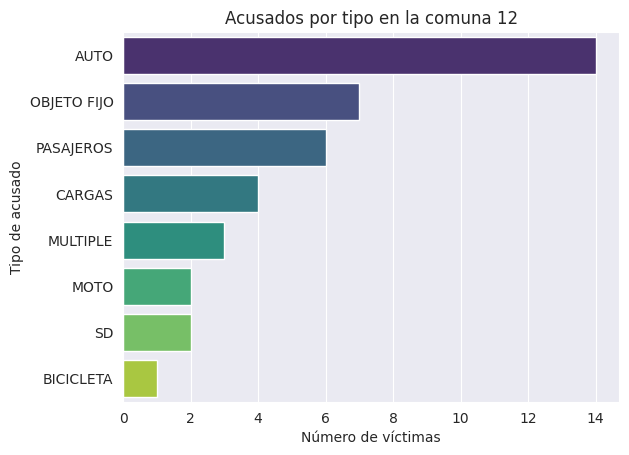

Comuna: 13
Total de acusados en la comuna 13: 40
       acusado  n_victimas
0         AUTO          12
1       CARGAS           8
2    PASAJEROS           8
3         MOTO           4
4     MULTIPLE           3
5           SD           3
6  OBJETO FIJO           2


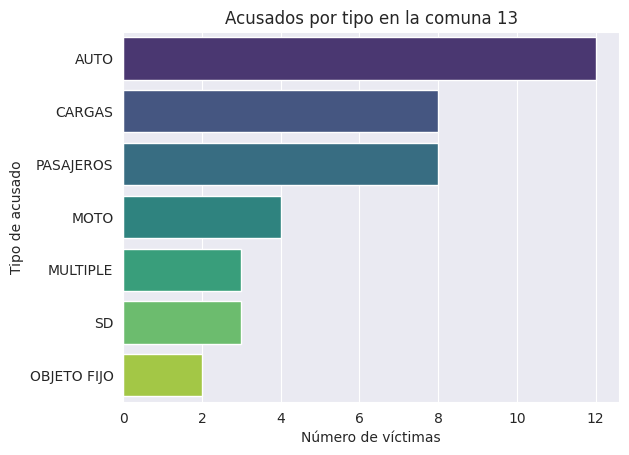

Comuna: 14
Total de acusados en la comuna 14: 37
       acusado  n_victimas
0         AUTO          17
1       CARGAS           8
2    PASAJEROS           5
3         MOTO           3
4  OBJETO FIJO           2
5    BICICLETA           1
6           SD           1


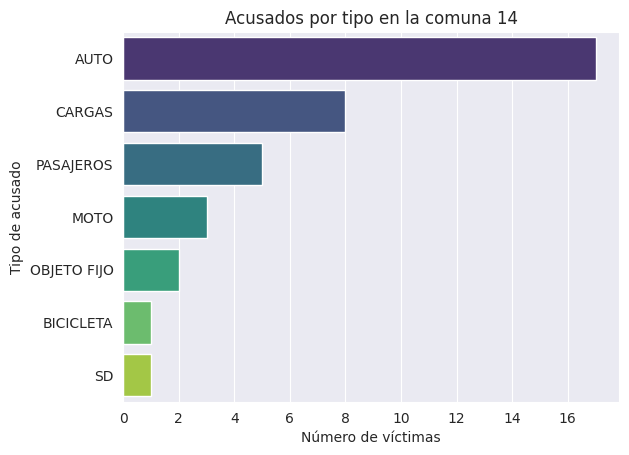

Comuna: 15
Total de acusados en la comuna 15: 45
       acusado  n_victimas
0    PASAJEROS          15
1         AUTO          11
2         MOTO           6
3       CARGAS           5
4  OBJETO FIJO           5
5    BICICLETA           1
6     MULTIPLE           1
7         OTRO           1


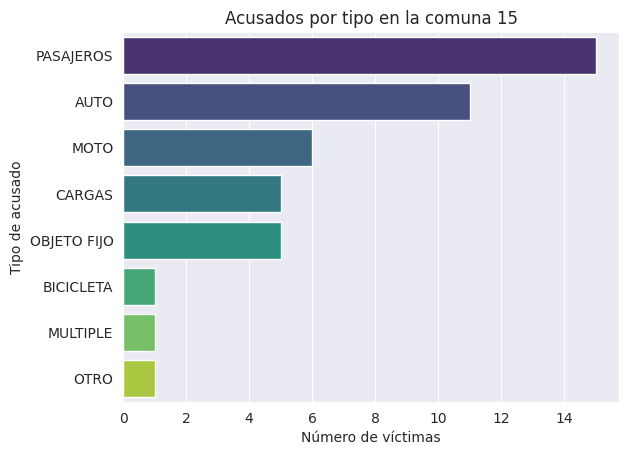

In [121]:
for com in homicidios.comuna.sort_values().unique():
  print(f"Comuna: {com}")
  homicidios_grp = homicidios[homicidios.comuna == com].groupby(["acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de acusados en la comuna {com}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="acusado", hue="acusado", data=homicidios_grp.head(20), palette="viridis").set(title=f"Acusados por tipo en la comuna {com}", xlabel="Número de víctimas", ylabel="Tipo de acusado")
  plt.show()

Comuna: 0
Total de victimas en la comuna 0: 2
  victima acusado  n_victimas
0  PEATON      SD           1
1      SD      SD           1


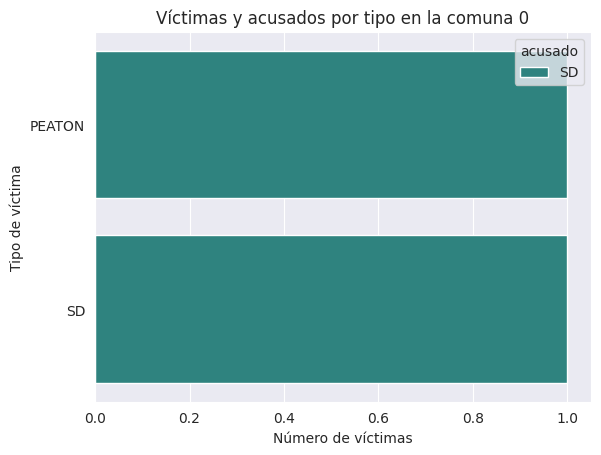

Comuna: 1
Total de victimas en la comuna 1: 93
      victima      acusado  n_victimas
0      PEATON    PASAJEROS          25
1        MOTO       CARGAS          11
2        MOTO    PASAJEROS          10
3        MOTO         AUTO           9
4      PEATON         AUTO           8
5      PEATON       CARGAS           5
6      PEATON         MOTO           4
7        MOTO  OBJETO FIJO           4
8        AUTO  OBJETO FIJO           3
9   BICICLETA       CARGAS           2
10     PEATON    BICICLETA           2
11       AUTO         AUTO           2
12     CARGAS         AUTO           1
13       MOTO         MOTO           1
14  BICICLETA    PASAJEROS           1
15       MOTO           SD           1
16      MOVIL    PASAJEROS           1
17  BICICLETA         AUTO           1
18       AUTO           SD           1
19     PEATON     MULTIPLE           1


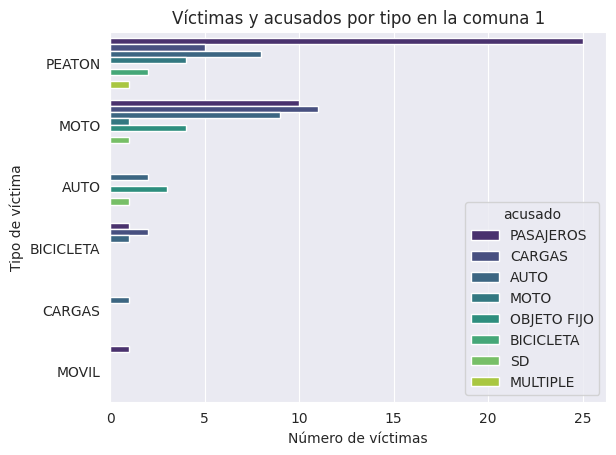

Comuna: 2
Total de victimas en la comuna 2: 25
      victima      acusado  n_victimas
0      PEATON         AUTO           5
1      PEATON    PASAJEROS           5
2        AUTO  OBJETO FIJO           3
3      PEATON       CARGAS           3
4        MOTO       CARGAS           2
5   BICICLETA         AUTO           1
6   BICICLETA     MULTIPLE           1
7   BICICLETA    PASAJEROS           1
8        MOTO         AUTO           1
9        MOTO         MOTO           1
10       MOTO    PASAJEROS           1
11     PEATON         MOTO           1


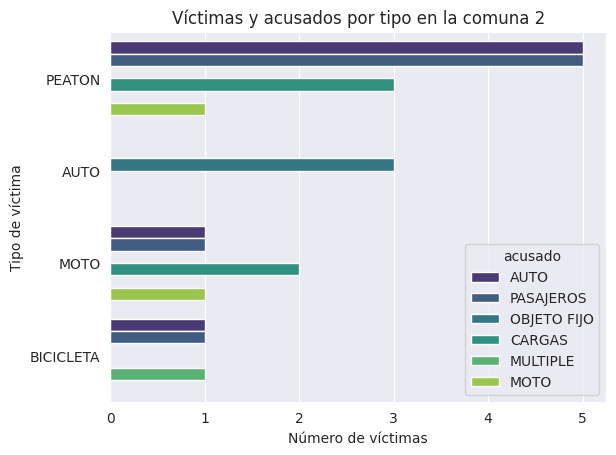

Comuna: 3
Total de victimas en la comuna 3: 46
      victima      acusado  n_victimas
0      PEATON         AUTO           9
1        MOTO    PASAJEROS           8
2        MOTO         AUTO           5
3      PEATON         MOTO           5
4        MOTO       CARGAS           3
5        AUTO       CARGAS           2
6        AUTO  OBJETO FIJO           2
7        AUTO    PASAJEROS           2
8        MOTO         MOTO           2
9        MOTO  OBJETO FIJO           2
10     PEATON    PASAJEROS           2
11  BICICLETA         AUTO           1
12  BICICLETA       CARGAS           1
13  BICICLETA    PASAJEROS           1
14     PEATON     MULTIPLE           1


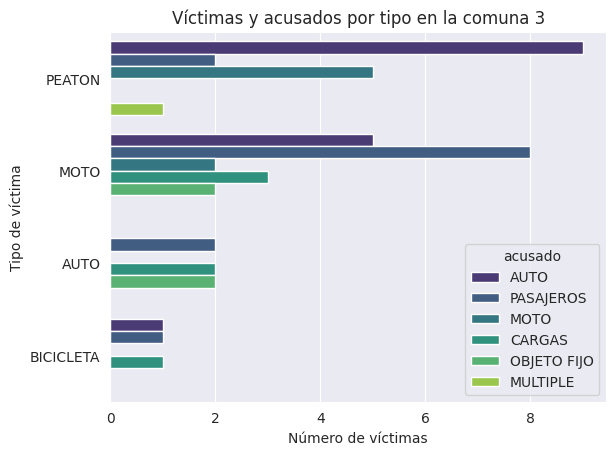

Comuna: 4
Total de victimas en la comuna 4: 79
      victima      acusado  n_victimas
0      PEATON    PASAJEROS          17
1        MOTO       CARGAS          12
2      PEATON       CARGAS           9
3        MOTO         AUTO           8
4        MOTO    PASAJEROS           6
5      PEATON         AUTO           4
6        MOTO         MOTO           3
7        AUTO         AUTO           2
8        AUTO  OBJETO FIJO           2
9   BICICLETA         AUTO           2
10  BICICLETA    PASAJEROS           2
11     CARGAS       CARGAS           2
12       AUTO       CARGAS           2
13      MOVIL       CARGAS           2
14  PASAJEROS         AUTO           1
15       MOTO     MULTIPLE           1
16       MOTO         OTRO           1
17       MOTO  OBJETO FIJO           1
18  BICICLETA       CARGAS           1
19         SD           SD           1


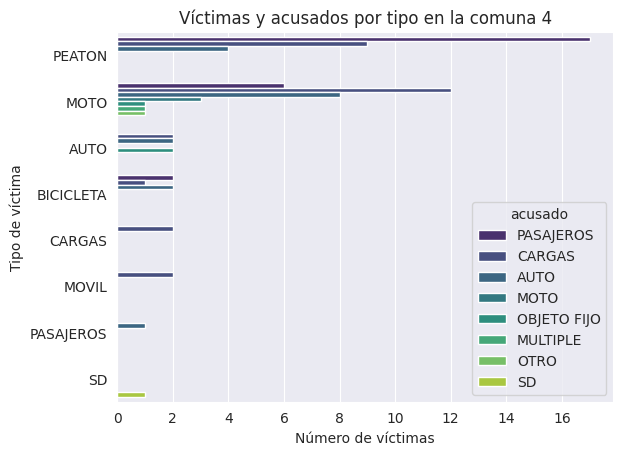

Comuna: 5
Total de victimas en la comuna 5: 22
  victima      acusado  n_victimas
0  PEATON    PASAJEROS           4
1    MOTO         AUTO           3
2    MOTO       CARGAS           3
3  PEATON         AUTO           3
4  PEATON         MOTO           3
5  PEATON       CARGAS           2
6    AUTO  OBJETO FIJO           1
7    MOTO    BICICLETA           1
8    MOTO         OTRO           1
9    MOTO    PASAJEROS           1


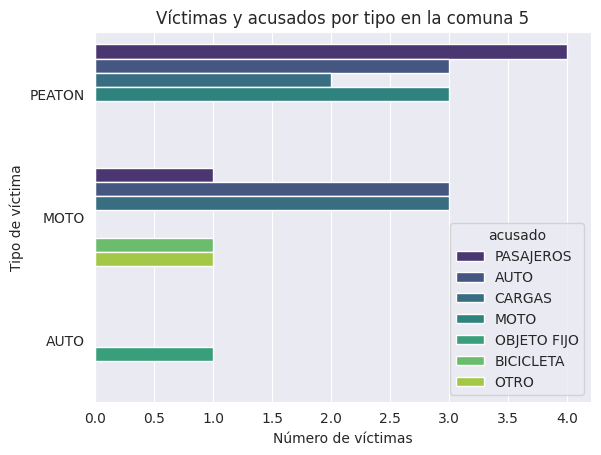

Comuna: 6
Total de victimas en la comuna 6: 22
      victima      acusado  n_victimas
0      PEATON    PASAJEROS           4
1        MOTO         AUTO           3
2        MOTO       CARGAS           3
3        MOTO    PASAJEROS           3
4        AUTO         AUTO           2
5      PEATON         AUTO           2
6   BICICLETA    PASAJEROS           1
7        MOTO     MULTIPLE           1
8        MOTO  OBJETO FIJO           1
9      PEATON       CARGAS           1
10     PEATON         MOTO           1


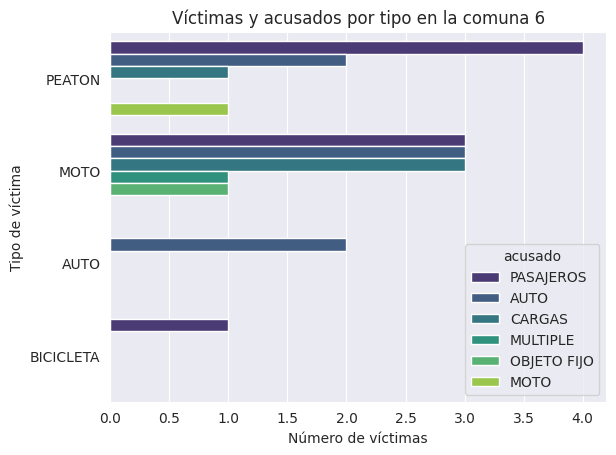

Comuna: 7
Total de victimas en la comuna 7: 62
      victima      acusado  n_victimas
0        MOTO         AUTO          10
1      PEATON    PASAJEROS           8
2      PEATON         AUTO           7
3        AUTO         AUTO           6
4        MOTO  OBJETO FIJO           5
5        MOTO       CARGAS           4
6      PEATON         MOTO           4
7        AUTO       CARGAS           3
8        MOTO         MOTO           2
9        MOTO    PASAJEROS           2
10       MOTO           SD           2
11       AUTO  OBJETO FIJO           2
12  BICICLETA    PASAJEROS           1
13       MOTO     MULTIPLE           1
14  BICICLETA       CARGAS           1
15     PEATON    BICICLETA           1
16     PEATON       CARGAS           1
17     PEATON     MULTIPLE           1
18         SD         MOTO           1


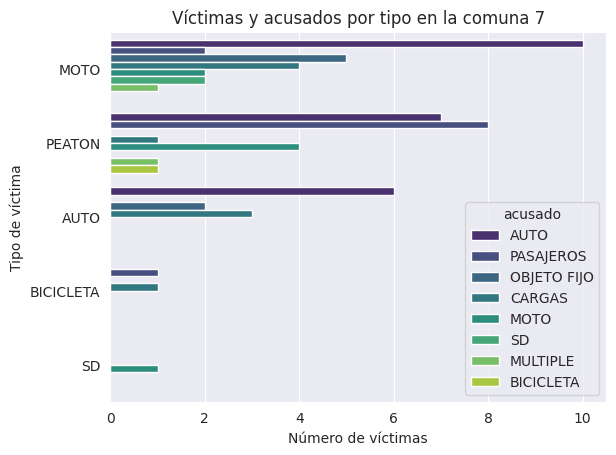

Comuna: 8
Total de victimas en la comuna 8: 67
      victima      acusado  n_victimas
0        AUTO         AUTO           8
1        MOTO       CARGAS           8
2        MOTO  OBJETO FIJO           8
3      PEATON    PASAJEROS           7
4        AUTO  OBJETO FIJO           5
5        MOTO         AUTO           5
6      PEATON         AUTO           5
7        MOTO    PASAJEROS           4
8      PEATON       CARGAS           4
9        MOTO         MOTO           3
10       MOTO           SD           2
11     PEATON         MOTO           1
12       MOTO     MULTIPLE           1
13       MOTO         OTRO           1
14       AUTO       CARGAS           1
15  BICICLETA       CARGAS           1
16       AUTO           SD           1
17       AUTO         OTRO           1
18     PEATON           SD           1


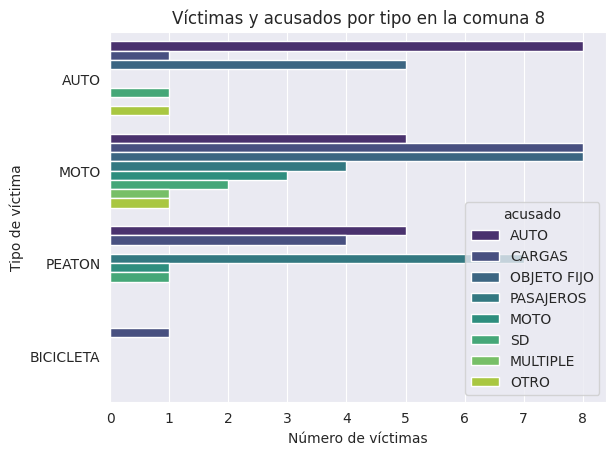

Comuna: 9
Total de victimas en la comuna 9: 75
      victima      acusado  n_victimas
0        MOTO       CARGAS           9
1      PEATON    PASAJEROS           7
2      PEATON       CARGAS           7
3      PEATON         AUTO           7
4        MOTO         AUTO           6
5        AUTO    PASAJEROS           6
6        AUTO         AUTO           5
7      PEATON         MOTO           3
8        AUTO  OBJETO FIJO           3
9        AUTO       CARGAS           3
10       MOTO    PASAJEROS           2
11       AUTO           SD           2
12         SD         AUTO           2
13         SD           SD           2
14       MOTO     MULTIPLE           1
15       MOTO  OBJETO FIJO           1
16  BICICLETA    PASAJEROS           1
17       MOTO           SD           1
18       MOTO         MOTO           1
19  BICICLETA         AUTO           1
20     CARGAS  OBJETO FIJO           1
21       AUTO     MULTIPLE           1
22     PEATON           SD           1
23     CARGAS    

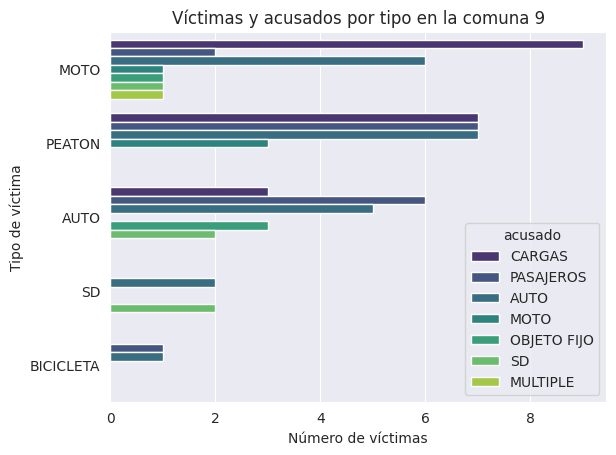

Comuna: 10
Total de victimas en la comuna 10: 30
      victima      acusado  n_victimas
0        MOTO       CARGAS           6
1        MOTO         AUTO           4
2      PEATON         AUTO           4
3        MOTO  OBJETO FIJO           3
4      PEATON    PASAJEROS           3
5        AUTO       CARGAS           2
6        MOTO    PASAJEROS           2
7        AUTO         AUTO           1
8        AUTO    PASAJEROS           1
9   BICICLETA       CARGAS           1
10  BICICLETA         TREN           1
11       MOTO         MOTO           1
12  PASAJEROS    PASAJEROS           1


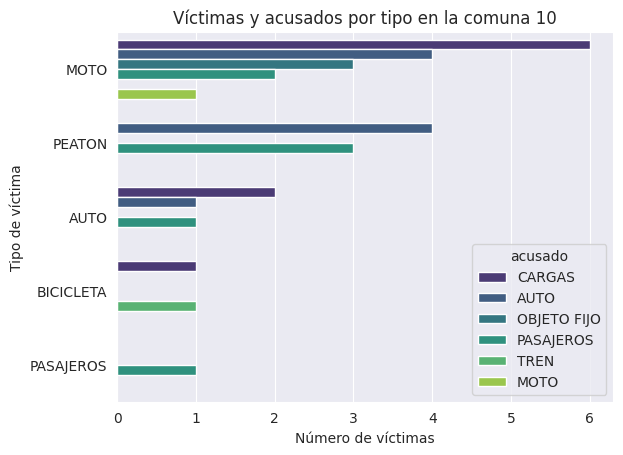

Comuna: 11
Total de victimas en la comuna 11: 33
        victima      acusado  n_victimas
0          MOTO         AUTO           7
1          MOTO       CARGAS           4
2          MOTO         MOTO           4
3        PEATON         AUTO           4
4          MOTO  OBJETO FIJO           3
5        PEATON    PASAJEROS           2
6   PEATON_MOTO         MOTO           2
7          AUTO         AUTO           1
8          AUTO  OBJETO FIJO           1
9          AUTO    PASAJEROS           1
10    BICICLETA         OTRO           1
11       CARGAS       CARGAS           1
12         MOTO    PASAJEROS           1
13       PEATON       CARGAS           1


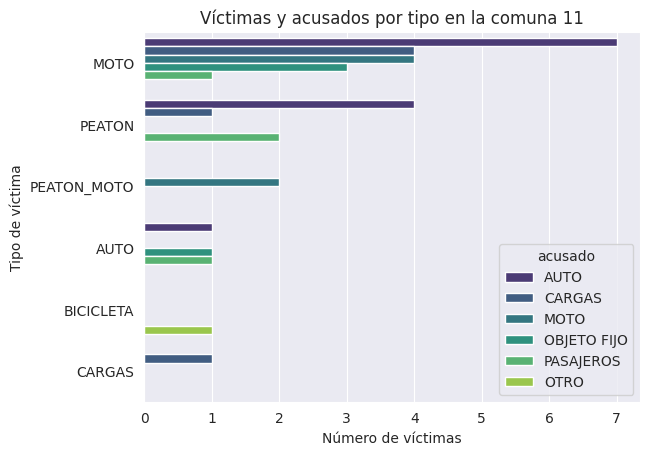

Comuna: 12
Total de victimas en la comuna 12: 39
        victima      acusado  n_victimas
0          MOTO  OBJETO FIJO           6
1          MOTO         AUTO           6
2        PEATON         AUTO           3
3          MOTO    PASAJEROS           3
4          MOTO     MULTIPLE           2
5        PEATON    PASAJEROS           2
6   OBJETO FIJO         AUTO           2
7          AUTO         AUTO           2
8          MOTO         MOTO           2
9          MOTO       CARGAS           2
10         AUTO     MULTIPLE           1
11         MOTO           SD           1
12       CARGAS    PASAJEROS           1
13    BICICLETA         AUTO           1
14       PEATON    BICICLETA           1
15       PEATON       CARGAS           1
16         AUTO  OBJETO FIJO           1
17           SD       CARGAS           1
18           SD           SD           1


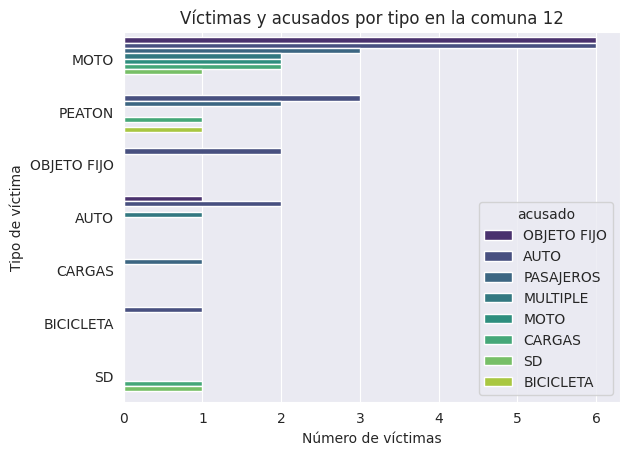

Comuna: 13
Total de victimas en la comuna 13: 40
      victima      acusado  n_victimas
0      PEATON    PASAJEROS           6
1        MOTO         AUTO           6
2      PEATON         AUTO           5
3        MOTO       CARGAS           4
4      PEATON         MOTO           3
5        MOTO           SD           2
6      PEATON       CARGAS           2
7      PEATON     MULTIPLE           1
8   PASAJEROS           SD           1
9   PASAJEROS    PASAJEROS           1
10       AUTO         AUTO           1
11       MOTO    PASAJEROS           1
12       AUTO       CARGAS           1
13       MOTO     MULTIPLE           1
14       MOTO         MOTO           1
15  BICICLETA       CARGAS           1
16       AUTO  OBJETO FIJO           1
17       AUTO     MULTIPLE           1
18       MOTO  OBJETO FIJO           1


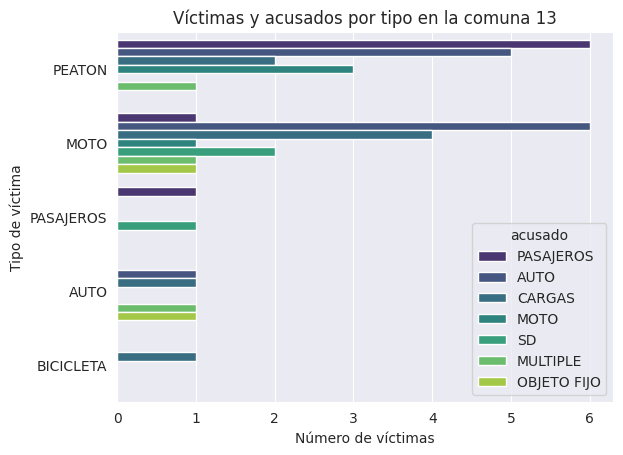

Comuna: 14
Total de victimas en la comuna 14: 37
      victima      acusado  n_victimas
0      PEATON         AUTO           9
1        MOTO       CARGAS           6
2        MOTO         AUTO           4
3        AUTO         AUTO           3
4      PEATON    PASAJEROS           3
5        MOTO  OBJETO FIJO           2
6        MOTO    PASAJEROS           2
7      PEATON         MOTO           2
8   BICICLETA         AUTO           1
9   BICICLETA       CARGAS           1
10       MOTO    BICICLETA           1
11       MOTO         MOTO           1
12     PEATON       CARGAS           1
13     PEATON           SD           1


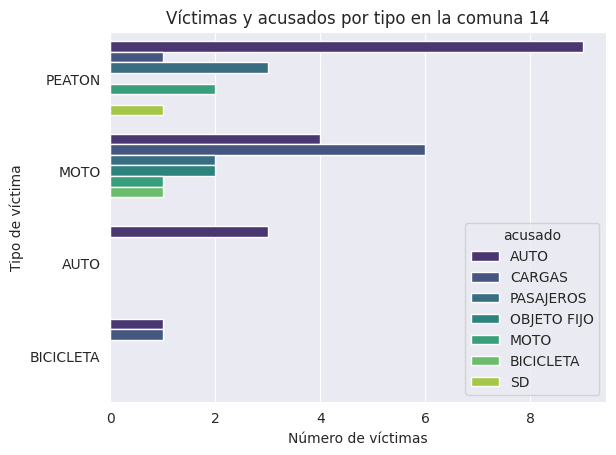

Comuna: 15
Total de victimas en la comuna 15: 45
      victima      acusado  n_victimas
0      PEATON    PASAJEROS          10
1        MOTO         AUTO           7
2        MOTO    PASAJEROS           4
3      PEATON         AUTO           4
4        MOTO       CARGAS           3
5        MOTO         MOTO           3
6        MOTO  OBJETO FIJO           3
7      PEATON         MOTO           3
8        AUTO  OBJETO FIJO           2
9        AUTO       CARGAS           1
10       MOTO         OTRO           1
11  PASAJEROS    PASAJEROS           1
12     PEATON    BICICLETA           1
13     PEATON       CARGAS           1
14     PEATON     MULTIPLE           1


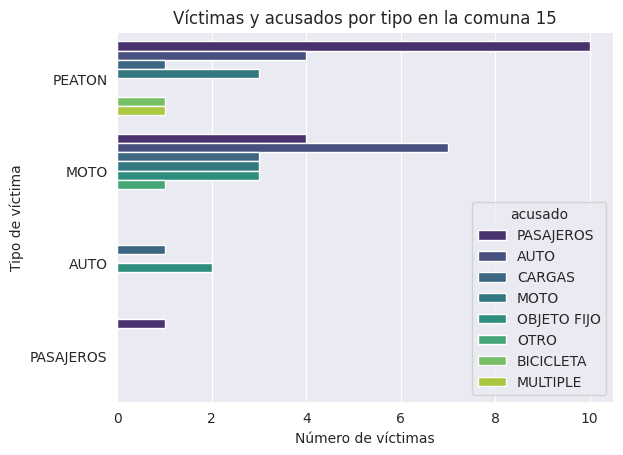

In [122]:
for com in homicidios.comuna.sort_values().unique():
  print(f"Comuna: {com}")
  homicidios_grp = homicidios[homicidios.comuna == com].groupby(["victima", "acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de victimas en la comuna {com}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="acusado", data=homicidios_grp.head(20), palette="viridis").set(title=f"Víctimas y acusados por tipo en la comuna {com}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

<p>El tipo de accidente más común en las comunas 1 y 4, las que tienen más conteo de casos, es el de víctima peatón y acusado pasajero. Probablemente esto refleje la necesidad de trabajar en las señalizaciones en estas zonas, y/o concienciación vial para la población en general.

**Víctimas y acusados por tipo de calle**

Tipo de calle: AUTOPISTA
Total de victimas en las calles de tipo AUTOPISTA: 68
  victima  n_victimas
0    MOTO          42
1    AUTO          11
2  PEATON          11
3  CARGAS           2
4      SD           2


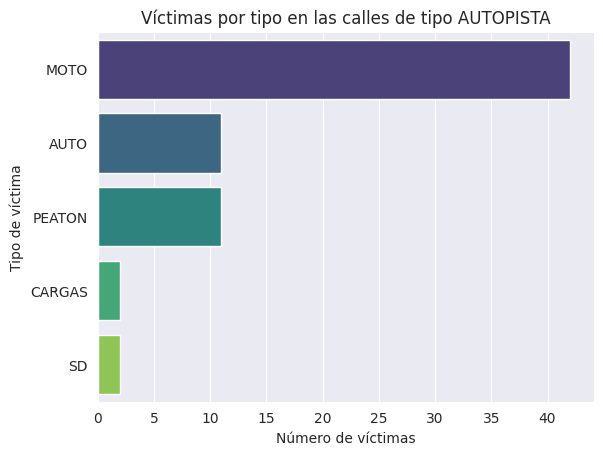

Tipo de calle: AVENIDA
Total de victimas en las calles de tipo AVENIDA: 442
     victima  n_victimas
0     PEATON         186
1       MOTO         174
2       AUTO          53
3  BICICLETA          18
4  PASAJEROS           4
5      MOVIL           3
6     CARGAS           2
7         SD           2


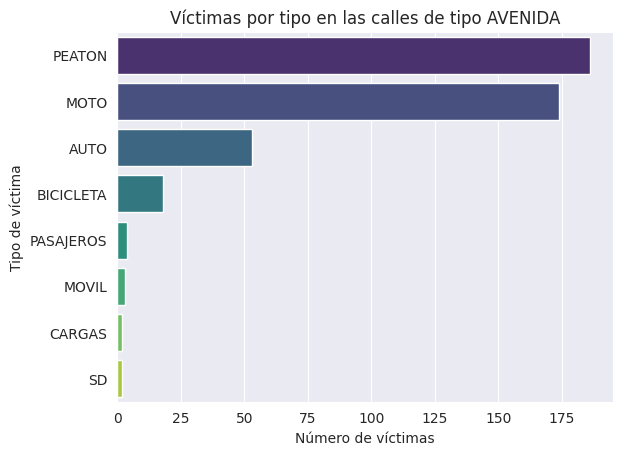

Tipo de calle: CALLE
Total de victimas en las calles de tipo CALLE: 138
       victima  n_victimas
0       PEATON          58
1         MOTO          50
2         AUTO          11
3    BICICLETA          11
4           SD           4
5  PEATON_MOTO           2
6       CARGAS           1
7    PASAJEROS           1


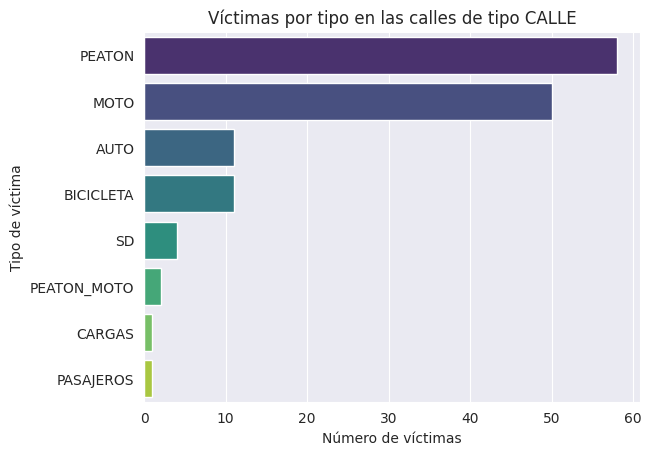

Tipo de calle: GRAL PAZ
Total de victimas en las calles de tipo GRAL PAZ: 69
       victima  n_victimas
0         MOTO          36
1         AUTO          17
2       PEATON          11
3       CARGAS           2
4  OBJETO FIJO           2
5           SD           1


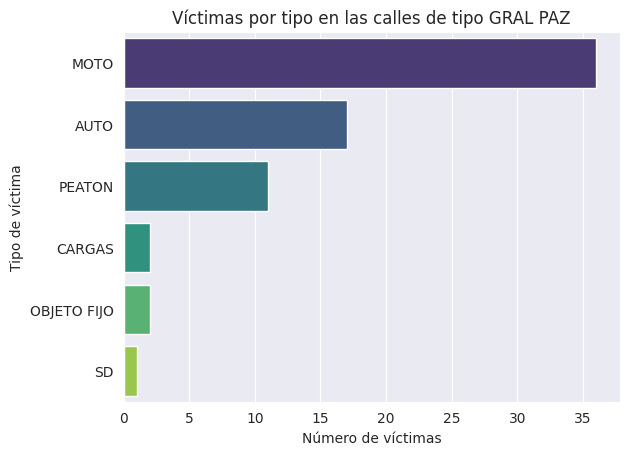

In [123]:
for tipo in homicidios.tipo_calle.sort_values().unique():
  print(f"Tipo de calle: {tipo}")
  homicidios_grp = homicidios[homicidios.tipo_calle == tipo].groupby(["victima"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de victimas en las calles de tipo {tipo}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="victima", data=homicidios_grp.head(20), palette="viridis").set(title=f"Víctimas por tipo en las calles de tipo {tipo}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

<p>En las autopistas y la avenida General Paz, las víctimas más comunes son las motos. Esto probablemente refleje una necesidad de concienciación vial orientada a este público objetivo.

Tipo de calle: AUTOPISTA
Total de victimas en las calles de tipo AUTOPISTA: 68
       acusado  n_victimas
0       CARGAS          23
1         AUTO          17
2  OBJETO FIJO          13
3         MOTO           5
4    PASAJEROS           4
5           SD           4
6     MULTIPLE           2


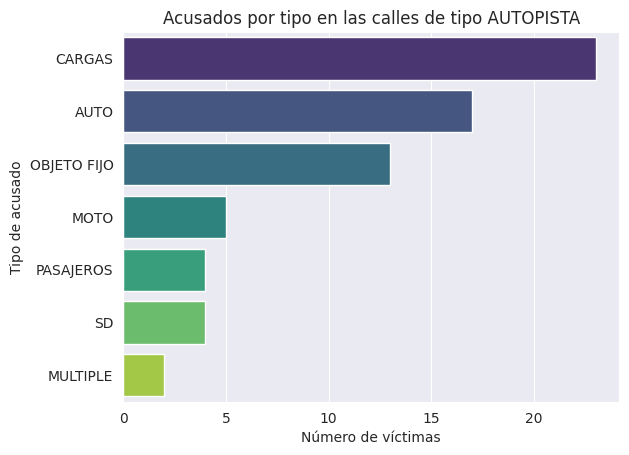

Tipo de calle: AVENIDA
Total de victimas en las calles de tipo AVENIDA: 442
       acusado  n_victimas
0         AUTO         127
1    PASAJEROS         126
2       CARGAS          85
3         MOTO          40
4  OBJETO FIJO          37
5     MULTIPLE          10
6           SD          10
7         OTRO           4
8    BICICLETA           3


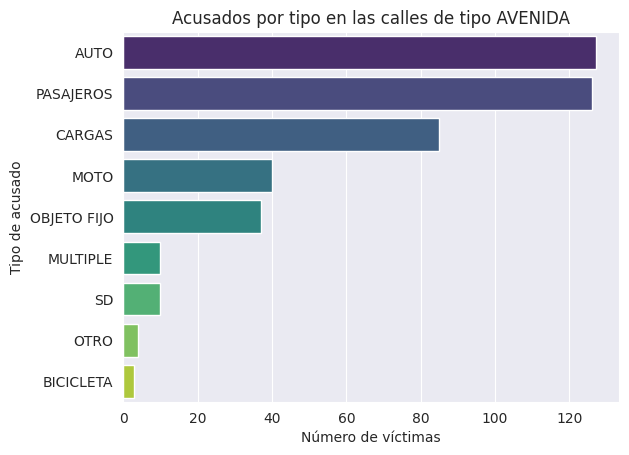

Tipo de calle: CALLE
Total de victimas en las calles de tipo CALLE: 138
       acusado  n_victimas
0         AUTO          43
1    PASAJEROS          38
2       CARGAS          30
3         MOTO           9
4  OBJETO FIJO           7
5    BICICLETA           4
6           SD           3
7     MULTIPLE           2
8         OTRO           1
9         TREN           1


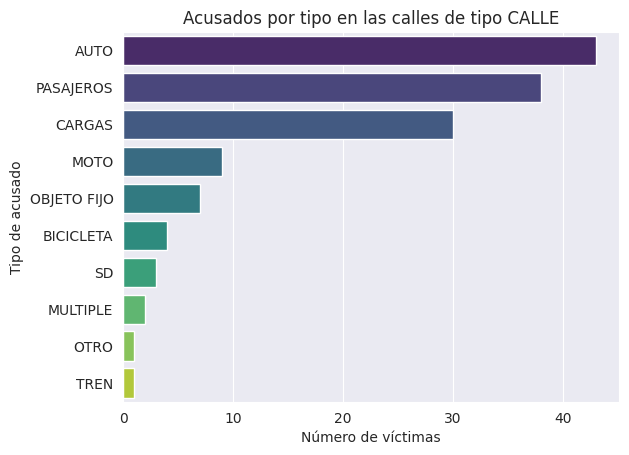

Tipo de calle: GRAL PAZ
Total de victimas en las calles de tipo GRAL PAZ: 69
       acusado  n_victimas
0         AUTO          23
1       CARGAS          12
2  OBJETO FIJO          10
3    PASAJEROS          10
4           SD           6
5         MOTO           4
6     MULTIPLE           3
7         OTRO           1


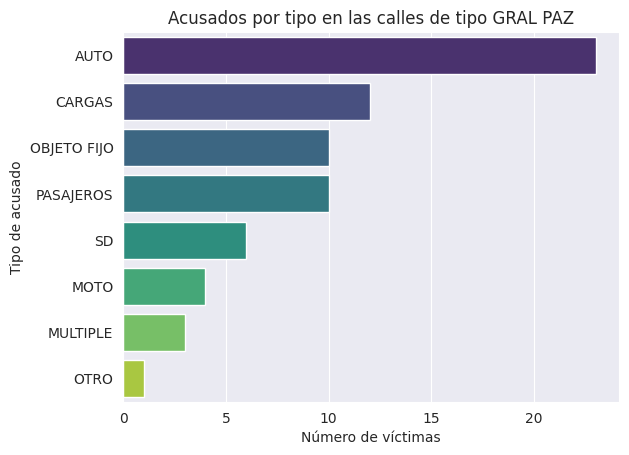

In [124]:
for tipo in homicidios.tipo_calle.sort_values().unique():
  print(f"Tipo de calle: {tipo}")
  homicidios_grp = homicidios[homicidios.tipo_calle == tipo].groupby(["acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de victimas en las calles de tipo {tipo}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="acusado", hue="acusado", data=homicidios_grp.head(20), palette="viridis").set(title=f"Acusados por tipo en las calles de tipo {tipo}", xlabel="Número de víctimas", ylabel="Tipo de acusado")
  plt.show()

Tipo de calle: AUTOPISTA
Total de victimas en las calles de tipo AUTOPISTA: 68
   victima      acusado  n_victimas
0     MOTO       CARGAS          19
1   PEATON         AUTO           8
2     MOTO  OBJETO FIJO           7
3     AUTO         AUTO           5
4     AUTO  OBJETO FIJO           5
5     MOTO         AUTO           4
6     MOTO         MOTO           4
7     MOTO    PASAJEROS           4
8     MOTO     MULTIPLE           2
9     MOTO           SD           2
10  PEATON       CARGAS           2
11      SD           SD           2
12    AUTO       CARGAS           1
13  CARGAS       CARGAS           1
14  CARGAS  OBJETO FIJO           1
15  PEATON         MOTO           1


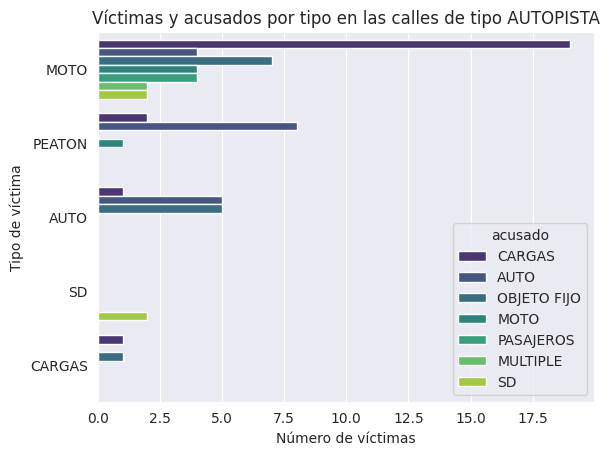

Tipo de calle: AVENIDA
Total de victimas en las calles de tipo AVENIDA: 442
      victima      acusado  n_victimas
0      PEATON    PASAJEROS          87
1        MOTO         AUTO          57
2      PEATON         AUTO          44
3        MOTO       CARGAS          40
4        MOTO    PASAJEROS          29
5      PEATON       CARGAS          25
6      PEATON         MOTO          23
7        MOTO  OBJETO FIJO          21
8        AUTO         AUTO          19
9        AUTO  OBJETO FIJO          16
10       MOTO         MOTO          16
11       AUTO       CARGAS           9
12  BICICLETA       CARGAS           7
13  BICICLETA         AUTO           6
14       AUTO    PASAJEROS           4
15       MOTO     MULTIPLE           4
16     PEATON           SD           3
17  BICICLETA    PASAJEROS           3
18     PEATON     MULTIPLE           3
19       MOTO           SD           3
20  PASAJEROS    PASAJEROS           2
21       AUTO     MULTIPLE           2
22      MOVIL       CARGAS 

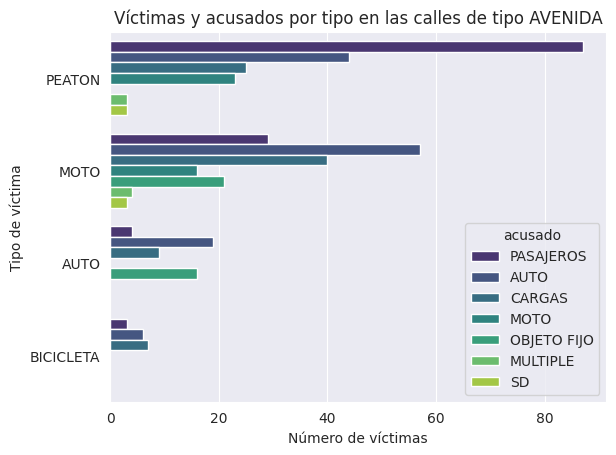

Tipo de calle: CALLE
Total de victimas en las calles de tipo CALLE: 138
        victima      acusado  n_victimas
0        PEATON         AUTO          23
1        PEATON    PASAJEROS          16
2          MOTO       CARGAS          15
3          MOTO    PASAJEROS          14
4          MOTO         AUTO          12
5        PEATON       CARGAS           7
6          MOTO  OBJETO FIJO           5
7        PEATON         MOTO           5
8     BICICLETA    PASAJEROS           5
9        PEATON    BICICLETA           4
10         AUTO       CARGAS           4
11         AUTO         AUTO           3
12    BICICLETA       CARGAS           3
13         MOTO         MOTO           2
14    BICICLETA         AUTO           2
15         AUTO    PASAJEROS           2
16       PEATON     MULTIPLE           2
17         AUTO  OBJETO FIJO           2
18  PEATON_MOTO         MOTO           2
19           SD         AUTO           2
20         MOTO         OTRO           1
21       CARGAS         AU

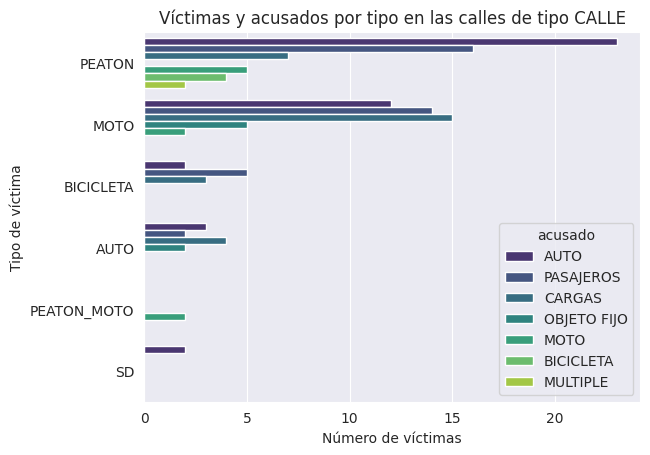

Tipo de calle: GRAL PAZ
Total de victimas en las calles de tipo GRAL PAZ: 69
        victima      acusado  n_victimas
0          MOTO         AUTO          11
1          MOTO  OBJETO FIJO           7
2          AUTO         AUTO           6
3          MOTO       CARGAS           6
4          AUTO    PASAJEROS           4
5        PEATON       CARGAS           4
6        PEATON         AUTO           4
7          MOTO    PASAJEROS           3
8          AUTO  OBJETO FIJO           3
9          MOTO         MOTO           3
10         MOTO           SD           3
11       PEATON    PASAJEROS           2
12  OBJETO FIJO         AUTO           2
13         MOTO     MULTIPLE           2
14         AUTO           SD           2
15         MOTO         OTRO           1
16         AUTO       CARGAS           1
17       CARGAS    PASAJEROS           1
18       CARGAS       CARGAS           1
19       PEATON         MOTO           1
20         AUTO     MULTIPLE           1
21           SD      

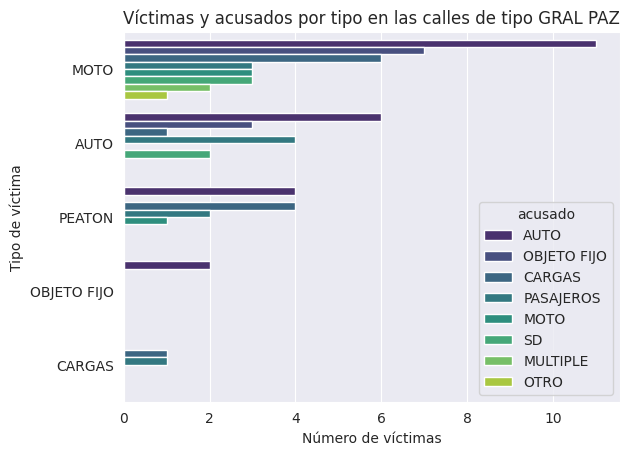

In [125]:
for tipo in homicidios.tipo_calle.sort_values().unique():
  print(f"Tipo de calle: {tipo}")
  homicidios_grp = homicidios[homicidios.tipo_calle == tipo].groupby(["victima", "acusado"])["n_victimas"].sum().to_frame().sort_values(by="n_victimas", ascending=False).reset_index()
  if homicidios_grp.empty: continue
  print(f"Total de victimas en las calles de tipo {tipo}: {homicidios_grp.n_victimas.sum()}")
  print(homicidios_grp)
  sns.barplot(x="n_victimas", y="victima", hue="acusado", data=homicidios_grp.head(20), palette="viridis").set(title=f"Víctimas y acusados por tipo en las calles de tipo {tipo}", xlabel="Número de víctimas", ylabel="Tipo de víctima")
  plt.show()

# Víctimas

<p>Datos de víctimas de homicidio por accidente vial, proporcionados para el ejercicio.

In [3]:
victimas = pd.read_excel('homicidios.xlsx', sheet_name="VICTIMAS")
victimas.head()

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO
0,2016-0001,2016-01-01,2016,1,1,CONDUCTOR,MOTO,MASCULINO,19,2016-01-01 00:00:00
1,2016-0002,2016-01-02,2016,1,2,CONDUCTOR,AUTO,MASCULINO,70,2016-01-02 00:00:00
2,2016-0003,2016-01-03,2016,1,3,CONDUCTOR,MOTO,MASCULINO,30,2016-01-03 00:00:00
3,2016-0004,2016-01-10,2016,1,10,CONDUCTOR,MOTO,MASCULINO,18,SD
4,2016-0005,2016-01-21,2016,1,21,CONDUCTOR,MOTO,MASCULINO,29,2016-02-01 00:00:00


<p>Se empezará renombrando y seleccionando las columnas con información relevante que no sea repetitiva.

In [4]:
victimas.rename(columns={
    "ID_hecho":"hecho_id",
    "FECHA": "fecha_hecho",
    "VICTIMA": "victima",
    "ROL": "rol",
    "EDAD": "edad",
    "SEXO": "sexo",
    "FECHA_FALLECIMIENTO": "fecha_fallecimiento"
}, inplace=True)
victimas = victimas [["hecho_id", "fecha_hecho", "victima", "rol", "edad", "sexo", "fecha_fallecimiento"]]
victimas.head()

,hecho_id,fecha_hecho,victima,rol,edad,sexo,fecha_fallecimiento
0,2016-0001,2016-01-01,MOTO,CONDUCTOR,19,MASCULINO,2016-01-01 00:00:00
1,2016-0002,2016-01-02,AUTO,CONDUCTOR,70,MASCULINO,2016-01-02 00:00:00
2,2016-0003,2016-01-03,MOTO,CONDUCTOR,30,MASCULINO,2016-01-03 00:00:00
3,2016-0004,2016-01-10,MOTO,CONDUCTOR,18,MASCULINO,SD
4,2016-0005,2016-01-21,MOTO,CONDUCTOR,29,MASCULINO,2016-02-01 00:00:00


In [5]:
victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   hecho_id             717 non-null    object        
 1   fecha_hecho          717 non-null    datetime64[ns]
 2   victima              717 non-null    object        
 3   rol                  717 non-null    object        
 4   edad                 717 non-null    object        
 5   sexo                 717 non-null    object        
 6   fecha_fallecimiento  717 non-null    object        
dtypes: datetime64[ns](1), object(6)
memory usage: 39.3+ KB


<p>Como se ve en la salida de la celda anterior, los datos no parecen tener nulos, así que antes de revisar los valores de las columnas se comprobarán los duplicados.

## Revisión de duplicados

In [6]:
victimas.duplicated().sum()

0

<p>No se encontraron duplicados en el dataframe. A continuación, se revisarán los campos con duplicados en la columna hecho_id.

In [7]:
id_duplicados = victimas[victimas.hecho_id.duplicated()].hecho_id.unique()
victimas_duplicados = victimas[victimas.hecho_id.isin(id_duplicados)]
victimas_duplicados

,hecho_id,fecha_hecho,victima,rol,edad,sexo,fecha_fallecimiento
29,2016-0041,2016-03-29,MOTO,CONDUCTOR,54,MASCULINO,2016-03-29 00:00:00
30,2016-0041,2016-03-29,MOTO,PASAJERO_ACOMPAÑANTE,SD,MASCULINO,2016-03-30 00:00:00
98,2016-0126,2016-09-18,AUTO,CONDUCTOR,37,MASCULINO,SD
99,2016-0126,2016-09-18,AUTO,PASAJERO_ACOMPAÑANTE,60,MASCULINO,SD
163,2017-0026,2017-02-26,AUTO,PASAJERO_ACOMPAÑANTE,23,FEMENINO,2017-02-26 00:00:00
164,2017-0026,2017-02-26,AUTO,CONDUCTOR,19,MASCULINO,2017-02-26 00:00:00
173,2017-0035,2017-03-23,AUTO,CONDUCTOR,28,MASCULINO,2017-03-23 00:00:00
174,2017-0035,2017-03-23,AUTO,PASAJERO_ACOMPAÑANTE,32,MASCULINO,2017-03-23 00:00:00
175,2017-0035,2017-03-23,AUTO,PASAJERO_ACOMPAÑANTE,30,MASCULINO,2017-03-23 00:00:00
176,2017-0036,2017-03-29,MOTO,PASAJERO_ACOMPAÑANTE,SD,FEMENINO,2017-03-29 00:00:00


<p>En este caso, los duplicados en la columna hecho_id representan las víctimas de los hechos con más de una víctima. Esta información se analizará más adelante.

## Revisión de nulos

In [ ]:
victimas.isnull().sum()

hecho_id               0
fecha_hecho            0
victima                0
rol                    0
edad                   0
sexo                   0
fecha_fallecimiento    0
dtype: int64

<p>Aunque las filas no contienen valores nulos, hay algunas que incluyen el valor SD - Sin Dato. A continuación se explorará y analizará esta información.

In [ ]:
def compare_val(x):
  return x == "SD"

for c in victimas.columns:
  print(f"Sin dato en columna {c}: {victimas[c].apply(compare_val).sum()}")

Sin dato en columna hecho_id: 0
Sin dato en columna fecha_hecho: 0
Sin dato en columna victima: 9
Sin dato en columna rol: 11
Sin dato en columna edad: 53
Sin dato en columna sexo: 6
Sin dato en columna fecha_fallecimiento: 68


<p>Aunque no aparezcan como nulos, existen muchas celdas etiquetadas como Sin Dato. En el presente contexto, esto puede significar varias cosas: desde negligencia humana, hasta protección de identidad o incapacidad de reconocer a la víctima. Por tanto (y para un correcto análisis del conjunto de datos), se tratarán estos valores como nulos.

##Conversión a tipos adecuados y creación de columnas

<p>Para la columna fecha_fallecimiento, se hará una conversión a datetime, utilizando el parámetro errors="coerce" para imputar como nulos los valores SD.

In [10]:
victimas.fecha_fallecimiento = pd.to_datetime(victimas.fecha_fallecimiento, format='%d/%m/%Y', errors="coerce")
victimas.fecha_fallecimiento.head()

0   2016-01-01
1   2016-01-02
2   2016-01-03
3          NaT
4   2016-02-01
Name: fecha_fallecimiento, dtype: datetime64[ns]

<p>Dado que el tipo de dato int no admite el valor NaN, se utilizará el tipo float.

In [8]:
victimas.edad = victimas.edad.apply(lambda x: np.nan if type(x) != int else x).astype(float)
victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   hecho_id             717 non-null    object        
 1   fecha_hecho          717 non-null    datetime64[ns]
 2   victima              717 non-null    object        
 3   rol                  717 non-null    object        
 4   edad                 664 non-null    float64       
 5   sexo                 717 non-null    object        
 6   fecha_fallecimiento  717 non-null    object        
dtypes: datetime64[ns](1), float64(1), object(5)
memory usage: 39.3+ KB


##Carga de datos

In [72]:
victimas.to_csv("victimas.csv", index=False)

##Análisis uni y multivariable

###Diferencia entre la fecha del hecho y la fecha de fallecimiento de la víctima

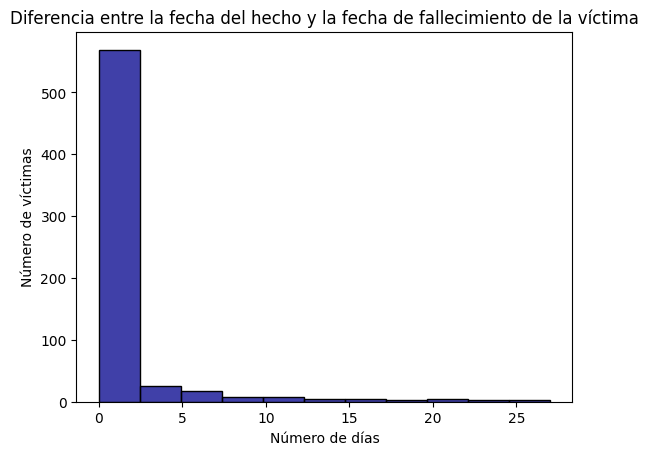

In [11]:
dif_hecho_fallecimiento = victimas.fecha_fallecimiento - victimas.fecha_hecho
dif_hecho_fallecimiento = dif_hecho_fallecimiento.dt.days
fig = sns.histplot(dif_hecho_fallecimiento, color="darkblue").set(title="Diferencia entre la fecha del hecho y la fecha de fallecimiento de la víctima", xlabel="Número de días", ylabel="Número de víctimas")

In [14]:
dif_hecho_fallecimiento[dif_hecho_fallecimiento<=2].count()

569

<p>Se tiene que, de entre los datos con los que se puede trabajar (pues la fecha de fallecimiento no es NaT), la gran mayoría (569) registra dos días o menos de diferencia. A continuación, se analizarán los registros con diferencia de dos o más días.

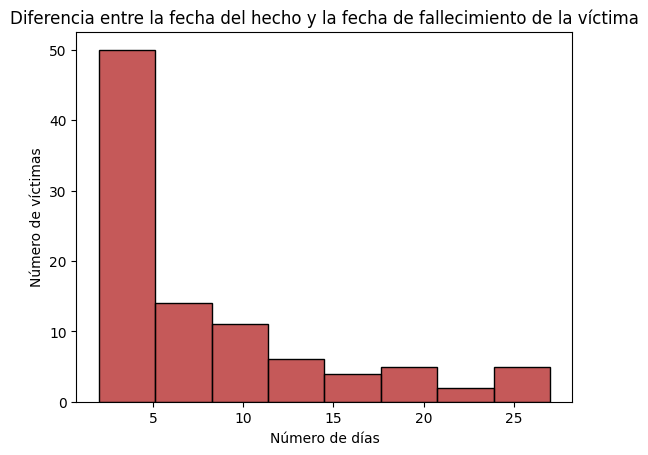

In [23]:
fig = sns.histplot(dif_hecho_fallecimiento[dif_hecho_fallecimiento>1],color="firebrick").set(title="Diferencia entre la fecha del hecho y la fecha de fallecimiento de la víctima", xlabel="Número de días", ylabel="Número de víctimas")

<p>Como puede verse en la gráfica, son mucho menos frecuentes los casos con más de 5 días de diferencia.

###Distribución de los datos según sus características

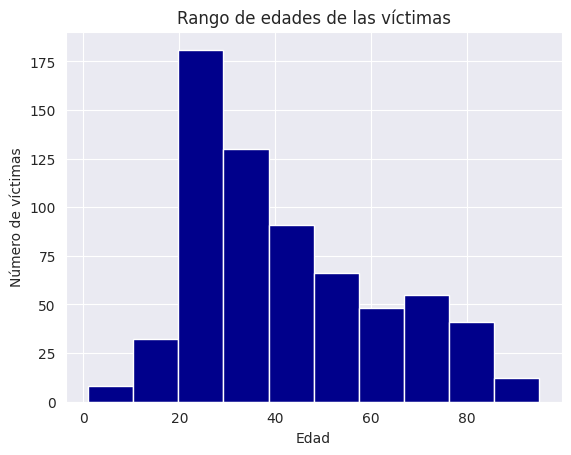

In [28]:
fig = victimas.edad.plot.hist(color="darkblue").set(title="Rango de edades de las víctimas", xlabel="Edad", ylabel="Número de víctimas")

In [20]:
victimas.edad.describe()

count    664.000000
mean      42.167169
std       19.788034
min        1.000000
25%       27.000000
50%       37.000000
75%       56.250000
max       95.000000
Name: edad, dtype: float64

<p>Como muestra el anterior histograma, la mayoría de las víctimas se encuentra entre los 20 y 40 años, y el rango varía entre los 0 y cerca de 95 años.

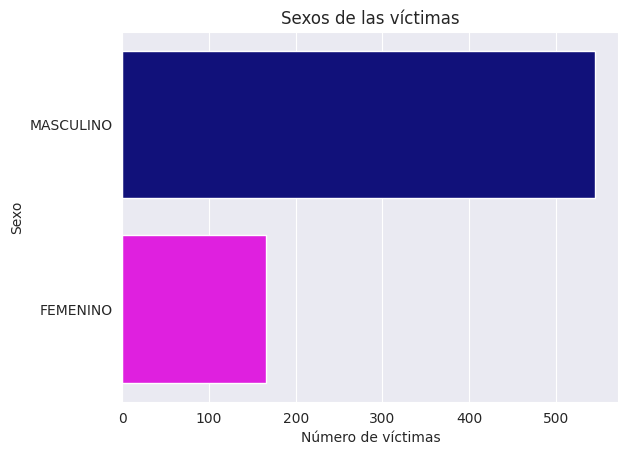

In [30]:
vicimas_sexo = victimas.sexo.value_counts().drop("SD").reset_index()
vicimas_sexo.columns = ["sexo", "counts"]
fig = sns.barplot(y="sexo", x="counts", hue="sexo", data=vicimas_sexo, palette=["darkblue","magenta"]).set(title="Sexos de las víctimas", xlabel="Número de víctimas", ylabel="Sexo")

<p>La mayoría de víctimas, más de 500, son hombres, mostrando una clara tendencia en cuanto a siniestros viales.

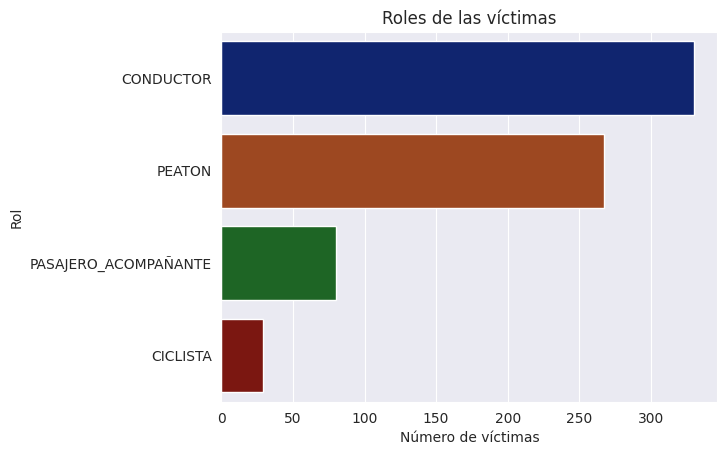

In [31]:
victimas_rol = victimas.rol.value_counts().drop("SD").reset_index()
victimas_rol.columns = ["rol", "counts"]
fig = sns.barplot(y="rol", x="counts", hue="rol", data=victimas_rol, palette="dark").set(title="Roles de las víctimas", xlabel="Número de víctimas", ylabel="Rol")

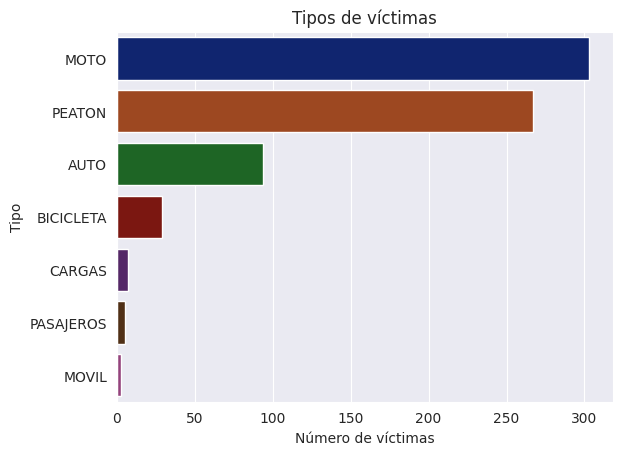

In [32]:
victimas_tipo = victimas.victima.value_counts().drop("SD").reset_index()
victimas_tipo.columns = ["tipo", "counts"]
fig = sns.barplot(y="tipo", x="counts", hue="tipo", data=victimas_tipo, palette="dark").set(title="Tipos de víctimas", xlabel="Número de víctimas", ylabel="Tipo")

<p>En complemento a la información explorada con los datos de los hechos, las categorías más frecuentes de víctimas son conductores (a saber, de motos, autos o bicicletas) y peatones.

##Análisis multivariable

In [21]:
victimas["dias_fallecimiento"] = dif_hecho_fallecimiento
victimas.head()

,hecho_id,fecha_hecho,victima,rol,edad,sexo,fecha_fallecimiento,dias_fallecimiento
0,2016-0001,2016-01-01,MOTO,CONDUCTOR,19.0,MASCULINO,2016-01-01,0.0
1,2016-0002,2016-01-02,AUTO,CONDUCTOR,70.0,MASCULINO,2016-01-02,0.0
2,2016-0003,2016-01-03,MOTO,CONDUCTOR,30.0,MASCULINO,2016-01-03,0.0
3,2016-0004,2016-01-10,MOTO,CONDUCTOR,18.0,MASCULINO,NaT,NaN
4,2016-0005,2016-01-21,MOTO,CONDUCTOR,29.0,MASCULINO,2016-02-01,11.0


###Exploración de las víctimas por tipo

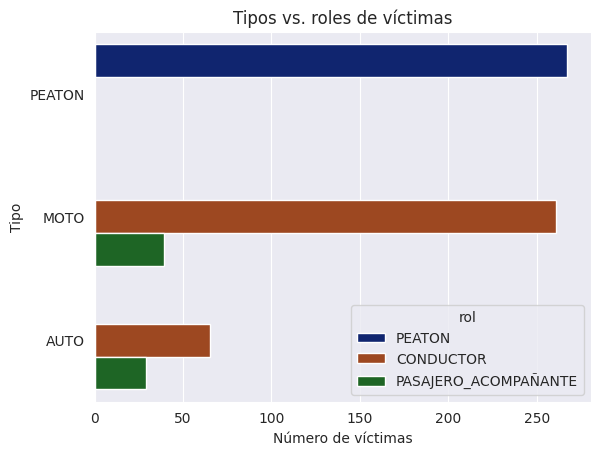

In [33]:
victimas_tipo = victimas.groupby(["victima","rol"]).aggregate({"hecho_id": "count"}).reset_index().sort_values("hecho_id", ascending=False)
victimas_tipo.columns = ["victima", "rol", "n_victimas"]
fig = sns.barplot(y="victima", x="n_victimas", hue="rol", data=victimas_tipo.head(5), palette="dark").set(title="Tipos vs. roles de víctimas", xlabel="Número de víctimas", ylabel="Tipo")

<p>Como puede verse, tanto en casos en los que la víctima iba en auto como en moto, predominan los casos en que fue el conductor.

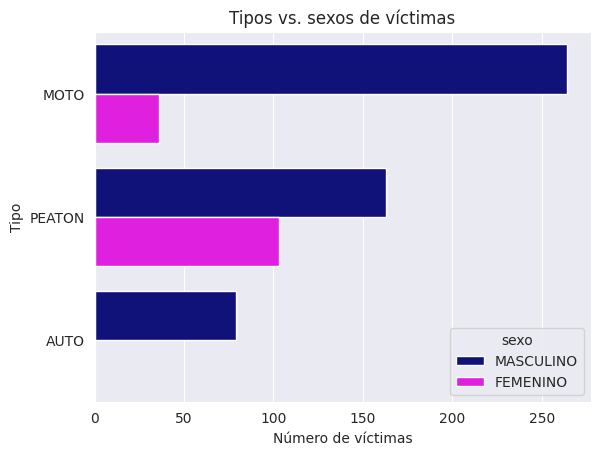

In [35]:
victimas_tipo = victimas.groupby(["victima","sexo"]).aggregate({"hecho_id": "count"}).reset_index().sort_values("hecho_id", ascending=False)
victimas_tipo.columns = ["victima", "sexo", "n_victimas"]
fig = sns.barplot(y="victima", x="n_victimas", hue="sexo", data=victimas_tipo.head(5), palette=["darkblue","magenta"]).set(title="Tipos vs. sexos de víctimas", xlabel="Número de víctimas", ylabel="Tipo")

<p>La diferencia entre víctimas hombres vs mujeres es mucho menos notable en los casos en que son peatones, probablemente reflejando un patrón de uso de vehículos en que los hombres comúnmente usan más.

###Exploración de las edades de las víctimas

<Axes: xlabel='edad', ylabel='dias_fallecimiento'>

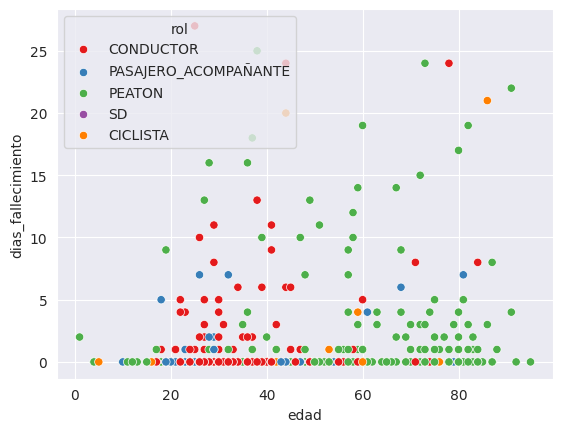

In [ ]:
sns.scatterplot(x="edad", y="dias_fallecimiento", hue="rol", data=victimas)

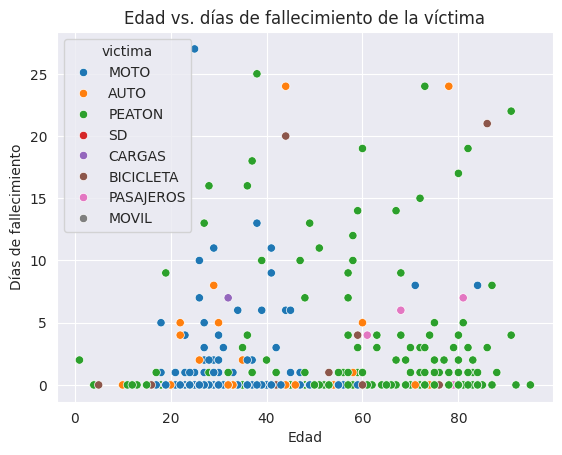

In [36]:
fig = sns.scatterplot(x="edad", y="dias_fallecimiento", hue="victima", data=victimas).set(title="Edad vs. días de fallecimiento de la víctima", xlabel="Edad", ylabel="Días de fallecimiento")

<p>El anterior diagrama muestra que es más común que los mototaxistas tengan entre cerca de 20 y 45 años, respaldando algunos hallazgos anteriores, en que las víctimas más comunes eran los mototaxistas, así como las personas de este rango de edad. Por otra parte, puede verse que en cualquier caso lo más común es que la víctima fallezca hasta 5 días después del hecho.

<Axes: xlabel='edad', ylabel='dias_fallecimiento'>

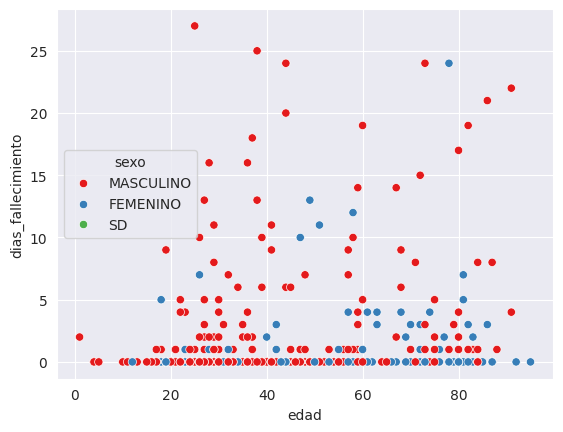

In [ ]:
sns.scatterplot(x="edad", y="dias_fallecimiento", hue="sexo", data=victimas)

<p>En este caso, puede rescatarse que es más común que las mujeres víctimas de estos hechos tengan 40 o más años.

#Hechos vs. Víctimas

##Análisis de correlación

<p>Para el análisis de correlación, se plantea utilizar ambos dataframe, codificándolos de forma similar al label encoding.

In [59]:
informacion_hechos = pd.merge(victimas, homicidios, on="hecho_id")
informacion_hechos.head()

,hecho_id,fecha_hecho,victima_x,rol,edad,sexo,fecha_fallecimiento,dias_fallecimiento,n_victimas,fecha,...,calle,altura,cruce,direccion,comuna,lat,lon,participantes,victima_y,acusado
0,2016-0001,2016-01-01,MOTO,CONDUCTOR,19.0,MASCULINO,2016-01-01,0.0,1,2016-01-01 04:00:00-01:00,...,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,-34.687570,-58.475340,MOTO-AUTO,MOTO,AUTO
1,2016-0002,2016-01-02,AUTO,CONDUCTOR,70.0,MASCULINO,2016-01-02,0.0,1,2016-01-02 01:15:00-01:00,...,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,-34.669777,-58.508775,AUTO-PASAJEROS,AUTO,PASAJEROS
2,2016-0003,2016-01-03,MOTO,CONDUCTOR,30.0,MASCULINO,2016-01-03,0.0,1,2016-01-03 07:00:00-01:00,...,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,1,-34.631894,-58.390403,MOTO-AUTO,MOTO,AUTO
3,2016-0004,2016-01-10,MOTO,CONDUCTOR,18.0,MASCULINO,NaT,NaN,1,2016-01-10 00:00:00-01:00,...,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,-34.680930,-58.465039,MOTO-SD,MOTO,SD
4,2016-0005,2016-01-21,MOTO,CONDUCTOR,29.0,MASCULINO,2016-02-01,11.0,1,2016-01-21 05:20:00-01:00,...,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,-34.622466,-58.387183,MOTO-PASAJEROS,MOTO,PASAJEROS


In [60]:
informacion_hechos.drop(["hecho_id","fecha_hecho","victima_y", "participantes","direccion"], axis=1, inplace=True)
informacion_hechos.rename(columns={"victima_x": "victima"}, inplace=True)
informacion_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   victima              717 non-null    object        
 1   rol                  717 non-null    object        
 2   edad                 664 non-null    float64       
 3   sexo                 717 non-null    object        
 4   fecha_fallecimiento  649 non-null    datetime64[ns]
 5   dias_fallecimiento   649 non-null    float64       
 6   n_victimas           717 non-null    int64         
 7   fecha                717 non-null    object        
 8   tipo_calle           717 non-null    object        
 9   calle                716 non-null    object        
 10  altura               133 non-null    float64       
 11  cruce                540 non-null    object        
 12  comuna               717 non-null    int64         
 13  lat                  717 non-null  

<p>A continuación se codificarán las columnas usando la función map.

In [61]:
def map_valores(valor, dict):
  return dict[valor]

dict_victimas = {
    "SD":0,
    "PEATON":1,
    "BICICLETA":2,
    "PASAJEROS":3,
    "MOTO":4,
    "AUTO":5,
    "MOVIL":6,
    "CARGAS":7
}
informacion_hechos.victima = informacion_hechos.victima.apply(lambda x: map_valores(x, dict_victimas))


dict_roles = {
    "SD":0,
    "PEATON":1,
    "CICLISTA":2,
    "PASAJERO_ACOMPAÑANTE":3,
    "CONDUCTOR":4
}
informacion_hechos.rol = informacion_hechos.rol.apply(lambda x: map_valores(x, dict_roles))

dict_sexos = {
    "SD":0,
    "MASCULINO":1,
    "FEMENINO":2
}
informacion_hechos.sexo = informacion_hechos.sexo.apply(lambda x: map_valores(x, dict_sexos))

dict_acusados = {
    np.nan:0,
    "OTRO":0,
    "OBJETO FIJO":1,
    "BICICLETA":2,
    "PASAJEROS":3,
    "MOTO":4,
    "AUTO":5,
    "CARGAS":6,
    "TREN":7,
    "MULTIPLE":8,
    "SD":0
}
informacion_hechos.acusado = informacion_hechos.acusado.apply(lambda x: map_valores(x, dict_acusados))

dict_tipo_calle = {
    "CALLE":1,
    "AVENIDA":2,
    "AUTOPISTA":3,
    "GRAL PAZ":4,
    "SD":0
}
informacion_hechos.tipo_calle = informacion_hechos.tipo_calle.apply(lambda x: map_valores(x, dict_tipo_calle))
informacion_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   victima              717 non-null    int64         
 1   rol                  717 non-null    int64         
 2   edad                 664 non-null    float64       
 3   sexo                 717 non-null    int64         
 4   fecha_fallecimiento  649 non-null    datetime64[ns]
 5   dias_fallecimiento   649 non-null    float64       
 6   n_victimas           717 non-null    int64         
 7   fecha                717 non-null    object        
 8   tipo_calle           717 non-null    int64         
 9   calle                716 non-null    object        
 10  altura               133 non-null    float64       
 11  cruce                540 non-null    object        
 12  comuna               717 non-null    int64         
 13  lat                  717 non-null  

In [ ]:
informacion_hechos.head()

,victima,rol,edad,sexo,fecha_fallecimiento,dias_fallecimiento,n_victimas,tipo_calle,calle,altura,cruce,comuna,lat,lon,acusado,timestamp
0,4,4,19.0,1,2016-01-01,0.0,1,2,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.",8,-34.687570,-58.475340,5,2016-01-01 04:00:00
1,5,4,70.0,1,2016-01-02,0.0,1,4,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,9,-34.669777,-58.508775,3,2016-01-02 01:15:00
2,4,4,30.0,1,2016-01-03,0.0,1,2,ENTRE RIOS AV.,2034.0,NaN,1,-34.631894,-58.390403,5,2016-01-03 07:00:00
3,4,4,18.0,1,NaT,NaN,1,2,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.",8,-34.680930,-58.465039,0,2016-01-10 00:00:00
4,4,4,29.0,1,2016-02-01,11.0,1,2,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.",1,-34.622466,-58.387183,3,2016-01-21 05:20:00


<p>A continuación, se muestra la matriz de correlaciones Pearson.

<Axes: >

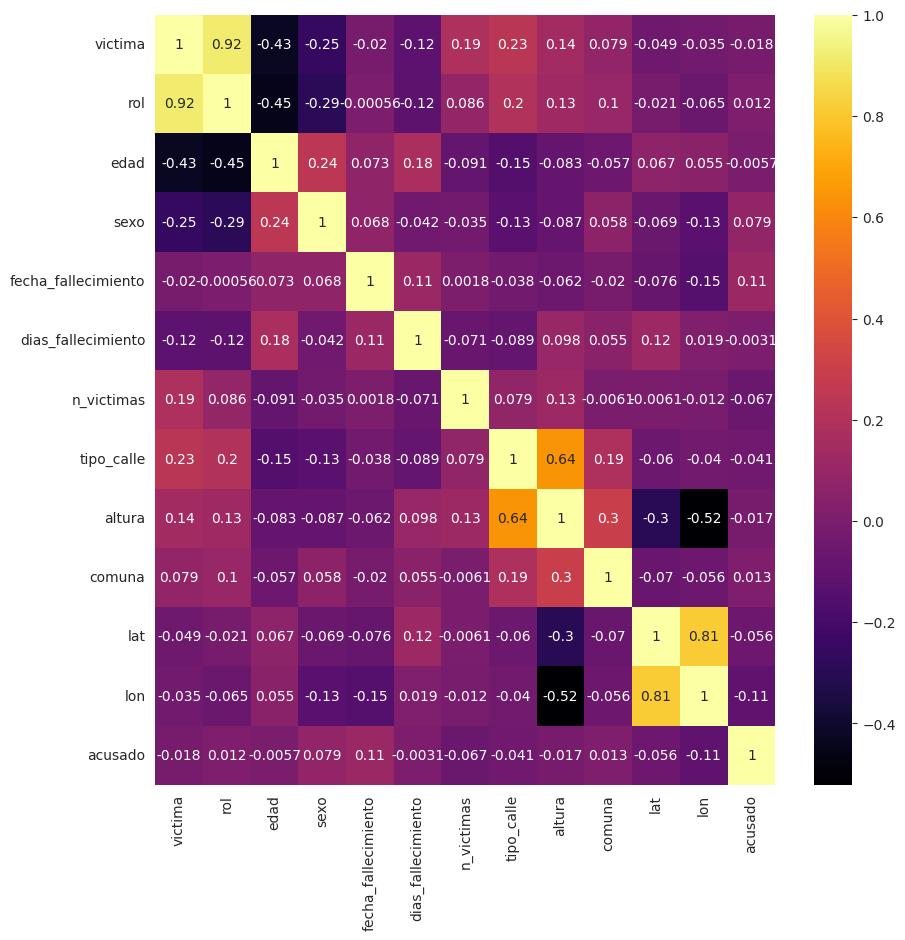

In [62]:
corr = informacion_hechos.select_dtypes(include=["number","datetime"]).corr()
plt.figure(figsize=(10,10))
sns.heatmap(corr, annot=True, cmap="inferno")

<p>No hay relaciones notables para destacar en la matriz de correlación, excepto tal vez la relación de la columna edad con las columnas víctima y rol (que, en esencia, representan valores muy relacionados), dado que algunos grupos etarios están condicionados a pertenecer a algunas categorías, como niños y ancianos que solo podrían ser peatones o pasajeros.

# Observaciones de factores de riesgo vial


<p>A continuación se presentan los resultados de los estudios observacionales de factores de riesgo vial llevados por el Observatorio de Movilidad y Seguridad Vial para el año 2022.

##Estudios para autos

In [64]:
observacionesautos = pd.read_excel("base_obs_autos_2022.xlsx")
observacionesautos.head()

,Norden,Fecha_Inicial,Hora_Inicio,Fecha_Fin,Hora_Fin,Dia_Habil,Turno,Punto_observacion,Zona,Tipo_vehiculo,...,SRI_Pasajero_Atras_1,Pasajero_Atras_2,Cinturon_Pasajero_Atras_2,SRI_Pasajero_Atras_2,Pasajero_Atras_3,Cinturon_Pasajero_Atras_3,SRI_Pasajero_Atras_3,Pasajero_Atras_Adic,Cantidad_Ocupantes,Proteccion_Total
0,1,2022-10-29,08:59:10,2022-10-29,10:02:21,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,,NaN,,1,1
1,2,2022-10-29,15:28:55,2022-10-29,15:33:27,2,2,AV. CALLAO Y PARAGUAY,1,1,...,NaN,,,NaN,,,NaN,,1,1
2,3,2022-10-25,10:05:14,2022-10-25,10:05:51,1,1,AV. CORRIENTES Y AV. DORREGO,3,1,...,NaN,,,NaN,,,NaN,,1,1
3,4,2022-10-26,16:18:51,2022-10-26,16:20:59,1,2,AV. INDEPENDENCIA Y BERNARDO DE IRIGOYEN,1,1,...,NaN,,,NaN,,,NaN,,1,1
4,5,2022-10-25,16:41:01,2022-10-25,16:42:01,1,2,AV. CORRIENTES Y AV. DORREGO,3,1,...,NaN,3,1,NaN,,,NaN,,2,1


In [65]:
observacionesautos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6926 entries, 0 to 6925
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Norden                     6926 non-null   int64         
 1   Fecha_Inicial              6926 non-null   datetime64[ns]
 2   Hora_Inicio                6926 non-null   object        
 3   Fecha_Fin                  6926 non-null   datetime64[ns]
 4   Hora_Fin                   6926 non-null   object        
 5   Dia_Habil                  6926 non-null   int64         
 6   Turno                      6926 non-null   int64         
 7   Punto_observacion          6926 non-null   object        
 8   Zona                       6926 non-null   int64         
 9   Tipo_vehiculo              6926 non-null   int64         
 10  Tiene_Patente              6926 non-null   int64         
 11  Patente_Mercosur           6926 non-null   int64         
 12  Antigu

<p>Se combinarán las columnas relacionadas con fecha/hora

In [66]:
observacionesautos["Fecha_Inicial"] = pd.to_datetime(observacionesautos["Fecha_Inicial"].astype(str) + " " + observacionesautos["Hora_Inicio"].astype(str))
observacionesautos["Fecha_Fin"] = pd.to_datetime(observacionesautos["Fecha_Fin"].astype(str) + " " + observacionesautos["Hora_Fin"].astype(str))
observacionesautos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6926 entries, 0 to 6925
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Norden                     6926 non-null   int64         
 1   Fecha_Inicial              6926 non-null   datetime64[ns]
 2   Hora_Inicio                6926 non-null   object        
 3   Fecha_Fin                  6926 non-null   datetime64[ns]
 4   Hora_Fin                   6926 non-null   object        
 5   Dia_Habil                  6926 non-null   int64         
 6   Turno                      6926 non-null   int64         
 7   Punto_observacion          6926 non-null   object        
 8   Zona                       6926 non-null   int64         
 9   Tipo_vehiculo              6926 non-null   int64         
 10  Tiene_Patente              6926 non-null   int64         
 11  Patente_Mercosur           6926 non-null   int64         
 12  Antigu

<p>Para facilitar el análisis de localizaciones, se añadirá una columna con las comunas de las ubicaciones.

In [67]:
localizaciones = pd.DataFrame(observacionesautos.Punto_observacion.unique(), columns=["Punto_observacion"])
for tuple in localizaciones.itertuples():
  latlon = geocoder.geocode(tuple.Punto_observacion+", Buenos Aires, Argentina")
  if "county" in latlon.raw["properties"]:
    localizaciones.loc[tuple.Index, "Comuna"] = str(latlon.raw["properties"]["county"]).split()[-1]
  else:
    localizaciones.loc[tuple.Index, "Comuna"] = "0"
  localizaciones.loc[tuple.Index, "Latitud"] = latlon.latitude
  localizaciones.loc[tuple.Index, "Longitud"] = latlon.longitude

localizaciones.head()

,Punto_observacion,Comuna,Latitud,Longitud
0,AV. PUEYRREDON Y LEVENE,3,-34.604567,-58.405402
1,AV. CALLAO Y PARAGUAY,2,-34.599637,-58.392676
2,AV. CORRIENTES Y AV. DORREGO,Audiovisual,-34.591533,-58.447279
3,AV. INDEPENDENCIA Y BERNARDO DE IRIGOYEN,2,-34.588059,-58.392682
4,BARTOLOME MITRE Y CERRITO,2,-34.588328,-58.393141


<p>Se hará una imputación para los casos en que los valores encontrados no son numéricos, para luego transformar la columna.

In [68]:
patron = re.compile("[0-9]+")
localizaciones.Comuna = localizaciones.Comuna.apply(lambda x: 14 if x == "Audiovisual" else 4 if x == "Artes" else int(x) if patron.match(x) else 0)
localizaciones.head()

,Punto_observacion,Comuna,Latitud,Longitud
0,AV. PUEYRREDON Y LEVENE,3,-34.604567,-58.405402
1,AV. CALLAO Y PARAGUAY,2,-34.599637,-58.392676
2,AV. CORRIENTES Y AV. DORREGO,14,-34.591533,-58.447279
3,AV. INDEPENDENCIA Y BERNARDO DE IRIGOYEN,2,-34.588059,-58.392682
4,BARTOLOME MITRE Y CERRITO,2,-34.588328,-58.393141


<p>A continuación se seleccionarán las columnas a usar.

In [69]:
observacionesautos = pd.merge(observacionesautos, localizaciones, on="Punto_observacion")
observacionesautos.head()

,Norden,Fecha_Inicial,Hora_Inicio,Fecha_Fin,Hora_Fin,Dia_Habil,Turno,Punto_observacion,Zona,Tipo_vehiculo,...,SRI_Pasajero_Atras_2,Pasajero_Atras_3,Cinturon_Pasajero_Atras_3,SRI_Pasajero_Atras_3,Pasajero_Atras_Adic,Cantidad_Ocupantes,Proteccion_Total,Comuna,Latitud,Longitud
0,1,2022-10-29 08:59:10,08:59:10,2022-10-29 10:02:21,10:02:21,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,1,1,3,-34.604567,-58.405402
1,64,2022-10-29 10:02:23,10:02:23,2022-10-29 10:02:58,10:02:58,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,4,2,3,-34.604567,-58.405402
2,76,2022-10-29 10:03:00,10:03:00,2022-10-29 10:03:48,10:03:48,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,1,1,3,-34.604567,-58.405402
3,130,2022-10-29 10:03:48,10:03:48,2022-10-29 10:04:19,10:04:19,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,1,2,3,-34.604567,-58.405402
4,174,2022-10-29 10:04:21,10:04:21,2022-10-29 10:04:31,10:04:31,2,1,AV. PUEYRREDON Y LEVENE,1,1,...,NaN,,,NaN,,1,2,3,-34.604567,-58.405402


In [70]:
observacionesautos = observacionesautos[["Fecha_Inicial", "Fecha_Fin", "Latitud", "Longitud", "Comuna", "Dia_Habil", "Turno", "Zona", "Tipo_vehiculo", "Antiguedad", "Sexo", "Cinturon_Conductor", "Tipo_Distraccion", "Cantidad_Ocupantes", "Proteccion_Total"]]
observacionesautos.head()

,Fecha_Inicial,Fecha_Fin,Latitud,Longitud,Comuna,Dia_Habil,Turno,Zona,Tipo_vehiculo,Antiguedad,Sexo,Cinturon_Conductor,Tipo_Distraccion,Cantidad_Ocupantes,Proteccion_Total
0,2022-10-29 08:59:10,2022-10-29 10:02:21,-34.604567,-58.405402,3,2,1,1,1,1,1,1,1,1,1
1,2022-10-29 10:02:23,2022-10-29 10:02:58,-34.604567,-58.405402,3,2,1,1,1,1,1,2,4,4,2
2,2022-10-29 10:03:00,2022-10-29 10:03:48,-34.604567,-58.405402,3,2,1,1,1,1,1,1,1,1,1
3,2022-10-29 10:03:48,2022-10-29 10:04:19,-34.604567,-58.405402,3,2,1,1,1,1,1,2,4,1,2
4,2022-10-29 10:04:21,2022-10-29 10:04:31,-34.604567,-58.405402,3,2,1,1,1,2,1,2,4,1,2


###Análisis de correlación

<p>Antes de mapear los valores de las columnas con su significado, se hará un análisis de correlación para descubrir las posibles covariaciones.

<Axes: >

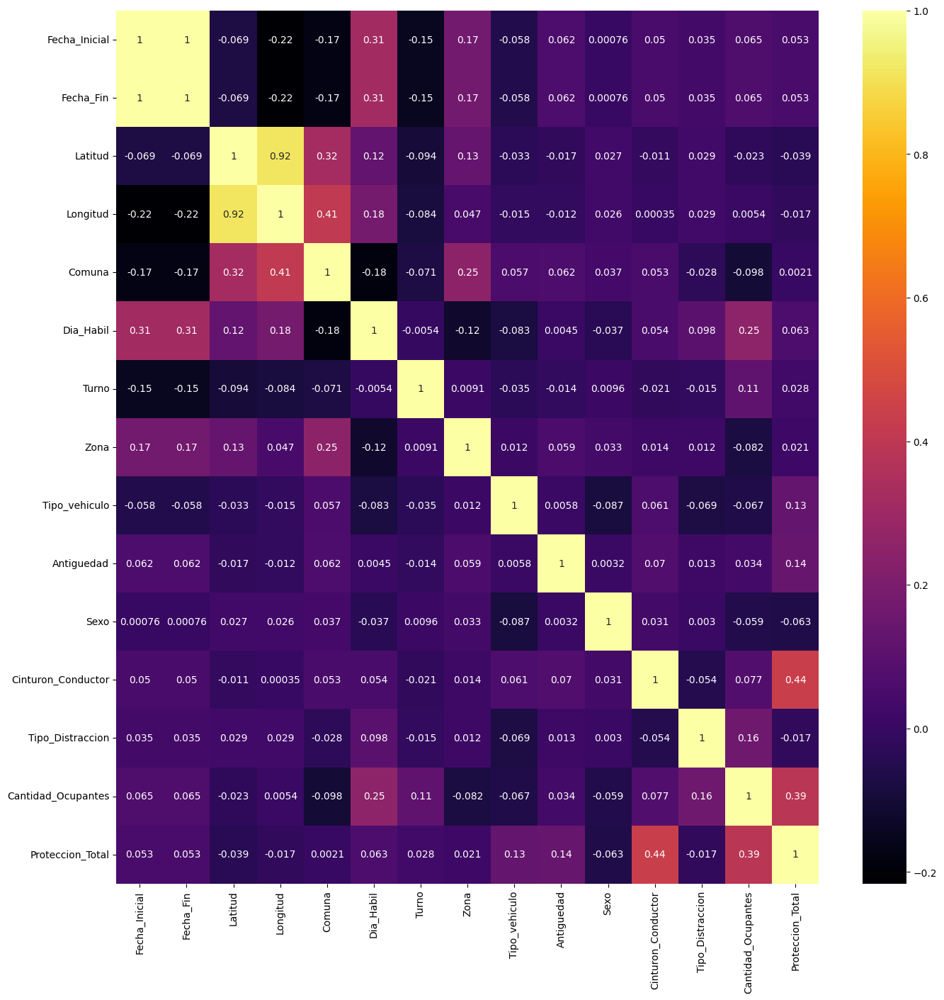

In [ ]:
corr = observacionesautos.select_dtypes(include=["number", "datetime"]).corr()
plt.figure(figsize=(16,16))
sns.heatmap(corr, annot=True, cmap="inferno")

<p>Una posiblemente destacable correlación es la dada entre Cinturon_Conductor y Proteccion_Total, de 0.39, de modo que es posible argumentar que el hecho de que el conductor use o no el cinturón influye en que los demás ocupantes del vehículo lo usen, y por tanto influye en la seguridad total. Además, si es día hábil o no influye un poco en la cantidad de ocupantes (0.25).

###Mapeo de valores

<p>Los valores se mapearán utilizando el documento diccionario_obs_2022.xlsx.

In [73]:
dict_dia_habil = {
    1:"Habil",
    2:"Fin de semana"
}
observacionesautos.Dia_Habil = observacionesautos.Dia_Habil.apply(lambda x: map_valores(x, dict_dia_habil))

dict_turno = {
    1:"Mañana",
    2:"Tarde"
}
observacionesautos.Turno = observacionesautos.Turno.apply(lambda x: map_valores(x, dict_turno))

dict_zona = {
    1:"Centro",
    2:"Norte",
    3:"Occidente",
    4:"Sur"
}
observacionesautos.Zona = observacionesautos.Zona.apply(lambda x: map_valores(x, dict_zona))

dict_tipo_vehiculo = {
    1:"Auto",
    2:"Utilitario"
}
observacionesautos.Tipo_vehiculo = observacionesautos.Tipo_vehiculo.apply(lambda x: map_valores(x, dict_tipo_vehiculo))

dict_antiguedad = {
    1:"Menos de 10 años",
    2:"10 años o más"
}
observacionesautos.Antiguedad = observacionesautos.Antiguedad.apply(lambda x: map_valores(x, dict_antiguedad))

dict_sexo = {
    1:"Masculino",
    2:"Femenino",
    9:"SD"
}
observacionesautos.Sexo = observacionesautos.Sexo.apply(lambda x: map_valores(x, dict_sexo))

dict_si_no = {
    0:"No Aplica",
    1:"Si",
    2:"No",
    9:"SD"
}
observacionesautos.Cinturon_Conductor = observacionesautos.Cinturon_Conductor.apply(lambda x: map_valores(x, dict_si_no))

dict_tipo_distraccion = {
    1:"Celular",
    2:"Fuma",
    3:"Come",
    4:"Ninguno"
}
observacionesautos.Tipo_Distraccion = observacionesautos.Tipo_Distraccion.apply(lambda x: map_valores(x, dict_tipo_distraccion))

observacionesautos.Proteccion_Total = observacionesautos.Proteccion_Total.apply(lambda x: map_valores(x, dict_si_no))

observacionesautos.head()

,Fecha_Inicial,Fecha_Fin,Latitud,Longitud,Comuna,Dia_Habil,Turno,Zona,Tipo_vehiculo,Antiguedad,Sexo,Cinturon_Conductor,Tipo_Distraccion,Cantidad_Ocupantes,Proteccion_Total
0,2022-10-29 08:59:10,2022-10-29 10:02:21,-34.604567,-58.405402,3,Fin de semana,Mañana,Centro,Auto,Menos de 10 años,Masculino,Si,Celular,1,Si
1,2022-10-29 10:02:23,2022-10-29 10:02:58,-34.604567,-58.405402,3,Fin de semana,Mañana,Centro,Auto,Menos de 10 años,Masculino,No,Ninguno,4,No
2,2022-10-29 10:03:00,2022-10-29 10:03:48,-34.604567,-58.405402,3,Fin de semana,Mañana,Centro,Auto,Menos de 10 años,Masculino,Si,Celular,1,Si
3,2022-10-29 10:03:48,2022-10-29 10:04:19,-34.604567,-58.405402,3,Fin de semana,Mañana,Centro,Auto,Menos de 10 años,Masculino,No,Ninguno,1,No
4,2022-10-29 10:04:21,2022-10-29 10:04:31,-34.604567,-58.405402,3,Fin de semana,Mañana,Centro,Auto,10 años o más,Masculino,No,Ninguno,1,No


###Exportar

In [74]:
observacionesautos.to_csv("observacionesautos.csv", index=False)

###  Análisis multivariable

####Tipos de distracción

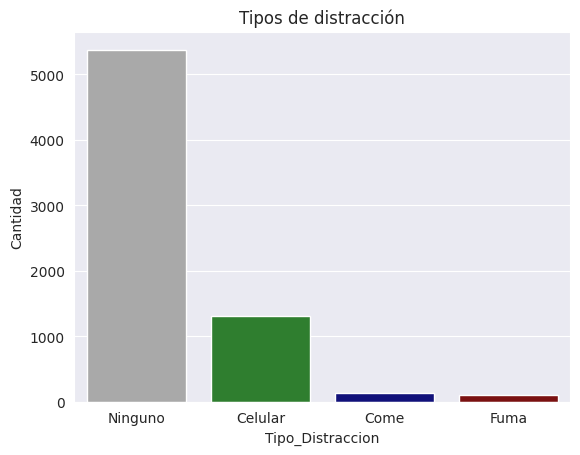

In [78]:
tipos_distraccion = observacionesautos.Tipo_Distraccion.value_counts().reset_index()
tipos_distraccion.columns = ["Tipo_Distraccion", "Cantidad"]
fig = sns.barplot(x="Tipo_Distraccion", y="Cantidad", data=tipos_distraccion, palette={"Celular":"forestgreen", "Fuma":"darkred", "Come":"darkblue", "Ninguno":"darkgrey"}).set(title="Tipos de distracción")

####Columnas categóricas respecto a la cantidad (de registros) y a la protección total

<p>Entiéndase por protección total a si todos los pasajeros y el conductor del vehículo tienen todas las protecciones adecuadas.

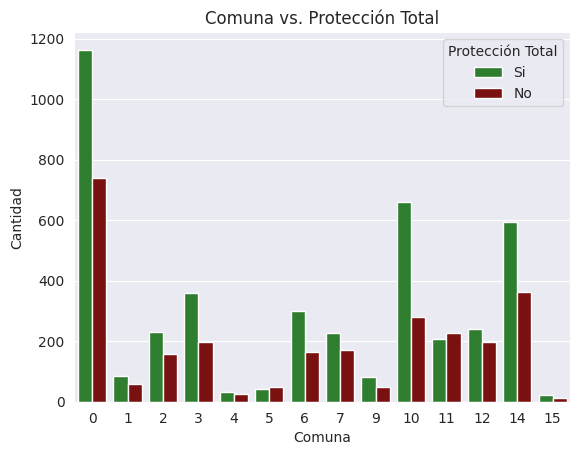

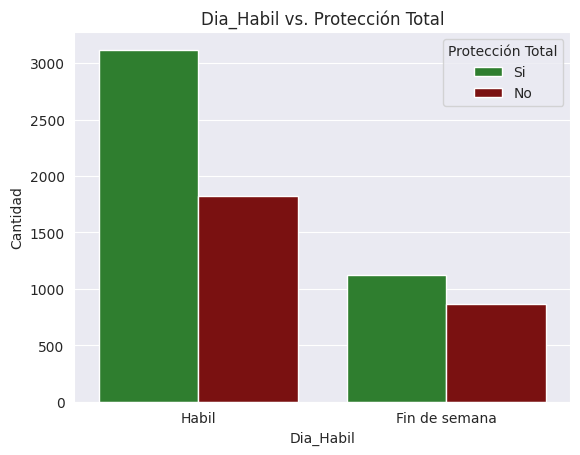

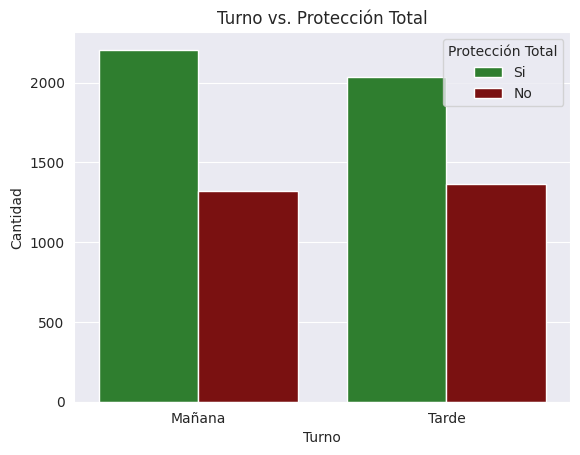

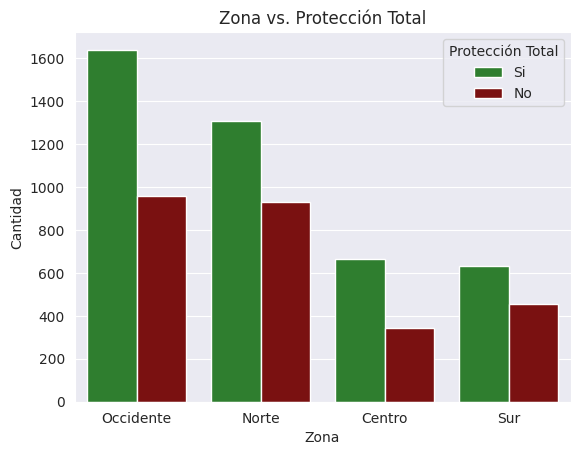

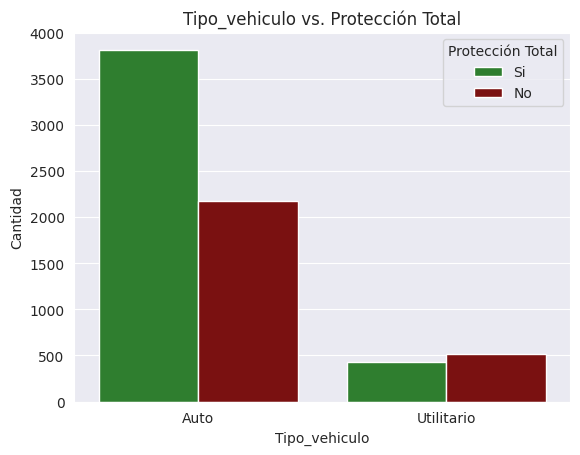

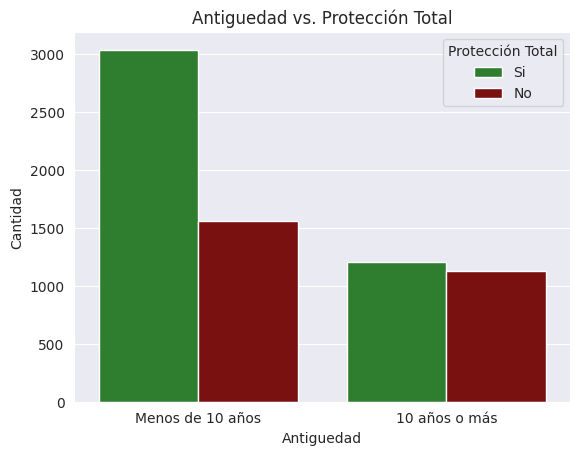

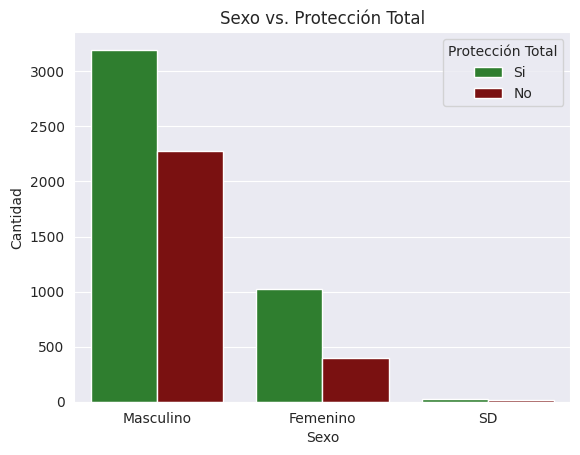

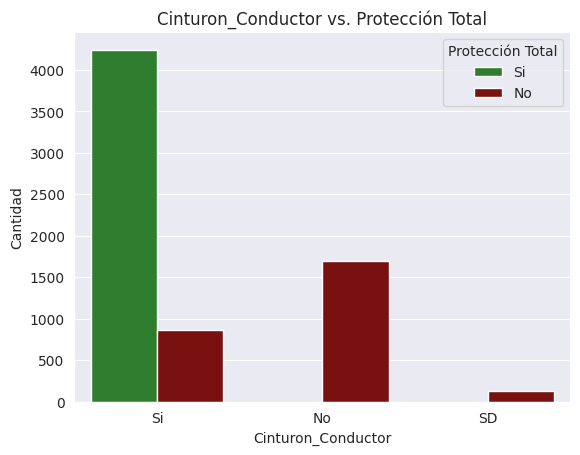

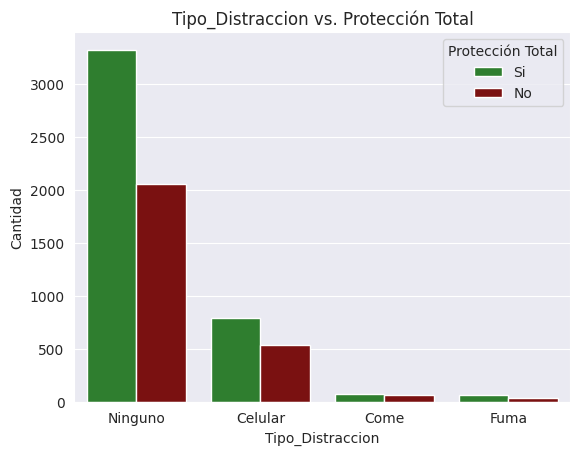

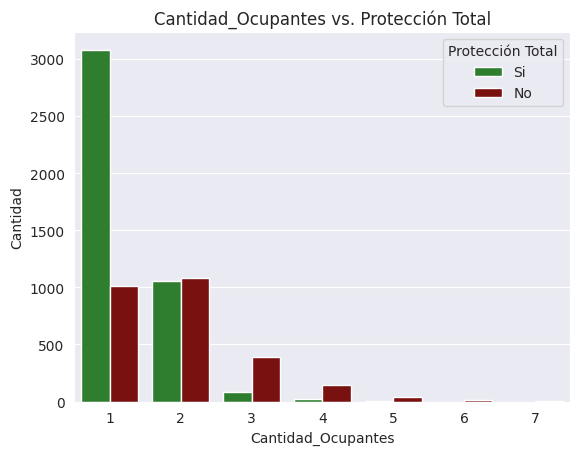

In [75]:
for col in [col for col in observacionesautos.columns if col not in ["Fecha_Inicial", "Fecha_Fin", "Latitud", "Longitud", "Proteccion_Total"]]:
  obsautos_dia = observacionesautos[[col,"Proteccion_Total"]].value_counts().reset_index()
  obsautos_dia.columns = [col, "Protección Total", "Cantidad"]
  sns.barplot(x=col, y="Cantidad", hue="Protección Total", data=obsautos_dia, palette={"Si":"forestgreen", "No":"darkred"}).set(title=f"{col} vs. Protección Total")
  plt.show()

Algunos puntos a destacar:
- La diferencia de autos con protección total vs. sin protección total es mayor en proporción en días hábiles que en fin de semana.
- Los vehículos de tipo Utilitario (vehículos livianos hasta 3500 Kg. de peso total con carga, destinados al transporte de mercancías exclusivamente) son más propensos a no tener la protección total que a tenerla.
- Los vehículos de menos de 10 años tienden más a tener protección total.
- Hay casos donde a pesar de tener protección total, el conductor del vehículo iba distraido (la mayoría de veces con el celular).
- Hay casos donde se excedió la capacidad del vehículo (hasta 7 ocupantes).

####Información por comunas

In [ ]:
observacionesautos.Comuna.unique()

array([ 3,  2, 14,  0, 10,  1,  4,  6, 12,  7, 15,  9, 11,  5])

In [93]:
obsautos_proteccion = observacionesautos.groupby("Comuna").size().reset_index()
obsautos_proteccion.columns = ["Comuna", "Cantidad"]
fig = px.choropleth(obsautos_proteccion, geojson=comunas, locations="Comuna", color="Cantidad", color_continuous_scale="inferno", featureidkey="properties.COMUNAS", fitbounds="locations")
fig.show()

##Estudios para motos

In [105]:
observacionesmotos = pd.read_excel("base_obs_motos_2022.xlsx")
observacionesmotos.head()

,Norden,Fecha_Inicial,Hora_Inicio,Fecha_Fin,Hora_Fin,Dia_Habil,Turno,Punto_observacion,Zona,Uso,...,Casco_Conductor,Tipo_Distraccion,Pasajero,Sexo_Pasajero,Casco_Pasajero,Tiene_Patente,Patente_Mercosur,Antiguedad,Cantidad_Ocupantes,Uso_Casco
0,1,2022-10-25,15:50:12,2022-10-25,15:53:06,1,2,AV. CORRIENTES Y AV. DORREGO,3,1,...,1,1,NaN,NaN,NaN,1,2,2,1,1
1,2,2022-10-25,15:53:16,2022-10-25,15:59:06,1,2,AV. MONTES DE OCA Y ARISTOBULO DEL VALLE,4,1,...,1,4,NaN,NaN,NaN,1,1,1,1,1
2,3,2022-10-25,08:19:26,2022-10-25,09:07:37,1,1,AV. NAZCA Y AV. JUAN B. JUSTO,3,1,...,1,4,NaN,NaN,NaN,1,1,1,1,1
3,4,2022-10-25,08:56:21,2022-10-25,08:56:37,1,1,AV. EMILIO CASTRO Y CORVALAN,1,1,...,1,4,NaN,NaN,NaN,1,1,1,1,1
4,5,2022-10-25,08:56:44,2022-10-25,09:00:53,1,1,AV. DEL LIBERTADOR Y ARIAS,1,1,...,1,4,NaN,NaN,NaN,1,2,2,1,1


In [106]:
observacionesmotos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2477 entries, 0 to 2476
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Norden              2477 non-null   int64         
 1   Fecha_Inicial       2477 non-null   datetime64[ns]
 2   Hora_Inicio         2477 non-null   object        
 3   Fecha_Fin           2477 non-null   datetime64[ns]
 4   Hora_Fin            2477 non-null   object        
 5   Dia_Habil           2477 non-null   int64         
 6   Turno               2477 non-null   int64         
 7   Punto_observacion   2477 non-null   object        
 8   Zona                2477 non-null   int64         
 9   Uso                 2477 non-null   int64         
 10  Sexo                2477 non-null   int64         
 11  Casco_Conductor     2477 non-null   int64         
 12  Tipo_Distraccion    2477 non-null   int64         
 13  Pasajero            298 non-null    float64     

<p>De igual forma a como se hizo anteriormente, se añadirán las comunas, se combinarán las fechas y horas y se seleccionarán las columnas con las que se trabajará.

In [107]:
localizaciones = pd.DataFrame(observacionesmotos.Punto_observacion.unique(), columns=["Punto_observacion"])
for tuple in localizaciones.itertuples():
  latlon = geocoder.geocode(tuple.Punto_observacion+", Buenos Aires, Argentina")
  if "county" in latlon.raw["properties"]:
    localizaciones.loc[tuple.Index, "Comuna"] = str(latlon.raw["properties"]["county"]).split()[-1]
  else:
    localizaciones.loc[tuple.Index, "Comuna"] = "0"
  localizaciones.loc[tuple.Index, "Latitud"] = latlon.latitude
  localizaciones.loc[tuple.Index, "Longitud"] = latlon.longitude

patron = re.compile("[0-9]+")
localizaciones.Comuna = localizaciones.Comuna.apply(lambda x: 14 if x == "Audiovisual" else 4 if x == "Artes" else int(x) if patron.match(x) else 0)
localizaciones.head()

,Punto_observacion,Comuna,Latitud,Longitud
0,AV. CORRIENTES Y AV. DORREGO,14,-34.591533,-58.447279
1,AV. MONTES DE OCA Y ARISTOBULO DEL VALLE,0,-37.312387,-59.977642
2,AV. NAZCA Y AV. JUAN B. JUSTO,11,-34.618655,-58.475524
3,AV. EMILIO CASTRO Y CORVALAN,0,-36.859966,-60.257079
4,AV. DEL LIBERTADOR Y ARIAS,0,-34.502561,-58.481980


In [108]:
observacionesmotos.Hora_Fin

0       15:53:06
1       15:59:06
2       09:07:37
3       08:56:37
4       09:00:53
          ...   
2472    11:00:00
2473    11:00:00
2474    11:00:00
2475    11:01:00
2476    0.459028
Name: Hora_Fin, Length: 2477, dtype: object

In [109]:
observacionesmotos.loc[2476, "Hora_Fin"] = pd.to_datetime("11:01:02", format="%H:%M:%S", errors="coerce")
observacionesmotos.loc[2476].Hora_Fin

Timestamp('1900-01-01 11:01:02')

In [110]:
observacionesmotos = pd.merge(observacionesmotos, localizaciones, on="Punto_observacion")

observacionesmotos["Fecha_Inicial"] = pd.to_datetime(observacionesmotos["Fecha_Inicial"].astype(str) + " " + observacionesmotos["Hora_Inicio"].astype(str), format="mixed", errors="coerce")
observacionesmotos["Fecha_Fin"] = pd.to_datetime(observacionesmotos["Fecha_Fin"].astype(str) + " " + observacionesmotos["Hora_Fin"].astype(str), format="mixed", errors="coerce")

observacionesmotos = observacionesmotos[["Fecha_Inicial", "Fecha_Fin", "Latitud", "Longitud", "Comuna", "Dia_Habil", "Turno", "Zona", "Uso", "Sexo", "Casco_Conductor", "Tipo_Distraccion", "Cantidad_Ocupantes", "Uso_Casco"]]
observacionesmotos.head()

,Fecha_Inicial,Fecha_Fin,Latitud,Longitud,Comuna,Dia_Habil,Turno,Zona,Uso,Sexo,Casco_Conductor,Tipo_Distraccion,Cantidad_Ocupantes,Uso_Casco
0,2022-10-25 15:50:12,2022-10-25 15:53:06,-34.591533,-58.447279,14,1,2,3,1,1,1,1,1,1
1,2022-10-25 09:13:46,2022-10-25 09:15:57,-34.591533,-58.447279,14,1,1,3,1,2,1,1,1,1
2,2022-10-25 09:25:47,2022-10-25 09:30:36,-34.591533,-58.447279,14,1,1,3,1,1,1,4,1,1
3,2022-10-25 09:54:47,2022-10-25 09:55:08,-34.591533,-58.447279,14,1,1,3,1,1,1,4,1,1
4,2022-10-25 15:42:52,2022-10-25 15:44:02,-34.591533,-58.447279,14,1,2,3,1,1,1,4,1,1


In [111]:
observacionesmotos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2477 entries, 0 to 2476
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Fecha_Inicial       2477 non-null   datetime64[ns]
 1   Fecha_Fin           2477 non-null   object        
 2   Latitud             2477 non-null   float64       
 3   Longitud            2477 non-null   float64       
 4   Comuna              2477 non-null   int64         
 5   Dia_Habil           2477 non-null   int64         
 6   Turno               2477 non-null   int64         
 7   Zona                2477 non-null   int64         
 8   Uso                 2477 non-null   int64         
 9   Sexo                2477 non-null   int64         
 10  Casco_Conductor     2477 non-null   int64         
 11  Tipo_Distraccion    2477 non-null   int64         
 12  Cantidad_Ocupantes  2477 non-null   int64         
 13  Uso_Casco           2477 non-null   int64       

In [112]:
for col in observacionesmotos.columns:
  print(col)
  print(observacionesmotos[col].unique())
  print()

Fecha_Inicial
<DatetimeArray>
['2022-10-25 15:50:12', '2022-10-25 09:13:46', '2022-10-25 09:25:47',
 '2022-10-25 09:54:47', '2022-10-25 15:42:52', '2022-10-25 09:15:57',
 '2022-10-25 09:30:38', '2022-10-25 09:55:08', '2022-10-25 15:44:03',
 '2022-10-25 15:53:06',
 ...
 '2022-11-03 10:10:00', '2022-11-03 10:15:00', '2022-11-03 10:19:00',
 '2022-11-03 10:26:00', '2022-11-03 10:32:00', '2022-11-03 10:33:00',
 '2022-11-03 10:46:00', '2022-11-03 10:54:00', '2022-11-03 10:57:00',
 '2022-11-03 11:01:00']
Length: 2004, dtype: datetime64[ns]

Fecha_Fin
[datetime.datetime(2022, 10, 25, 15, 53, 6)
 datetime.datetime(2022, 10, 25, 9, 15, 57)
 datetime.datetime(2022, 10, 25, 9, 30, 36) ...
 datetime.datetime(2022, 11, 3, 10, 57)
 datetime.datetime(2022, 11, 3, 11, 1)
 datetime.datetime(2022, 11, 3, 11, 1, 2, tzinfo=tzoffset(None, -3600))]

Latitud
[-34.5915329  -37.3123875  -34.6186547  -36.85996605 -34.5025614
 -34.6040661  -34.6757181  -34.5745309  -34.632068   -34.6479536
 -34.6046619  -34.61189

###Análisis de correlación

<p>Antes de mapear los valores de las columnas con su significado, se hará el análisis de correlaciones.

<Axes: >

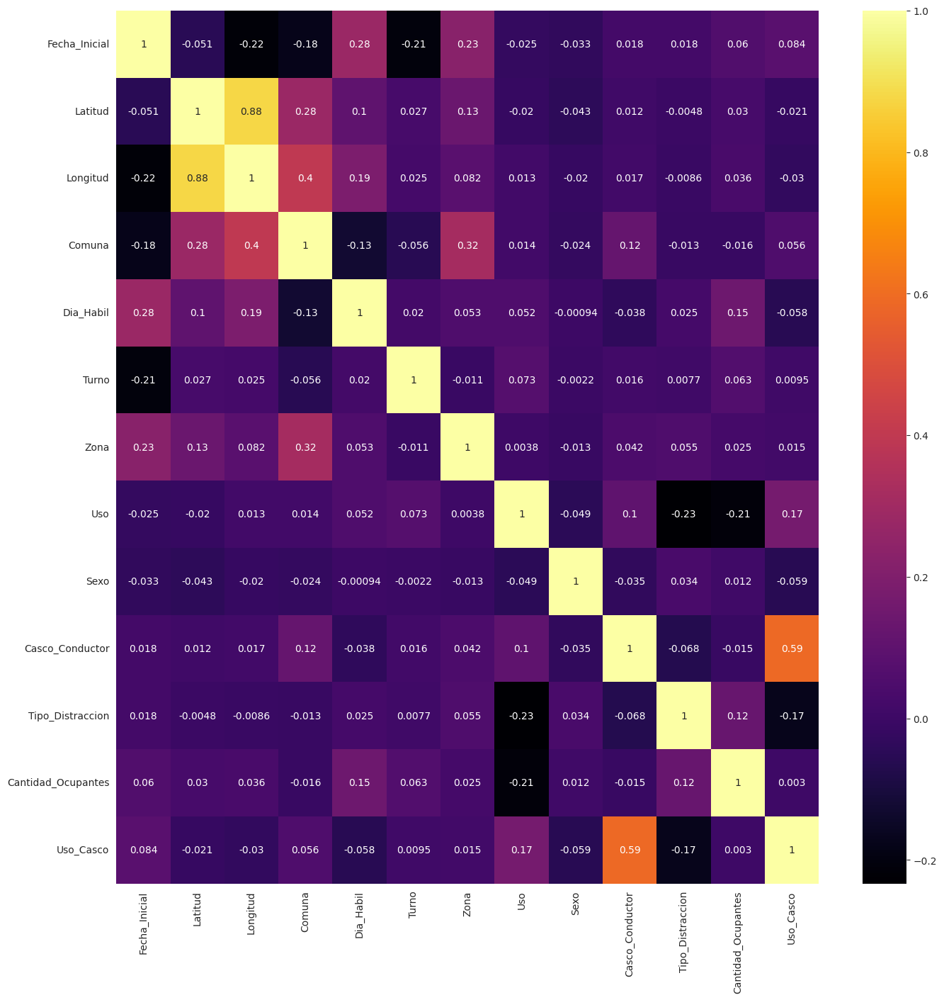

In [113]:
corr = observacionesmotos.select_dtypes(include=["number", "datetime"]).corr()
plt.figure(figsize=(16,16))
sns.heatmap(corr, annot=True, cmap="inferno")

<p>No parece haber relaciones a destacar. Tal vez pueda estudiarse la relación entre la cantidad de ocupantes y el sexo y uso de casco del pasajero.

###Mapeo de variables

<p>Los valores se mapearán utilizando el documento diccionario_obs_2022.xlsx.

In [114]:
observacionesmotos.Tipo_Distraccion.unique()

array([1, 4, 2, 3])

In [115]:
observacionesmotos.Dia_Habil = observacionesmotos.Dia_Habil.apply(lambda x: map_valores(x, dict_dia_habil))

observacionesmotos.Turno = observacionesmotos.Turno.apply(lambda x: map_valores(x, dict_turno))

observacionesmotos.Zona = observacionesmotos.Zona.apply(lambda x: map_valores(x, dict_zona))

dict_uso = {
    1:"Particular",
    2:"Comercial"
}
observacionesmotos.Uso = observacionesmotos.Uso.apply(lambda x: map_valores(x, dict_uso))

observacionesmotos.Sexo = observacionesmotos.Sexo.apply(lambda x: map_valores(x, dict_sexo))

observacionesmotos.Casco_Conductor = observacionesmotos.Casco_Conductor.apply(lambda x: map_valores(x, dict_si_no))

observacionesmotos.Tipo_Distraccion = observacionesmotos.Tipo_Distraccion.apply(lambda x: map_valores(x, dict_tipo_distraccion))

observacionesmotos.Uso_Casco = observacionesmotos.Uso_Casco.apply(lambda x: map_valores(x, dict_si_no))

observacionesmotos.head()

,Fecha_Inicial,Fecha_Fin,Latitud,Longitud,Comuna,Dia_Habil,Turno,Zona,Uso,Sexo,Casco_Conductor,Tipo_Distraccion,Cantidad_Ocupantes,Uso_Casco
0,2022-10-25 15:50:12,2022-10-25 15:53:06,-34.591533,-58.447279,14,Habil,Tarde,Occidente,Particular,Masculino,Si,Celular,1,Si
1,2022-10-25 09:13:46,2022-10-25 09:15:57,-34.591533,-58.447279,14,Habil,Mañana,Occidente,Particular,Femenino,Si,Celular,1,Si
2,2022-10-25 09:25:47,2022-10-25 09:30:36,-34.591533,-58.447279,14,Habil,Mañana,Occidente,Particular,Masculino,Si,Ninguno,1,Si
3,2022-10-25 09:54:47,2022-10-25 09:55:08,-34.591533,-58.447279,14,Habil,Mañana,Occidente,Particular,Masculino,Si,Ninguno,1,Si
4,2022-10-25 15:42:52,2022-10-25 15:44:02,-34.591533,-58.447279,14,Habil,Tarde,Occidente,Particular,Masculino,Si,Ninguno,1,Si


###Exportar datos

In [119]:
observacionesmotos.to_csv("observacionesmotos.csv", index=False)

###Análisis multivariable

####Distracciones

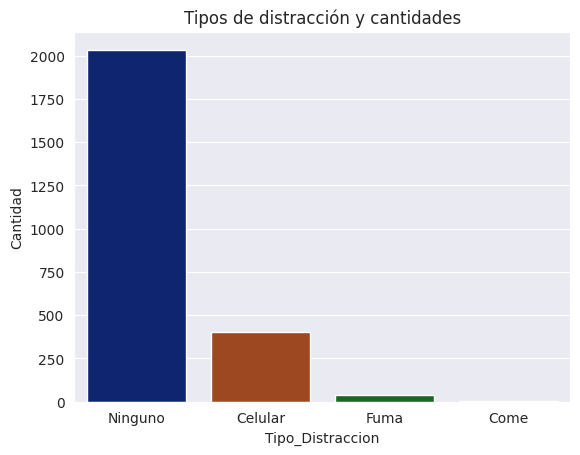

In [124]:
distracciones = observacionesmotos.groupby(["Tipo_Distraccion"]).size().reset_index()
distracciones.columns = ["Tipo_Distraccion", "Cantidad"]
fig = sns.barplot(x="Tipo_Distraccion", y="Cantidad", hue="Tipo_Distraccion", data=distracciones.sort_values(by="Cantidad", ascending=False), palette="dark").set_title("Tipos de distracción y cantidades")

<p>La distracción más común es el celular, mientras que la cantidad de distracciones por comida es cercana a cero.

####Cantidad de ocupantes

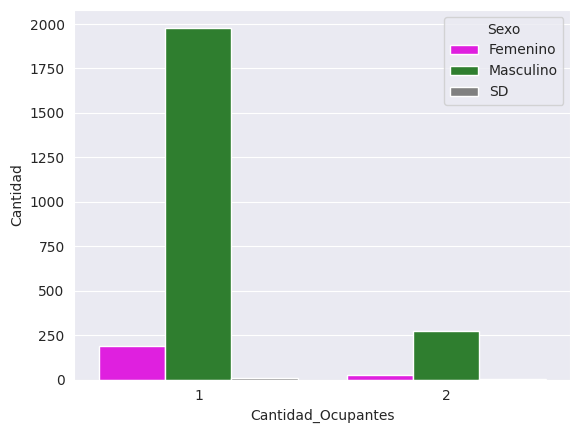

In [116]:
ocupantes = observacionesmotos.groupby(["Cantidad_Ocupantes","Sexo"]).size().reset_index()
ocupantes.columns = ["Cantidad_Ocupantes", "Sexo", "Cantidad"]
fig = sns.barplot(x="Cantidad_Ocupantes", y="Cantidad", hue="Sexo", data=ocupantes, palette={"Femenino":"magenta", "Masculino":"forestgreen", "SD":"gray"})

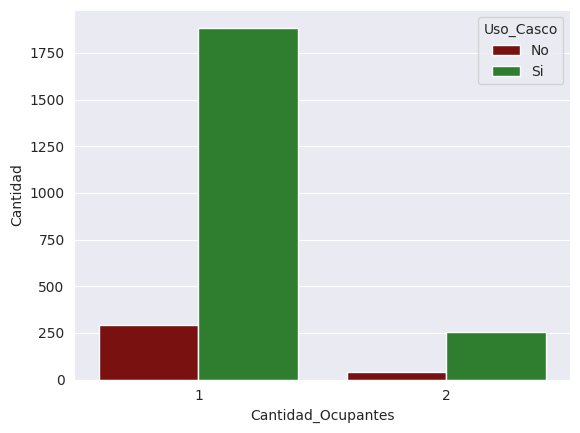

In [117]:
ocupantes = observacionesmotos.groupby(["Cantidad_Ocupantes","Uso_Casco"]).size().reset_index()
ocupantes.columns = ["Cantidad_Ocupantes", "Uso_Casco", "Cantidad"]
fig = sns.barplot(x="Cantidad_Ocupantes", y="Cantidad", hue="Uso_Casco", data=ocupantes, palette={"Si":"forestgreen", "No":"darkred"})

####Columnas categóricas respecto a la cantidad (de registros) y al uso del casco

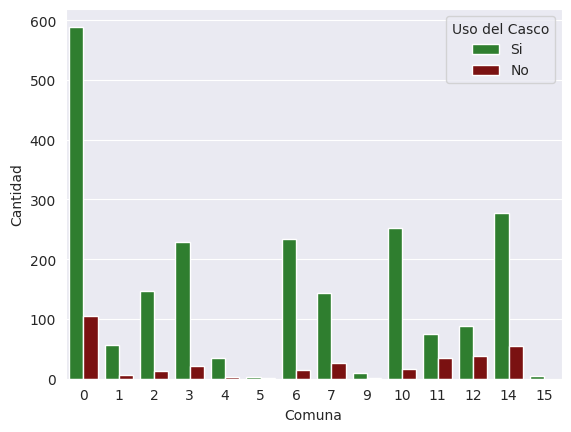

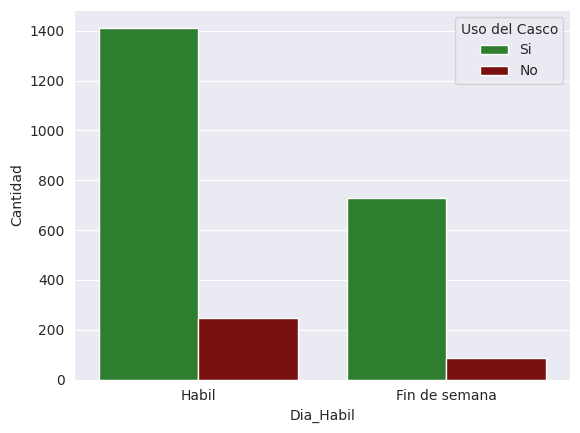

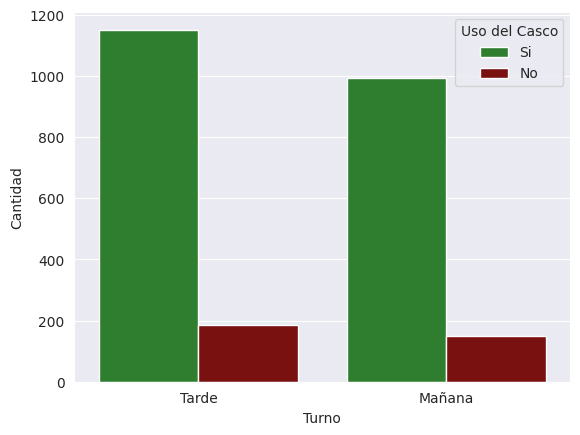

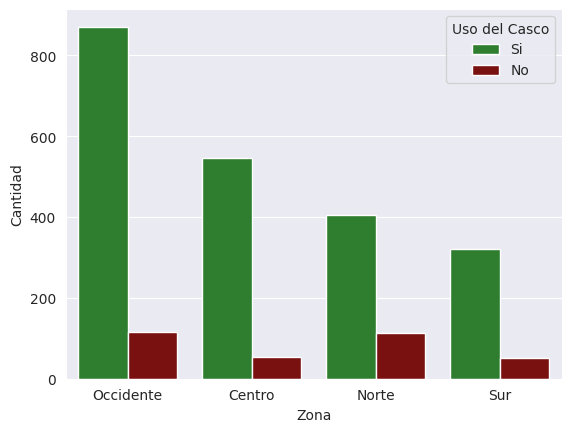

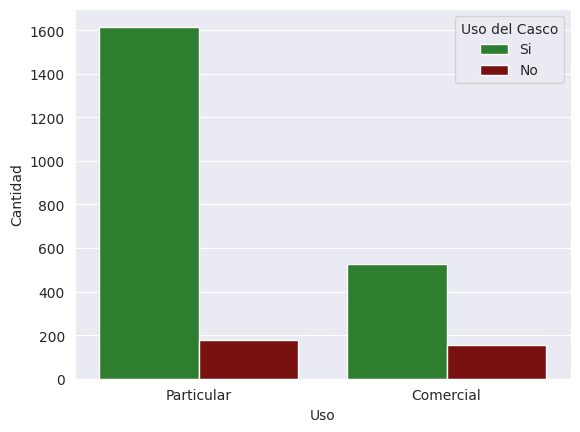

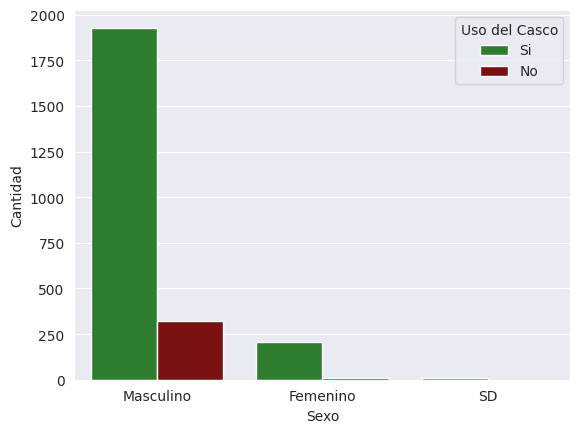

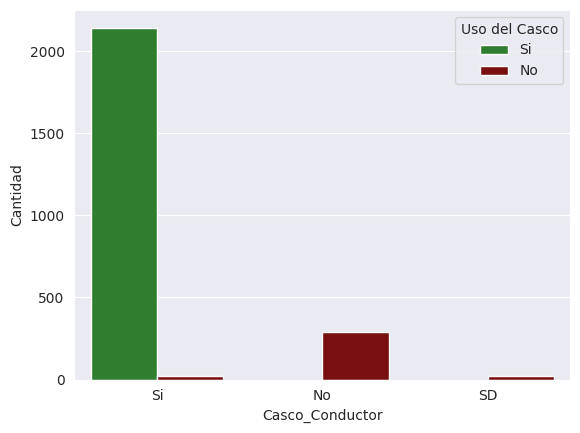

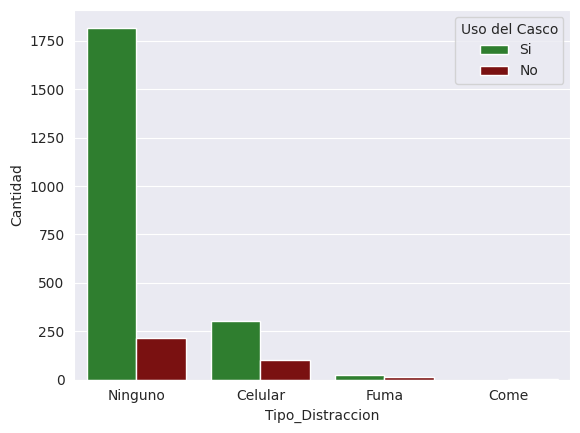

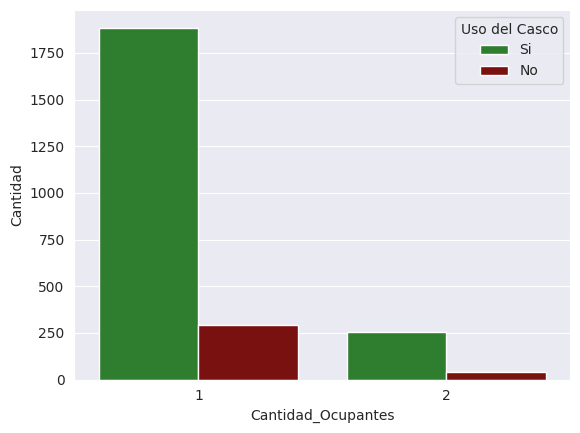

In [120]:
for col in [col for col in observacionesmotos.columns if col not in ["Fecha_Inicial", "Fecha_Fin", "Latitud", "Longitud", "Uso_Casco"]]:
  obsmotos_dia = observacionesmotos[[col,"Uso_Casco"]].value_counts().reset_index()
  obsmotos_dia.columns = [col, "Uso del Casco", "Cantidad"]
  sns.barplot(x=col, y="Cantidad", hue="Uso del Casco", data=obsmotos_dia, palette={"Si":"forestgreen", "No":"darkred"})
  plt.show()

Algunos aspectos a destacar:
- Según la proporción, las mujeres tienden a usar el casco más que los hombres.
- Además, los conductores de motocicletas particulares usan más el casco que los comerciales.
- Como pasaba con los carros, la forma de distracción más común son los celulares.

####Comunas

In [127]:
obsmotos_proteccion = observacionesmotos.groupby("Comuna").size().reset_index()
obsmotos_proteccion.columns = ["Comuna", "Cantidad"]
fig = px.choropleth(obsmotos_proteccion, geojson=comunas, locations="Comuna", color="Cantidad", color_continuous_scale="inferno", featureidkey="properties.COMUNAS", fitbounds="locations")
fig.show()

#Flujo vehicular

<p>A continuación se analizará el dataset de flujo vehicular proporcionado entre marzo de 2020 y febrero de 2022.

In [128]:
flujo_vehicular = pd.read_excel("dataset_flujo_vehicular.xlsx")
flujo_vehicular.columns = [col.lower() for col in flujo_vehicular.columns]
flujo_vehicular.head()

,codigo_locacion,hora,cantidad,sentido,latitud,longitud
0,48Q3CJ00+,2020-03-31 15:00:00,729,Interna,-34.588796,-58.381520
1,48Q3CJ00+,2020-03-31 15:00:00,447,Egreso,-34.588796,-58.381520
2,48Q39G00+,2020-03-31 15:00:00,175,Interna,-34.633299,-58.468594
3,48Q39G00+,2020-03-31 15:00:00,1186,Egreso,-34.633299,-58.468594
4,48Q3CH00+,2020-03-31 15:00:00,35,Egreso,-34.579632,-58.427733


In [129]:
flujo_vehicular.rename(columns={"latitud":"lon","longitud":"lat"}, inplace=True)
flujo_vehicular.head()

,codigo_locacion,hora,cantidad,sentido,lon,lat
0,48Q3CJ00+,2020-03-31 15:00:00,729,Interna,-34.588796,-58.381520
1,48Q3CJ00+,2020-03-31 15:00:00,447,Egreso,-34.588796,-58.381520
2,48Q39G00+,2020-03-31 15:00:00,175,Interna,-34.633299,-58.468594
3,48Q39G00+,2020-03-31 15:00:00,1186,Egreso,-34.633299,-58.468594
4,48Q3CH00+,2020-03-31 15:00:00,35,Egreso,-34.579632,-58.427733


In [130]:
flujo_vehicular.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189814 entries, 0 to 189813
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   codigo_locacion  189814 non-null  object        
 1   hora             189814 non-null  datetime64[ns]
 2   cantidad         189814 non-null  int64         
 3   sentido          189814 non-null  object        
 4   lon              186412 non-null  float64       
 5   lat              186412 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(2)
memory usage: 8.7+ MB


##Ubicación de los sensores

<p>A continuación se muestra una imagen de la ubicación de los sensores.

In [ ]:
flujo_vehicular["codigo_locacion"].unique()

array(['48Q3CJ00+', '48Q39G00+', '48Q3CH00+', '48Q39J00+', '48Q3FG00+',
       '48Q39H00+', '27262200+', '2H2M2200+', '39H7JC00+'], dtype=object)

In [132]:
fig = px.scatter_mapbox(flujo_vehicular, lat="lon", lon="lat", color="codigo_locacion", zoom=10, height=600)
fig.update_layout(mapbox_style="carto-positron")

<p>En general, parece haber más sensores en la zona central, y uno en las que corresponderían al norte y al oeste.

##Histórico de los datos

<p>Para el análisis histórico de los datos, se discriminará en los tres sentidos incluidos (Interno, Egreso, Ingreso).

Sentido: Interna
Histórico de los datos en el tiempo


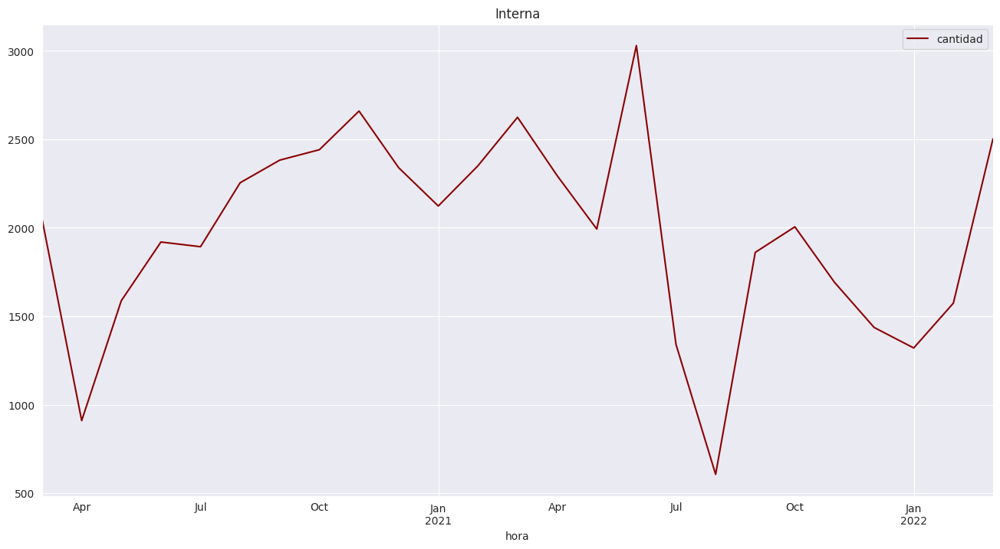


Histórico de los datos por sensor


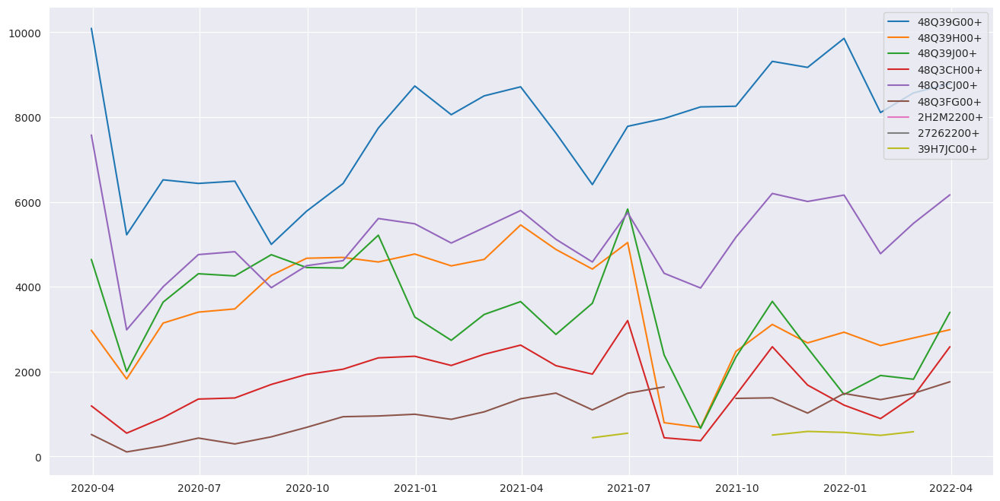


Cantidad de datos totales por sensor


Sentido: Egreso
Histórico de los datos en el tiempo


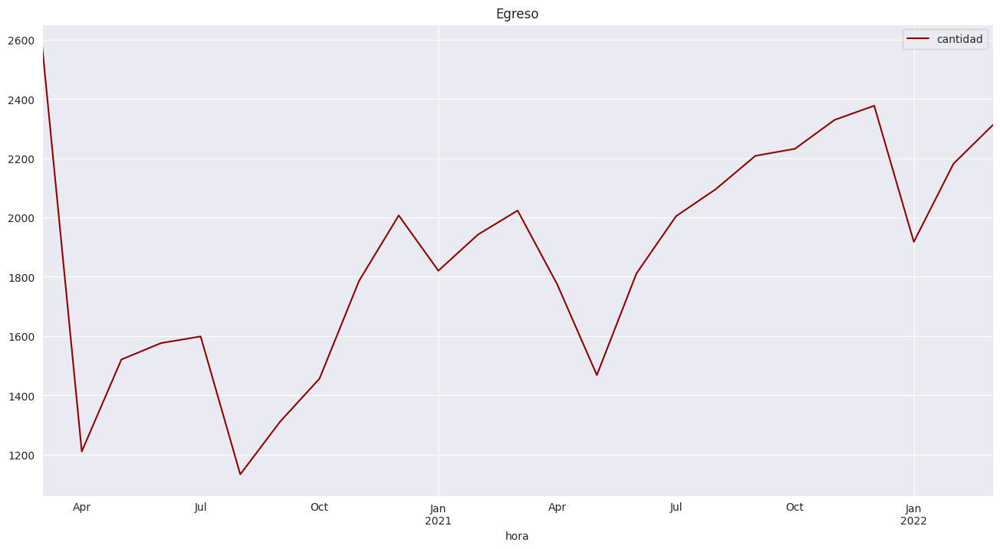


Histórico de los datos por sensor


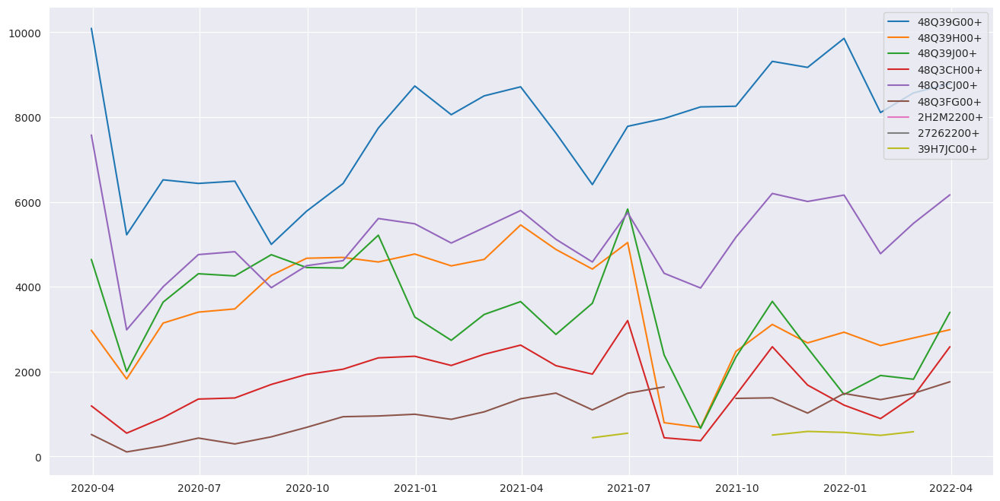


Cantidad de datos totales por sensor


Sentido: Ingreso
Histórico de los datos en el tiempo


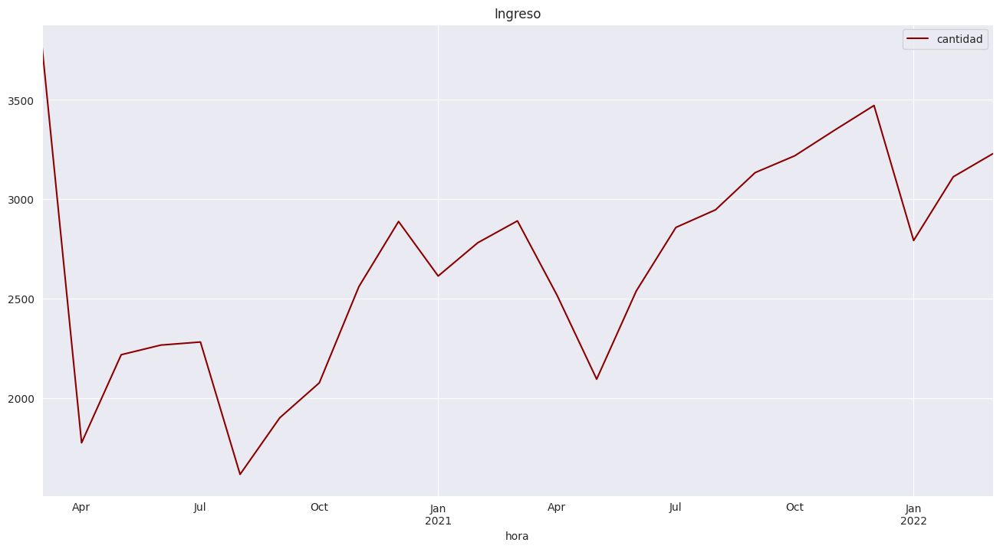


Histórico de los datos por sensor


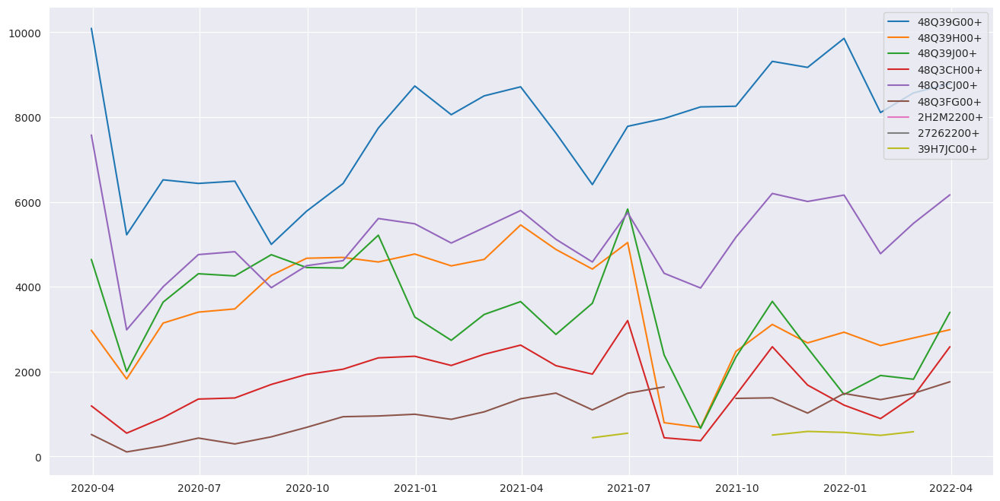


Cantidad de datos totales por sensor


In [133]:
for sentido in flujo_vehicular.sentido.unique():
  print(f"\033[1mSentido: {sentido}\033[0m")
  print("Histórico de los datos en el tiempo")
  flujo_vehicular_sentido = flujo_vehicular[flujo_vehicular.sentido == sentido][["hora", "cantidad"]]
  flujo_vehicular_sentido.set_index(pd.DatetimeIndex(flujo_vehicular_sentido.hora), inplace=True)
  flujo_vehicular_sentido.drop(columns="hora", inplace=True)
  flujo_vehicular_sentido.resample("M").mean().plot(figsize=(16,8), title=sentido, color="darkred")
  plt.show()

  print("\nHistórico de los datos por sensor")
  flujo_vehicular_sentido = flujo_vehicular.groupby(["hora", "codigo_locacion"])["cantidad"].sum().reset_index()
  flujo_vehicular_sentido.set_index(pd.DatetimeIndex(flujo_vehicular_sentido.hora), inplace=True)
  flujo_vehicular_sentido.drop(columns="hora", inplace=True)
  plt.figure(figsize=(16,8))
  for codigo in flujo_vehicular_sentido["codigo_locacion"].drop_duplicates().values:
    plt.plot(flujo_vehicular_sentido[(flujo_vehicular_sentido.codigo_locacion == codigo)].drop(columns=["codigo_locacion"]).resample("M").mean(), label=codigo)
  plt.legend()
  plt.show()

  print("\nCantidad de datos totales por sensor")
  flujo_vehicular_sentido = flujo_vehicular.groupby(["lat", "lon"])["cantidad"].sum().reset_index()
  fig = px.scatter_mapbox(flujo_vehicular_sentido, lat="lon", lon="lat", color="cantidad", size="cantidad", zoom=10, height=600)
  fig.update_layout(mapbox_style="carto-positron")
  fig.show()

<p>En todos los casos, el sensor ubicado al oeste fue el que recogió más datos, y el ubicado al norte el que menos.